# Setting

## Library

In [1]:
import pandas as pd
import numpy as np
import math

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
import random
import os
from tqdm.notebook import tqdm

In [4]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

In [5]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score # 정확도
from sklearn.metrics import precision_score # 정밀도
from sklearn.metrics import recall_score # 재현율
from sklearn.metrics import f1_score # F1-Score
from sklearn.metrics import confusion_matrix

## Seed

In [6]:
def my_seed_everywhere(seed):
    random.seed(seed) # random
    np.random.seed(seed) # numpy
    os.environ["PYTHONHASHSEED"] = str(seed) # os
    print(f'고정된 Seed : {seed}')

In [7]:
my_seed_everywhere(42)

고정된 Seed : 42


# Data Set

In [8]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [9]:
path_file = '/content/drive/MyDrive/UNIST/AICP/data/dynmom_dat.csv'

df = pd.read_csv(path_file)

# Preprocessing

In [10]:
def preprocessing(data, used=None):
  # 'DATE'를 칼럼 대신 인덱스로 사용
  data.index = data['DATE']
  data = data.drop(columns='DATE')
  print("'DATE'를 칼럼 대신 인덱스로 사용")

  # 결측치 제거 및 모델 학습에 불필요한 칼럼 제거
  data = data.dropna()
  data = data.drop(columns=['winner', 'loser', 'form_date'])
  print("결측치 제거 및 모델 학습에 불필요한 칼럼 제거 ('winner', 'loser', 'form_date')")

  if used != None:
    used += ['wml']
    D = ', '.join(used)
    data = data[used]
    print(f"훈련에 사용되는 변수 들 : {D}")

  return data

In [11]:
df = preprocessing(df,
                   used=['mvol_cum6', 'cum_winner_t_2_4', 'cum_winner_t_5_8', 'cum_winner_t_9_12', 'cum_loser'])

'DATE'를 칼럼 대신 인덱스로 사용
결측치 제거 및 모델 학습에 불필요한 칼럼 제거 ('winner', 'loser', 'form_date')
훈련에 사용되는 변수 들 : mvol_cum6, cum_winner_t_2_4, cum_winner_t_5_8, cum_winner_t_9_12, cum_loser, wml


In [12]:
def normal_wml(df):
  print("'wml'이 양수면 1 & 음수면 0")
  print("Output : 'Preprocessed_Data' & 'WML'")
  print()

  cond_wml = (df['wml']>=0)
  df.loc[cond_wml, 'pos_wml'] = 1
  df.loc[~cond_wml, 'pos_wml'] = 0
  WML = df[['wml']]

  df.drop(columns=['wml'], inplace=True)

  POS_WML = df['pos_wml'].value_counts()
  print(f'Ratio : {POS_WML[0]/POS_WML[1]}')
  print(POS_WML)

  return df, WML

In [13]:
dynmom, WML = normal_wml(df)

'wml'이 양수면 1 & 음수면 0
Output : 'Preprocessed_Data' & 'WML'

Ratio : 0.5634379263301501
1.0    733
0.0    413
Name: pos_wml, dtype: int64


# Modeling

In [14]:
def Roling_Windows(data, window_size, method, model, model_name, plot=True, plot_feature=True):

  # 학습 및 테스트 데이터 정보 & 실제값과 예측값 정보 수집
  result_dict = {
    'TRAIN_START_DATE':[],
    'TRAIN_END_DATE':[],
    'TEST_DATE':[],
    'Actual_POS_WML':[],
    f'{model_name}_PRED_POS_WML':[],
    f'{model_name}_PROB_POS_WML':[]
  }

  df_feature = pd.DataFrame()

  # 모델 학습이 종료되는 지점 설정
  end = data.shape[0] - window_size

  print('*'*50)
  print(f'\n{model_name} Model의 Rolling {method} Window를 실행합니다\n')
  print('설정된 Model의 하이퍼파리미터 : \n')
  for p, v in zip(model.get_params(deep=True).keys(), model.get_params(deep=True).values()):
    print(f'   {p} : {v}')
  print()
  print('*'*50)

  for i in tqdm(range(end)):

    # 모델 학습 중지
    if i == end:
      print('Prediction using machine learning has ended.')
      break
    
    # Rolling Fixed Window
    if method == 'Fixed':
      MODEL = model
      train = data.iloc[0+i:window_size+i]

    # Rolling Expanding Window
    elif method == 'Expanding':
      MODEL = model
      train = data.iloc[0:window_size+i]
    
    # 'method' 잘못입력한 경우
    else:
      print("Make sure to set the method to either 'Fixed' or 'Expanding'.")
      break
    
    # 테스트 데이터 설정
    test = data.iloc[[window_size+i]]

    # Features와 Target 구분
    X_train = train.drop(columns=['pos_wml'])
    y_train = train['pos_wml']

    X_test = test.drop(columns=['pos_wml'])
    y_test = test['pos_wml'] 

    # 모델 학습 및 추론
    MODEL.fit(X_train, y_train)
    pred_test = MODEL.predict(X_test)
    prob_test = MODEL.predict_proba(X_test)

    # 학습 및 테스트 데이터 정보 & 실제값과 예측값 정보 수집
    result_dict['TRAIN_START_DATE'].append(train.index[0])
    result_dict['TRAIN_END_DATE'].append(train.index[-1])
    result_dict['TEST_DATE'].append(test.index[0])

    result_dict['Actual_POS_WML'].append(list(y_test)[0])
    result_dict[f'{model_name}_PRED_POS_WML'].append(pred_test[0])
    result_dict[f'{model_name}_PROB_POS_WML'].append(prob_test[0][-1])

    # 트리 기반 모델 (사이킷런)의 Feature Importance 정보 수집
    feature_importances = MODEL.feature_importances_
    df_ft_importance = pd.DataFrame(feature_importances, index = X_train.columns).T
    df_ft_importance.index = y_test.index
    df_feature = pd.concat([df_feature, df_ft_importance])

  result = pd.DataFrame(result_dict)
  result.index = df_feature.index

  result = pd.concat([result, df_feature], axis=1)
  result = result.set_index('TEST_DATE')
  
  # 모델 성능 시각화
  if plot == True:
    plot_result(result, method, model_name)
  
  # 모델의 변수 중요도 시각화
  if plot_feature == True:
    plot_feature_importances(result, model_name)
    print()

  # 학습 및 테스트 데이터 정보, 실제값과 예측값 정보, 변수 중요도 정보
  return result

In [15]:
def plot_result(data, method, model_name):
  print('\nPerformance results of the model\n')

  # Confusion Matrix & etc
  print(classification_report(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML']))

  # Accuracy, Precision, Recall, F1 Score
  accuracy = accuracy_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  precision = precision_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  recall = recall_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  F1_score = f1_score(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])

  print(f'\naccuracy : {accuracy}')
  print(f'\nprecision : {precision}')
  print(f'\nrecall : {recall}')
  print(f'\nF1-Score : {F1_score}\n')
  
  # Visualization Confusion Matrix
  confusion = confusion_matrix(data['Actual_POS_WML'], data[f'{model_name}_PRED_POS_WML'])
  sns.heatmap(confusion, annot=True, fmt='g')
  plt.title(f'Performance results {method} of the {model_name} model')
  
  plt.show()

In [16]:
def plot_feature_importances(data, model_name):

  data = data.drop(columns=['TRAIN_START_DATE', 'TRAIN_END_DATE', 'Actual_POS_WML',
                           f'{model_name}_PRED_POS_WML', f'{model_name}_PROB_POS_WML'])

  print('\nFeature Importance of the model\n')

  # 날짜 별 Feature Importance 변화 추이
  plt.figure(figsize=(15, 5))
  for col in data.columns:

    sns.lineplot(data=data,
                x=data.index,
                y=col,
                label=col,
                alpha=0.3)
    
    plt.title('Feature importances using MDI')
    plt.xlabel('DATE')
    plt.ylabel('Mean decrease in impurity')
    plt.xticks([data.index[i] for i in range(0,len(data.index), 12)])
    plt.tick_params(axis='x',
                      direction='out',
                      labelrotation=45,
                      length=1,
                      pad=10,
                      labelsize=5,
                      width=0.1)
  plt.show()

  # 각 변수 별 Feature Importance 통계값
  MEAN = display_feature_importance(data, method='mean')
  MAX = display_feature_importance(data, method='max')
  MIN = display_feature_importance(data, method='min')

  plt.figure(figsize=(15, 5))
  sns.barplot(data=MEAN,
              y=MEAN.index,
              x='mean_Feature_Importance')

  plt.show()
  print()

  FEATURE_IMPORTANCE = pd.concat([MEAN, MAX, MIN], axis=1)
  display(FEATURE_IMPORTANCE)

In [17]:
def display_feature_importance(data, method):
       
    feature_dict = {}
    for col in data.columns:
      if method=='mean':
        feature_dict[col]=[]
        feature_dict[col].append(data[col].mean())

      if method=='max':
        feature_dict[col]=[]
        feature_dict[col].append(data[col].max())
      
      if method=='min':
        feature_dict[col]=[]
        feature_dict[col].append(data[col].min())
    
    feature_df = pd.DataFrame(feature_dict).T
    feature_df.columns = [method+'_'+'Feature_Importance']
    feature_df=feature_df.sort_values(by=method+'_'+'Feature_Importance', ascending=False)

    return feature_df

In [18]:
def slice_feature_importance(data, num, method, model_name):

  if type(num) != bool:
    division = int(data.shape[0]/num)
    
    for i in range(num):

      if i == num-1:
        sliced_data = data.iloc[i*division:]

      else:
        sliced_data = data.iloc[i*division:(i+1)*division]

      start = sliced_data.index[0]
      end = sliced_data.index[-1]

      print()
      print('*'*50)
      print(f'\nDATE : {start} ~ {end}\n')
      print('*'*50)
      print()
      
      plot_result(sliced_data, method, model_name)
      plot_feature_importances(sliced_data, model_name)
  
  else:
    start = input('Start Date (ex: 20200131): ')
    end = input('Start Date (ex: 20221230): ')
    print('*'*50)
    print(f'\nDate : {start} ~ {end}\n')
    print('*'*50)
    print()

    sliced_data = data.loc[start:end]
    plot_result(sliced_data, method, model_name)
    plot_feature_importances(sliced_data)

In [19]:
def cumm_return_by_dynamic(data, wml, weight, A0_P1, A1_P0,  plot=True):

  start_index = data.index[0]
  wml = wml.loc[start_index:]

  df = pd.DataFrame(wml['wml'] * data[weight])
  df.columns = ['cum_return']
  df['cum_return'] = (1 + df.cum_return).cumprod() - 1 
  
  S = df['cum_return'].mean()/df['cum_return'].std()

  print('Sharpe Ratio : {:0.5f}\n'.format(S))

  print('최근 누적 수익률\n')
  latly_10 = df.sort_index(ascending=False).head(5)
  for i, r in zip(latly_10.index, latly_10['cum_return']):
    i = str(i)
    print('  {}년-{}월 -> {:0.2f}'.format(i[:4], i[4:6], r))

  print('\n누적 수익률 가장 높았던 순간 Top 10\n')
  top_10 = df.sort_values(by='cum_return', ascending=False).head(10)
  rank = 1
  for i, r in zip(top_10.index, top_10['cum_return']):
    i = str(i)
    print('  {}등 : {}년-{}월 -> {:0.2f}'.format(rank, i[:4], i[4:6], r))
    rank += 1
  print()

  TEST_WML = wml.copy()
  TEST_WML['wml'] = (1 + TEST_WML.wml).cumprod() - 1
  TEST_WML.columns = ['cum_return'] 

  if plot == True:

    plt.figure(figsize=(13, 6))
    sns.lineplot(data=df, x=df.index, y=df['cum_return'], label='With_ML')
    sns.lineplot(data=TEST_WML, x=TEST_WML.index, y=TEST_WML['cum_return'], label='Original')
    plt.xticks([df.index[i] for i in range(0,len(df.index), 12)])
    plt.tick_params(axis='x',
                    direction='out',
                    labelrotation=45,
                    length=1,
                    pad=10,
                    labelsize=5,
                    width=5)
    for i in A0_P1:
      plt.vlines(i, -80000, 0, color='pink', linewidth=0.4, alpha=1)

    for i in A1_P0:
      plt.vlines(i, 80000, 0, color='pink', linewidth=0.4, alpha=1)

    plt.legend(fontsize=10)
    plt.show() 

  return df

In [20]:
def What_Pred(data, WML, model_name):

  start_index = data.index[0]
  WML = WML.loc[start_index:]
  WML.index.name = 'TEST_DATE'

  Q1 = WML.quantile(0.25)
  Q3 = WML.quantile(0.75)
  IQR = Q3 - Q1

  Upper = Q3 + (1.5*IQR)
  Lower = Q1 - (1.5*IQR)

  print('\nIQR 기준 WML 이상치 (Maximum 미만) 개수\n')

  cond_U = (WML['wml']>Upper[0])  
  WML_U = WML.loc[cond_U]
  
  print(f'Number of Outlier by IQR (Maximum) : {WML_U.shape[0]}')
  print(f'Maximum by IQR : {Upper[0]}')
  print(f"Max Outlier : {WML_U['wml'].max()}")
  print(f"Min Outlier : {WML_U['wml'].min()}")

  Result = pd.concat([data, WML],axis=1)
  Result = Result[['Actual_POS_WML', f'{model_name}_PRED_POS_WML', 'wml']]

  cond_1 = (Result['Actual_POS_WML'] == 1) & (Result[f'{model_name}_PRED_POS_WML'] == 1)
  R_1 = Result.loc[cond_1]
  print('\nACTUAL = PRED = 1\n')
  sns.boxplot(data=R_1, x='wml')
  plt.show()
  display(R_1[['wml']].describe().T)

  print()
  print('-'*80)
  print()

  print('\nIQR 기준 WML 이상치 (Minimum 미만) 개수\n')

  cond_L = (WML['wml']<Lower[0])  
  WML_L = WML.loc[cond_L]
  
  print(f'Number of Outlier by IQR (Minimum) : {WML_L.shape[0]}')
  print(f'Minimun by IQR : {Lower[0]}')
  print(f"Max Outlier : {WML_L['wml'].max()}")
  print(f"Min Outlier : {WML_L['wml'].min()}")

  Result = pd.concat([data, WML],axis=1)
  Result = Result[['Actual_POS_WML', f'{model_name}_PRED_POS_WML', 'wml']]

  cond_0 = (Result['Actual_POS_WML'] == 0) & (Result[f'{model_name}_PRED_POS_WML'] == 0)
  R_0 = Result.loc[cond_0]
  print('\nACTUAL = PRED = 0\n')
  sns.boxplot(data=R_0, x='wml')
  plt.show()
  display(R_0[['wml']].describe().T)

  print()
  print('-'*80)
  print()

  cond_0_1 = (Result['Actual_POS_WML'] == 0) & (Result[f'{model_name}_PRED_POS_WML'] == 1)
  R_0_1 = Result.loc[cond_0_1]
  print('\nACTUAL = 0 &  PRED = 1\n')
  sns.boxplot(data=R_0_1, x='wml')
  plt.show()
  sns.barplot(data=R_0_1.sort_values(by='wml', ascending=True), x=R_0_1.index, y='wml')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  display(R_0_1[['wml']].describe().T)

  print()
  print('-'*80)
  print()

  cond_1_0 = (Result['Actual_POS_WML'] == 1) & (Result[f'{model_name}_PRED_POS_WML'] == 0)
  R_1_0 = Result.loc[cond_1_0]
  print('\nACTUAL = 1 &  PRED = 0\n')
  sns.boxplot(data=R_1_0, x='wml')
  plt.show()
  sns.barplot(data=R_1_0.sort_values(by='wml', ascending=True), x=R_1_0.index, y='wml')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  display(R_1_0[['wml']].describe().T)

  return list(R_0_1.index), list(R_1_0.index)

## Rolling Fixed Windows

### Random Forest

In [21]:
RDF_Param={} 
RDF = RandomForestClassifier(**RDF_Param, random_state=42)

**************************************************

RDF Model의 Rolling Fixed Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   bootstrap : True
   ccp_alpha : 0.0
   class_weight : None
   criterion : gini
   max_depth : None
   max_features : sqrt
   max_leaf_nodes : None
   max_samples : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_jobs : None
   oob_score : False
   random_state : 42
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.37      0.22      0.28       316
         1.0       0.66      0.80      0.72       590

    accuracy                           0.60       906
   macro avg       0.51      0.51      0.50       906
weighted avg       0.56      0.60      0.57       906


accuracy : 0.5960264900662252

precision : 0.6564245810055865

recall : 0.7966101694915254

F1-Score : 0.7197549770290964



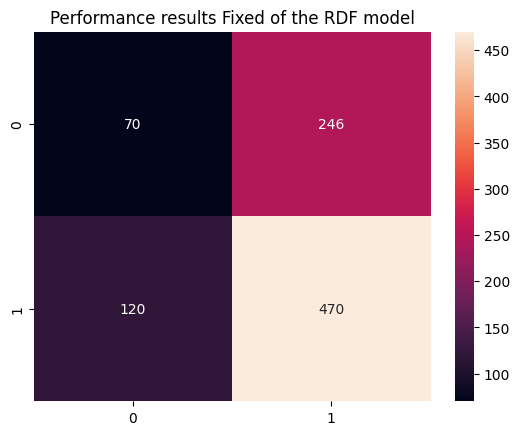


Feature Importance of the model



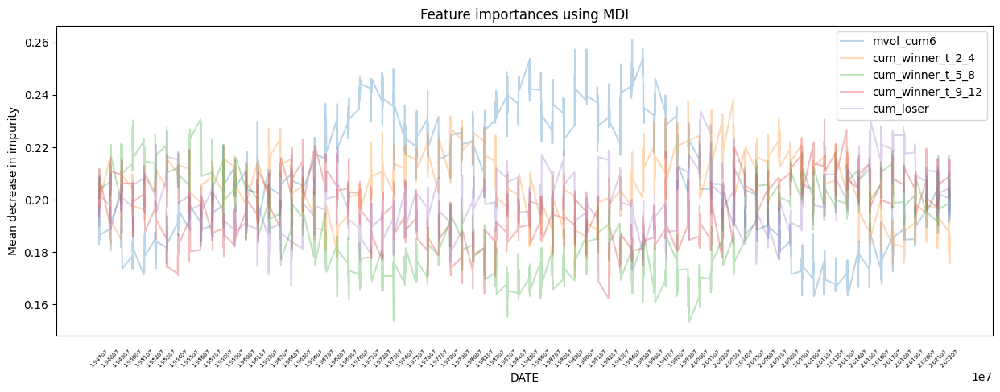

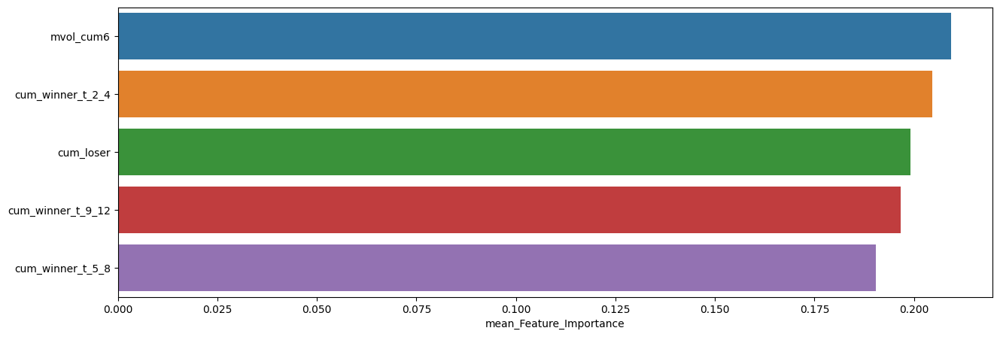

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.209259,0.260890,0.163114
cum_winner_t_2_4,0.204601,0.237992,0.170506
cum_loser,0.199029,0.233786,0.167161
cum_winner_t_9_12,0.196633,0.230606,0.162372
cum_winner_t_5_8,0.190477,0.230668,0.153443


In [22]:
Fixed_RDF_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                  model=RDF, # 사용할 모델
                                  model_name='RDF', # 사용한 모델 명
                                  plot=True, # 모델 성능 지표 시각화 여부
                                  plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.29      0.20      0.24        75
         1.0       0.66      0.76      0.71       151

    accuracy                           0.58       226
   macro avg       0.48      0.48      0.47       226
weighted avg       0.54      0.58      0.55       226


accuracy : 0.5752212389380531

precision : 0.6571428571428571

recall : 0.7615894039735099

F1-Score : 0.7055214723926381



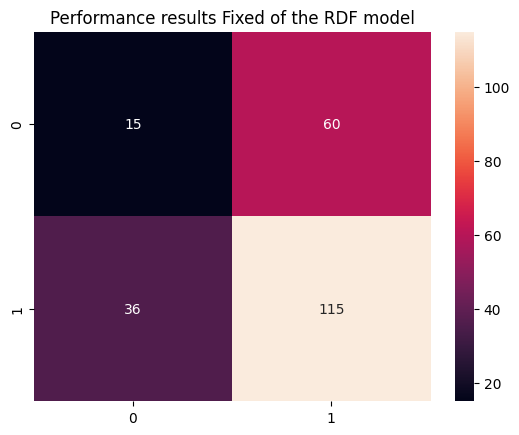


Feature Importance of the model



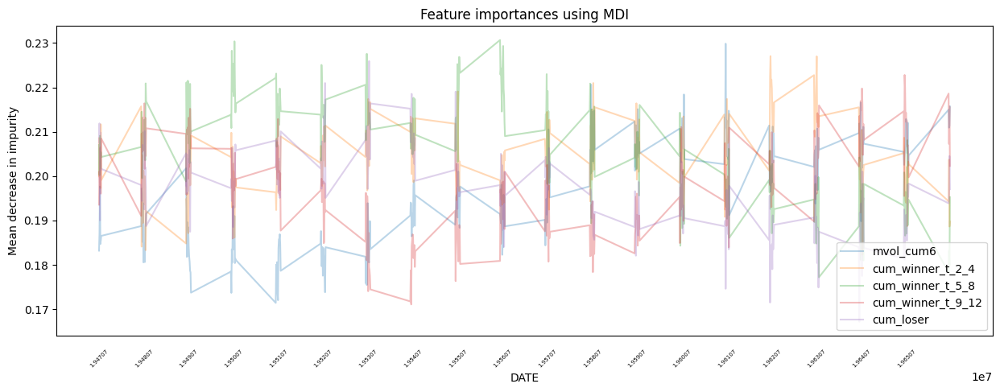

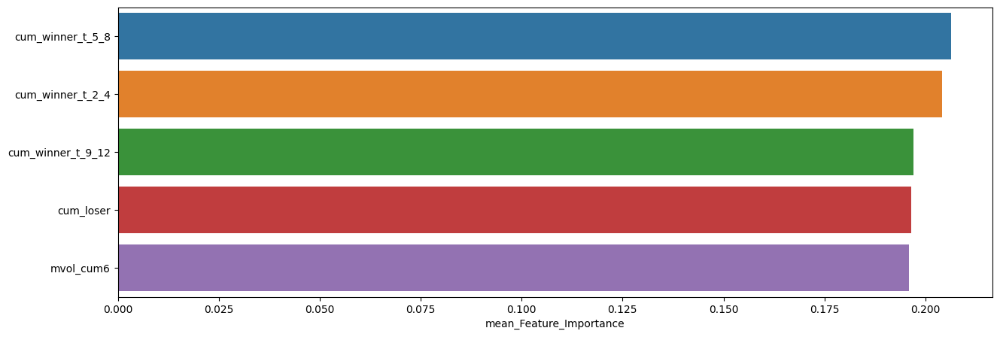

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,0.206322,0.230668,0.177181
cum_winner_t_2_4,0.204085,0.227033,0.182261
cum_winner_t_9_12,0.196992,0.222795,0.171069
cum_loser,0.196586,0.225928,0.167161
mvol_cum6,0.196015,0.229850,0.171417



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.34      0.19      0.24        75
         1.0       0.67      0.82      0.74       151

    accuracy                           0.61       226
   macro avg       0.51      0.50      0.49       226
weighted avg       0.56      0.61      0.57       226


accuracy : 0.6106194690265486

precision : 0.6702702702702703

recall : 0.8211920529801324

F1-Score : 0.738095238095238



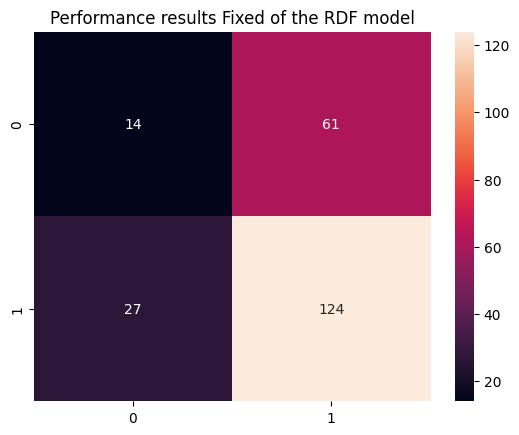


Feature Importance of the model



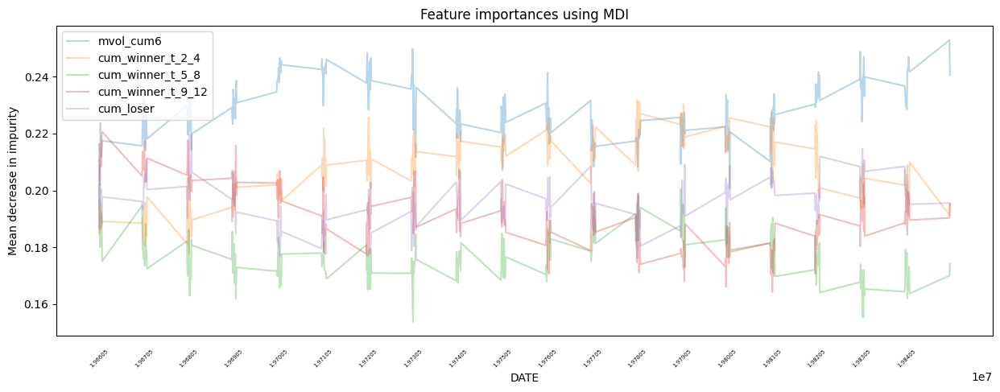

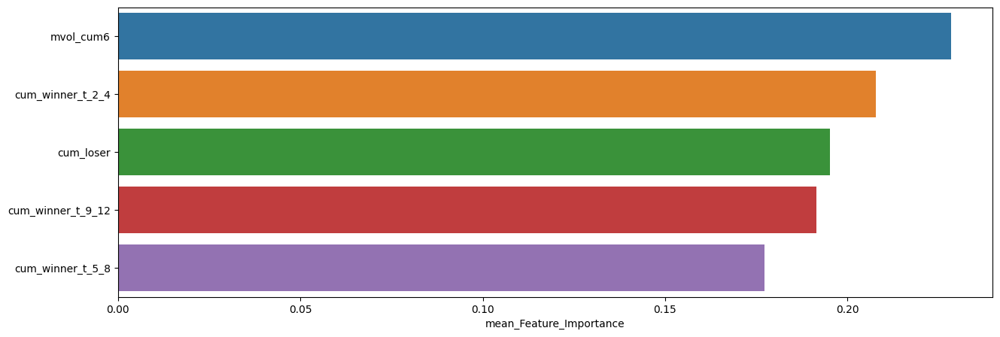

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.228308,0.252833,0.200598
cum_winner_t_2_4,0.207776,0.231859,0.177863
cum_loser,0.195241,0.219906,0.176184
cum_winner_t_9_12,0.191472,0.220600,0.164322
cum_winner_t_5_8,0.177203,0.202397,0.153783



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.33      0.19      0.24        70
         1.0       0.69      0.83      0.75       156

    accuracy                           0.63       226
   macro avg       0.51      0.51      0.50       226
weighted avg       0.58      0.63      0.59       226


accuracy : 0.6283185840707964

precision : 0.6935483870967742

recall : 0.8269230769230769

F1-Score : 0.7543859649122807



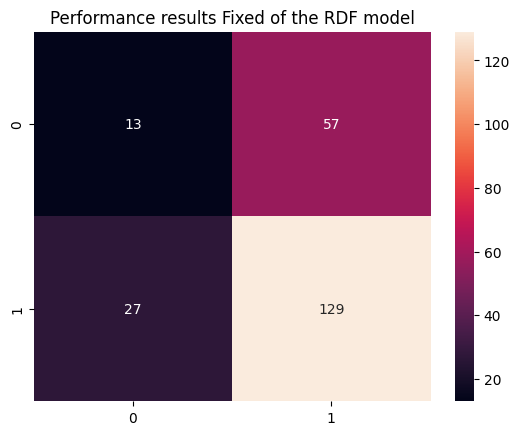


Feature Importance of the model



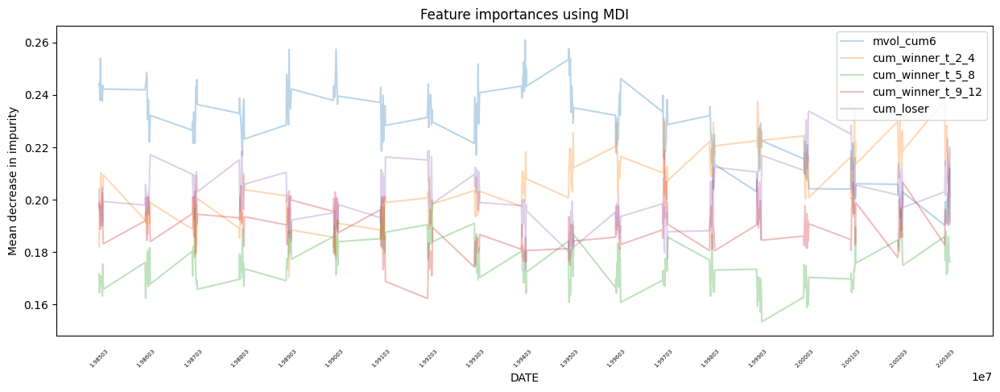

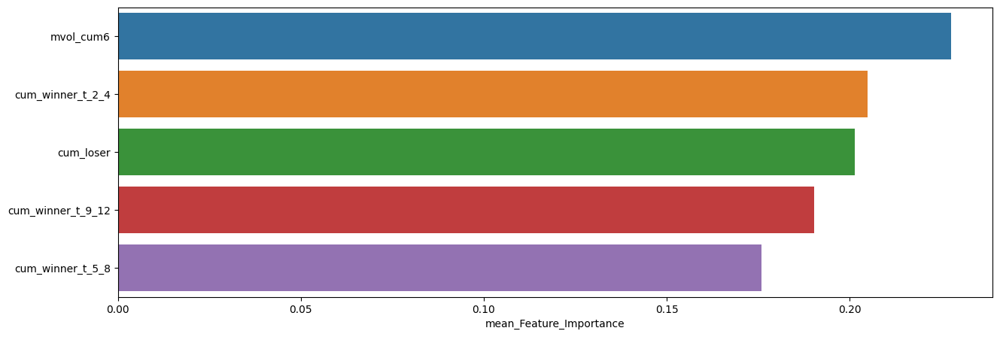

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.227619,0.260890,0.188224
cum_winner_t_2_4,0.204888,0.237992,0.170506
cum_loser,0.201301,0.233786,0.173169
cum_winner_t_9_12,0.190228,0.219788,0.162372
cum_winner_t_5_8,0.175964,0.199970,0.153443



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.48      0.29      0.36        96
         1.0       0.60      0.77      0.68       132

    accuracy                           0.57       228
   macro avg       0.54      0.53      0.52       228
weighted avg       0.55      0.57      0.54       228


accuracy : 0.5701754385964912

precision : 0.6

recall : 0.7727272727272727

F1-Score : 0.6754966887417219



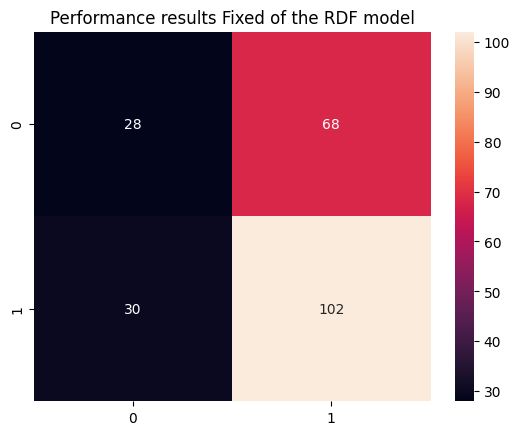


Feature Importance of the model



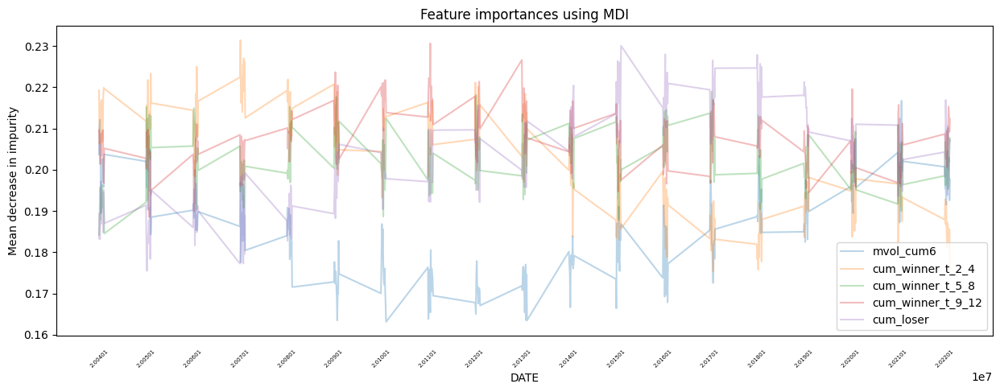

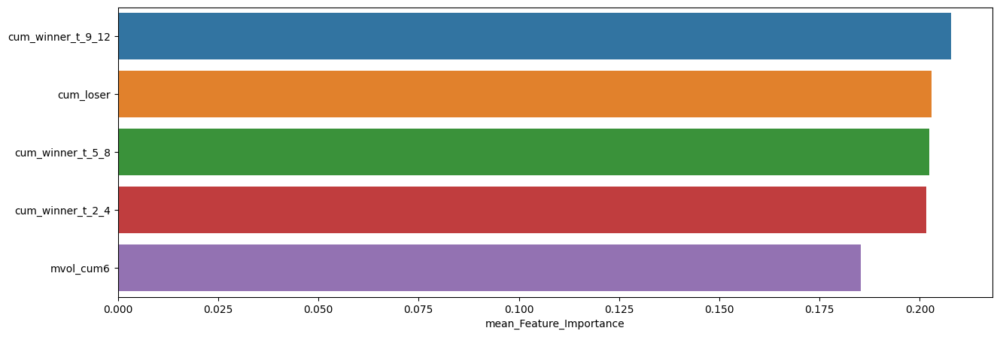

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_9_12,0.207742,0.230606,0.188501
cum_loser,0.202952,0.230035,0.175469
cum_winner_t_5_8,0.202315,0.218864,0.184178
cum_winner_t_2_4,0.201682,0.231399,0.175321
mvol_cum6,0.185308,0.216696,0.163114


In [23]:
slice_feature_importance(Fixed_RDF_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Fixed', # Rolling Windows Method
                         'RDF') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



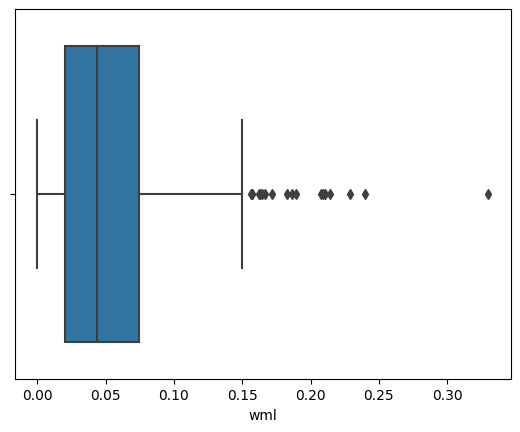

,count,mean,std,min,25%,50%,75%,max
wml,470.0,0.054037,0.045513,0.000007,0.020499,0.043612,0.074314,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



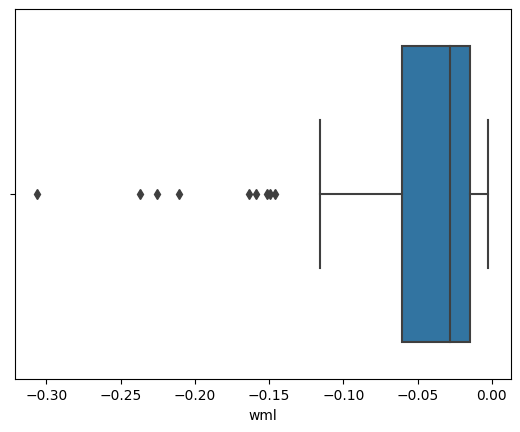

,count,mean,std,min,25%,50%,75%,max
wml,70.0,-0.053216,0.062593,-0.30599,-0.060828,-0.028494,-0.014439,-0.00241



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



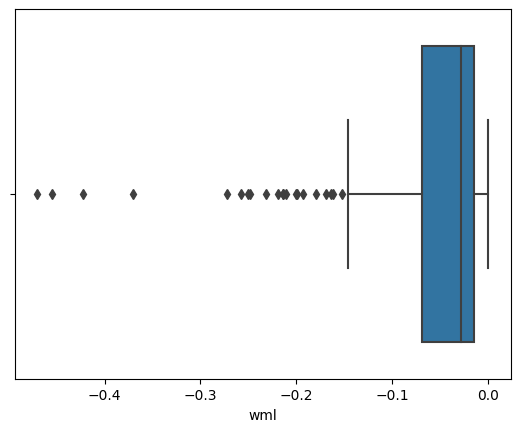

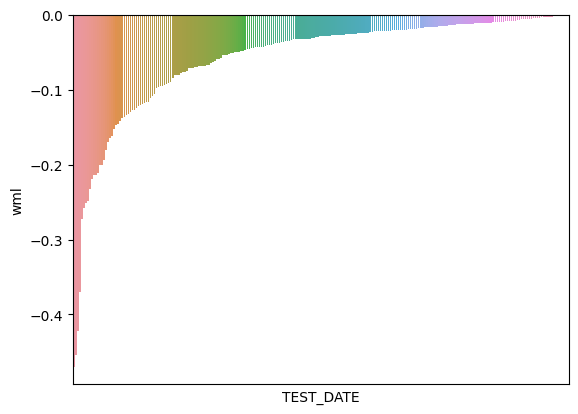

,count,mean,std,min,25%,50%,75%,max
wml,246.0,-0.057192,0.073603,-0.469903,-0.069333,-0.02865,-0.014757,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



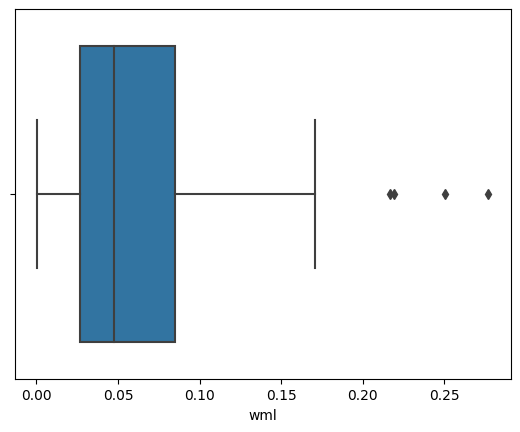

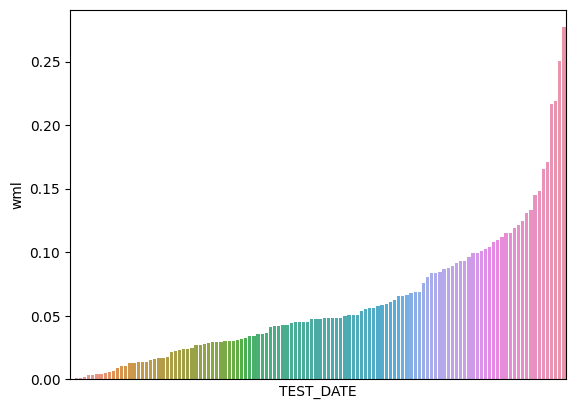

,count,mean,std,min,25%,50%,75%,max
wml,120.0,0.060002,0.051513,0.000627,0.026439,0.047731,0.084887,0.276912


In [24]:
RDF_A0_P1, RDF_A1_P0 = What_Pred(Fixed_RDF_Result, WML, 'RDF')

Sharpe Ratio : 0.77525

최근 누적 수익률

  2022년-12월 -> 7538.38
  2022년-11월 -> 6791.85
  2022년-10월 -> 6460.43
  2022년-09월 -> 5720.51
  2022년-08월 -> 5200.71

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2008년-06월 -> 12032.60
  2등 : 2002년-09월 -> 12003.45
  3등 : 2000년-12월 -> 11677.47
  4등 : 2009년-02월 -> 11501.88
  5등 : 2001년-09월 -> 10905.16
  6등 : 2007년-12월 -> 10606.68
  7등 : 2008년-10월 -> 10489.85
  8등 : 2008년-11월 -> 10489.85
  9등 : 2002년-07월 -> 10452.34
  10등 : 2008년-05월 -> 10331.76



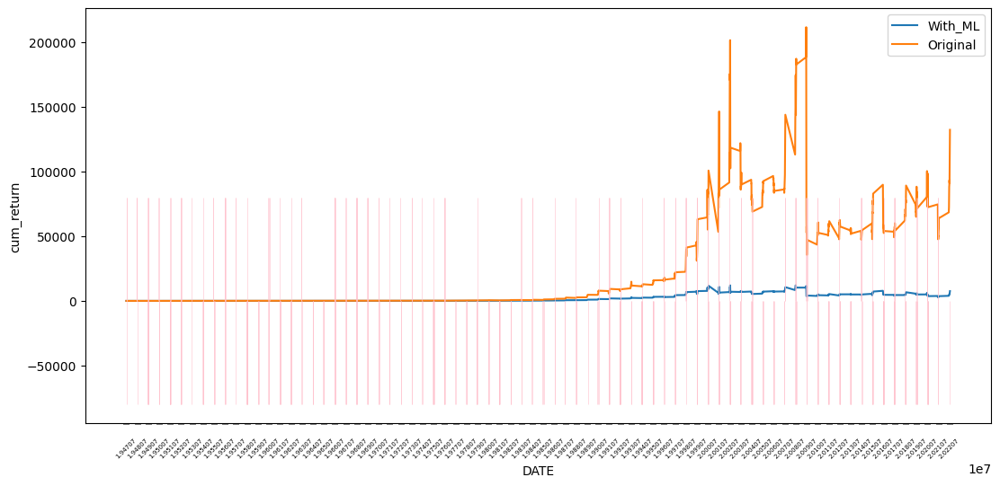

In [25]:
RDF_F_CUM_RETURN_static = cumm_return_by_dynamic(Fixed_RDF_Result,
                                                 WML,
                                                 'RDF_PRED_POS_WML',
                                                 RDF_A0_P1,
                                                 RDF_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.76812

최근 누적 수익률

  2022년-12월 -> 5279.82
  2022년-11월 -> 4907.59
  2022년-10월 -> 4768.16
  2022년-09월 -> 4336.27
  2022년-08월 -> 4071.73

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 5473.77
  2등 : 2022년-12월 -> 5279.82
  3등 : 2008년-11월 -> 5098.37
  4등 : 2008년-06월 -> 5077.29
  5등 : 2009년-01월 -> 5068.32
  6등 : 2008년-12월 -> 5024.74
  7등 : 2002년-09월 -> 5017.37
  8등 : 2008년-10월 -> 4954.76
  9등 : 2022년-11월 -> 4907.59
  10등 : 2022년-10월 -> 4768.16



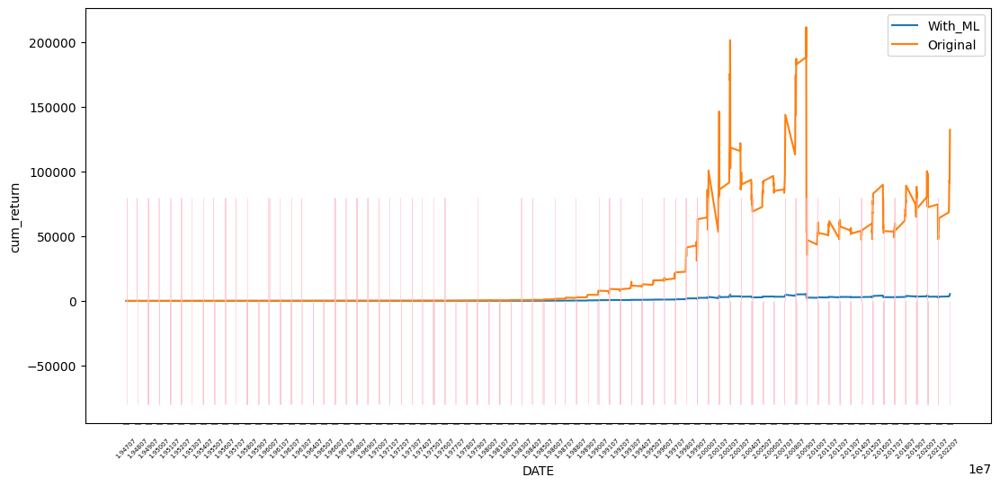

In [26]:
RDF_F_CUM_RETURN_dynamic = cumm_return_by_dynamic(Fixed_RDF_Result,
                                                 WML,
                                                 'RDF_PROB_POS_WML',
                                                 RDF_A0_P1,
                                                 RDF_A1_P0,
                                                 plot=True)

### Grdient Boosting

In [27]:
GBC_Param = {}
GBC = GradientBoostingClassifier(*GBC_Param, random_state=42)

**************************************************

GBC Model의 Rolling Fixed Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   ccp_alpha : 0.0
   criterion : friedman_mse
   init : None
   learning_rate : 0.1
   loss : log_loss
   max_depth : 3
   max_features : None
   max_leaf_nodes : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_iter_no_change : None
   random_state : 42
   subsample : 1.0
   tol : 0.0001
   validation_fraction : 0.1
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.36      0.22      0.28       316
         1.0       0.65      0.78      0.71       590

    accuracy                           0.59       906
   macro avg       0.51      0.50      0.49       906
weighted avg       0.55      0.59      0.56       906


accuracy : 0.5894039735099338

precision : 0.653954802259887

recall : 0.7847457627118644

F1-Score : 0.7134052388289676



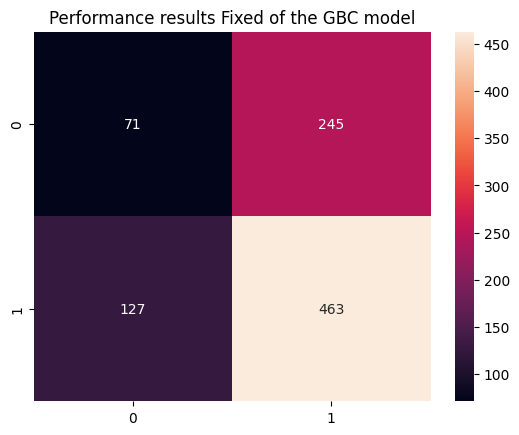


Feature Importance of the model



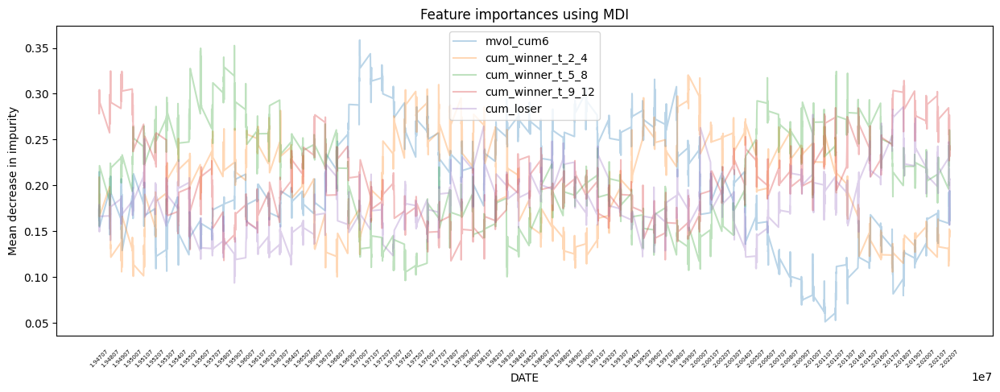

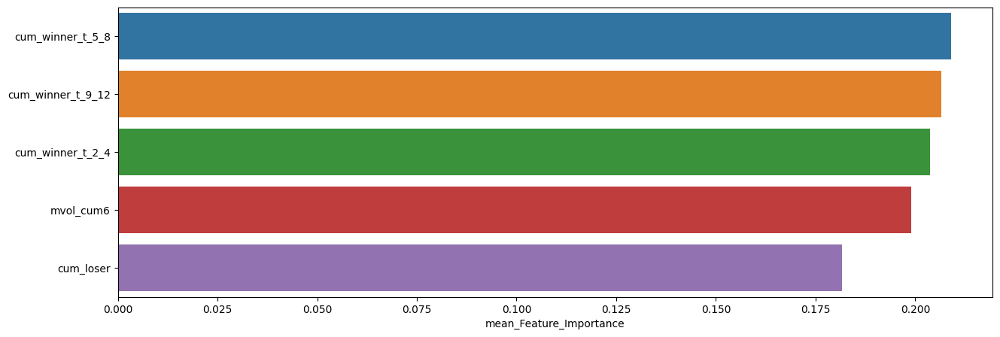

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,0.208947,0.352543,0.096227
cum_winner_t_9_12,0.206525,0.324798,0.117659
cum_winner_t_2_4,0.203802,0.320407,0.100141
mvol_cum6,0.199060,0.358620,0.051157
cum_loser,0.181666,0.285555,0.093537


In [28]:
Fixed_GBC_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                  model=GBC, # 사용할 모델
                                  model_name='GBC', # 사용한 모델 명
                                  plot=True, # 모델 성능 지표 시각화 여부
                                  plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.40      0.24      0.30        75
         1.0       0.69      0.82      0.75       151

    accuracy                           0.63       226
   macro avg       0.54      0.53      0.52       226
weighted avg       0.59      0.63      0.60       226


accuracy : 0.6283185840707964

precision : 0.6850828729281768

recall : 0.8211920529801324

F1-Score : 0.746987951807229



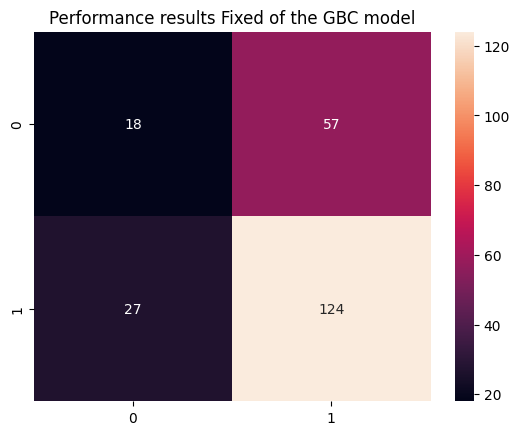


Feature Importance of the model



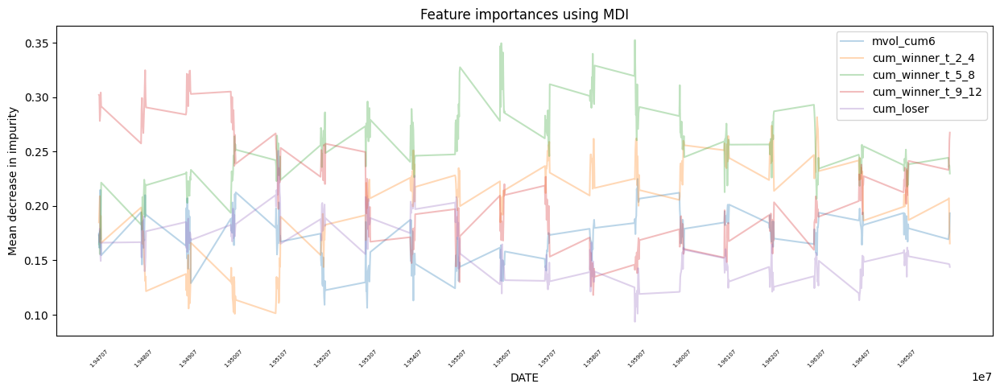

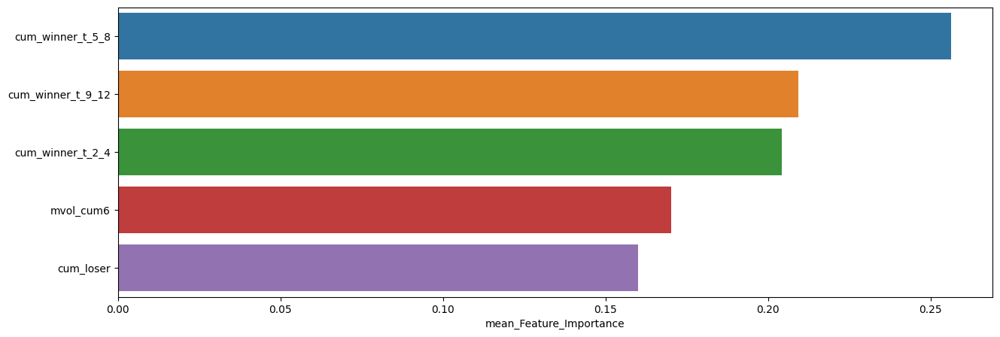

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,0.256221,0.352543,0.155680
cum_winner_t_9_12,0.209324,0.324798,0.118107
cum_winner_t_2_4,0.204205,0.281671,0.100833
mvol_cum6,0.170178,0.224851,0.106395
cum_loser,0.160072,0.250648,0.093537



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.31      0.20      0.24        75
         1.0       0.66      0.77      0.71       151

    accuracy                           0.58       226
   macro avg       0.48      0.49      0.48       226
weighted avg       0.54      0.58      0.56       226


accuracy : 0.584070796460177

precision : 0.6610169491525424

recall : 0.7748344370860927

F1-Score : 0.7134146341463414



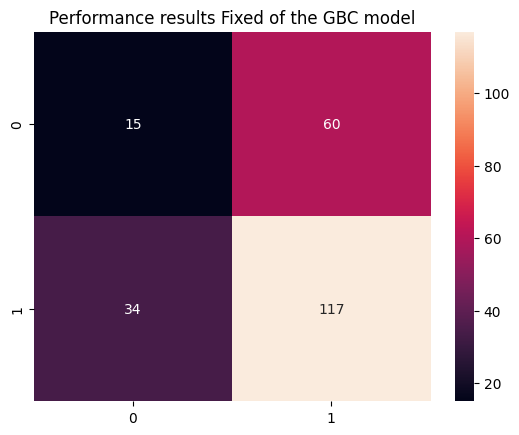


Feature Importance of the model



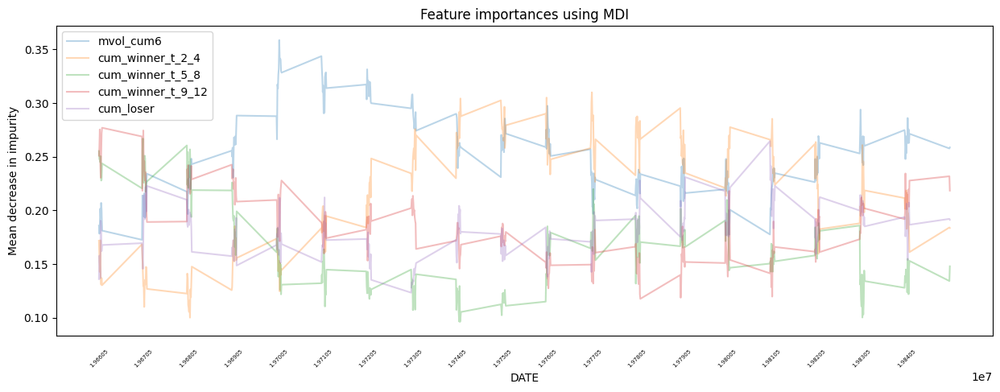

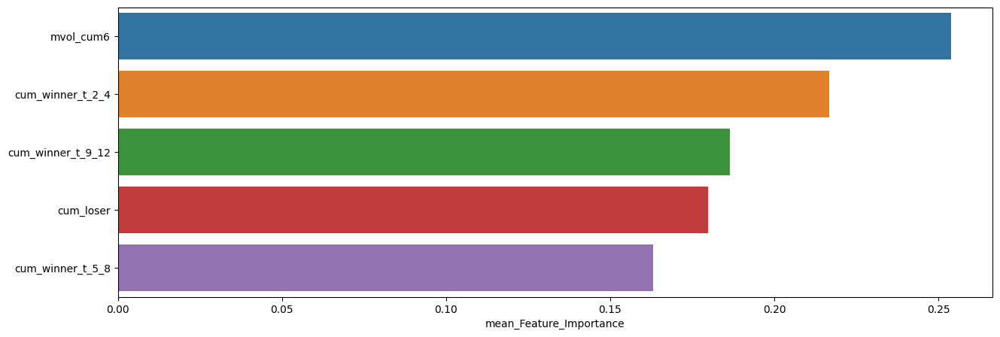

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.253807,0.358620,0.172629
cum_winner_t_2_4,0.216817,0.309951,0.100141
cum_winner_t_9_12,0.186380,0.276982,0.117659
cum_loser,0.179819,0.264527,0.123383
cum_winner_t_5_8,0.163177,0.266902,0.096227



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.29      0.19      0.23        70
         1.0       0.69      0.79      0.74       156

    accuracy                           0.61       226
   macro avg       0.49      0.49      0.48       226
weighted avg       0.56      0.61      0.58       226


accuracy : 0.6061946902654868

precision : 0.6850828729281768

recall : 0.7948717948717948

F1-Score : 0.7359050445103857



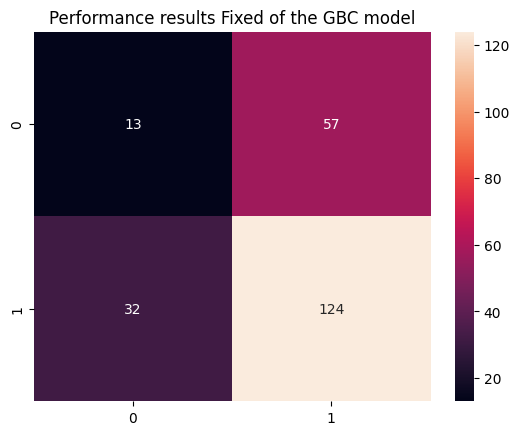


Feature Importance of the model



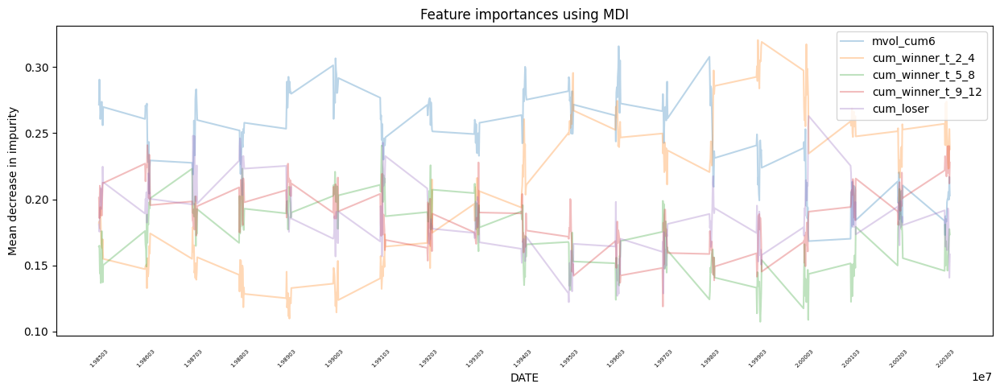

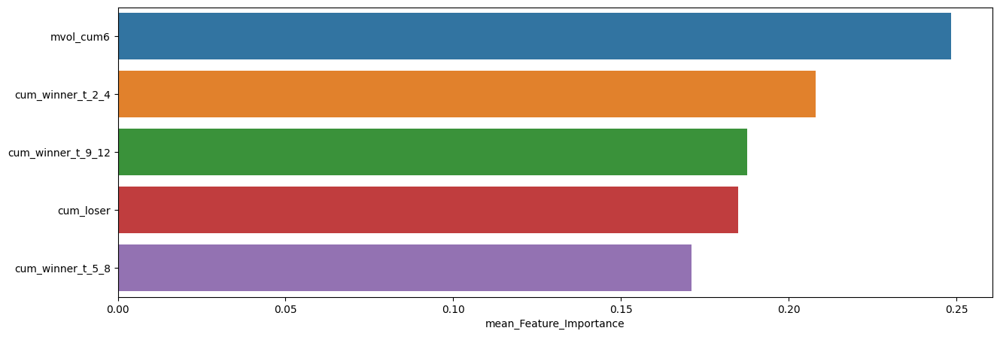

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.248379,0.315738,0.168336
cum_winner_t_2_4,0.208074,0.320407,0.109758
cum_winner_t_9_12,0.187536,0.240885,0.118881
cum_loser,0.185036,0.262936,0.122189
cum_winner_t_5_8,0.170975,0.240545,0.107338



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.26      0.32        96
         1.0       0.58      0.74      0.65       132

    accuracy                           0.54       228
   macro avg       0.50      0.50      0.49       228
weighted avg       0.51      0.54      0.51       228


accuracy : 0.5394736842105263

precision : 0.5798816568047337

recall : 0.7424242424242424

F1-Score : 0.6511627906976744



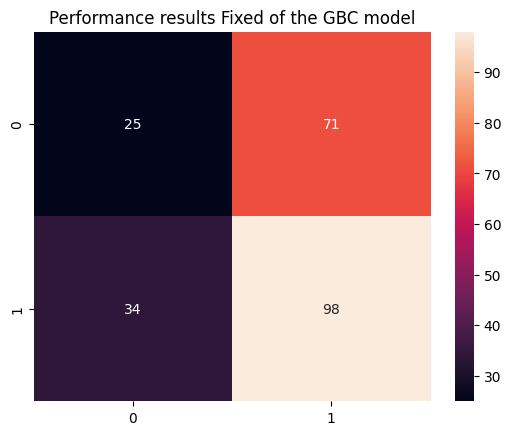


Feature Importance of the model



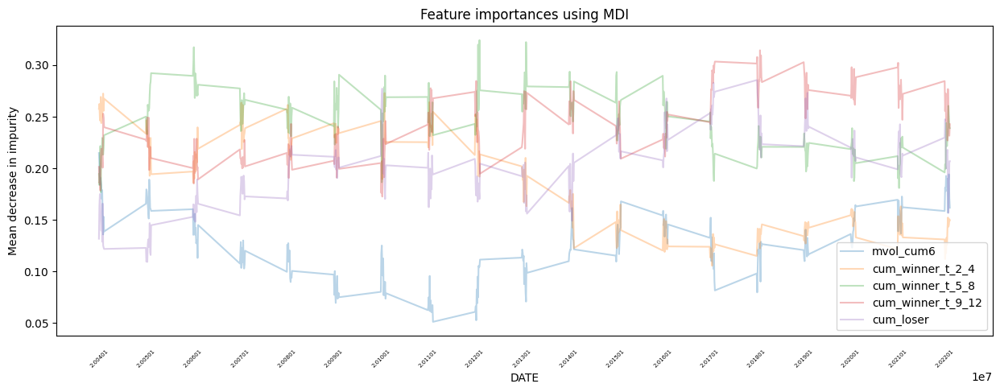

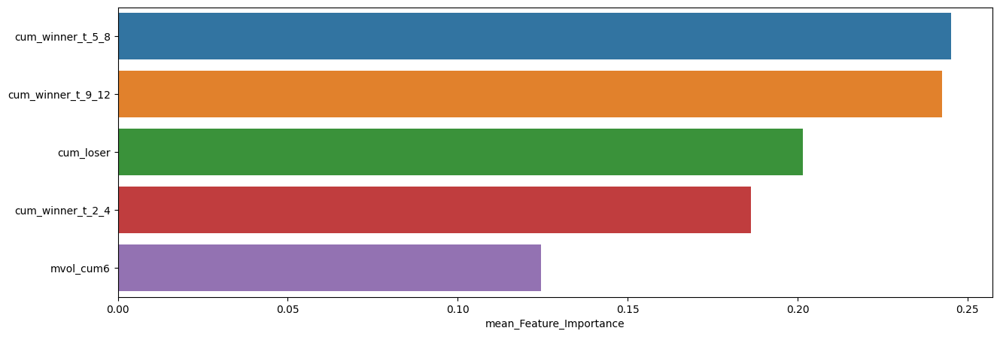

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,0.245094,0.324315,0.176801
cum_winner_t_9_12,0.242540,0.314440,0.172599
cum_loser,0.201562,0.285555,0.109262
cum_winner_t_2_4,0.186267,0.272957,0.105551
mvol_cum6,0.124537,0.214824,0.051157


In [29]:
slice_feature_importance(Fixed_GBC_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Fixed', # Rolling Windows Method
                         'GBC') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



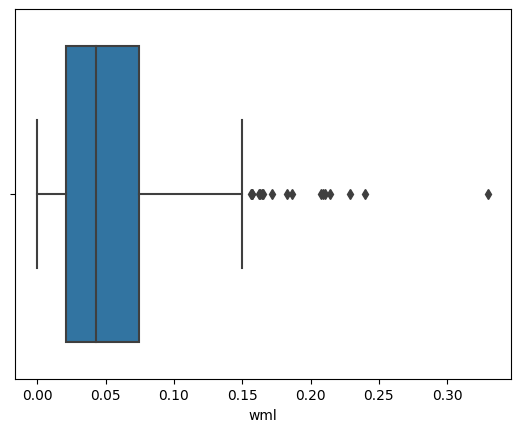

,count,mean,std,min,25%,50%,75%,max
wml,463.0,0.053534,0.044942,0.000007,0.020596,0.043049,0.074257,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



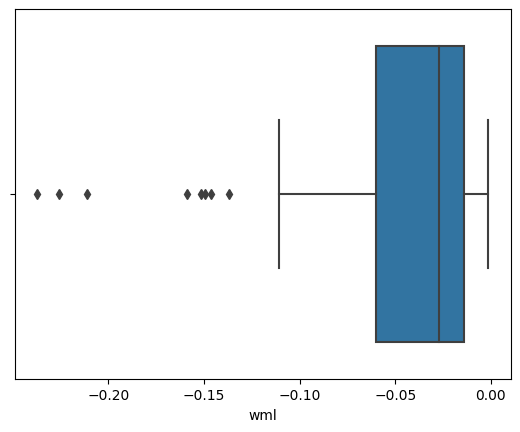

,count,mean,std,min,25%,50%,75%,max
wml,71.0,-0.048271,0.053796,-0.237095,-0.059847,-0.026922,-0.014189,-0.00129



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



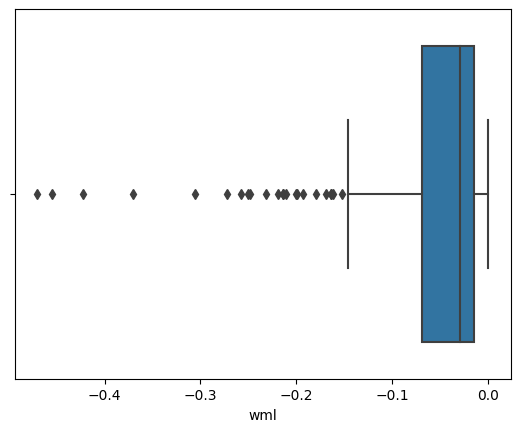

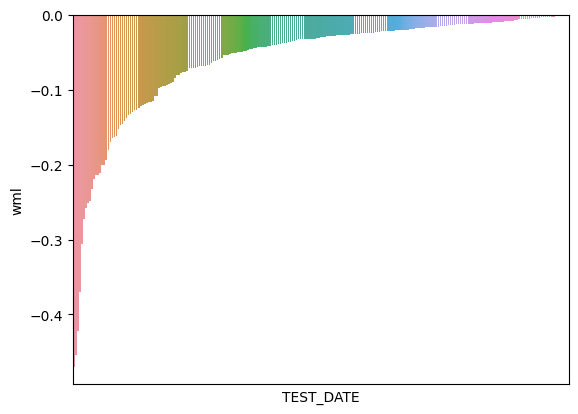

,count,mean,std,min,25%,50%,75%,max
wml,245.0,-0.058641,0.075475,-0.469903,-0.069463,-0.029816,-0.015103,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



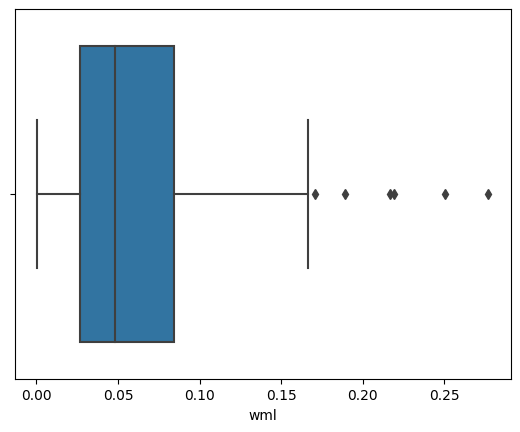

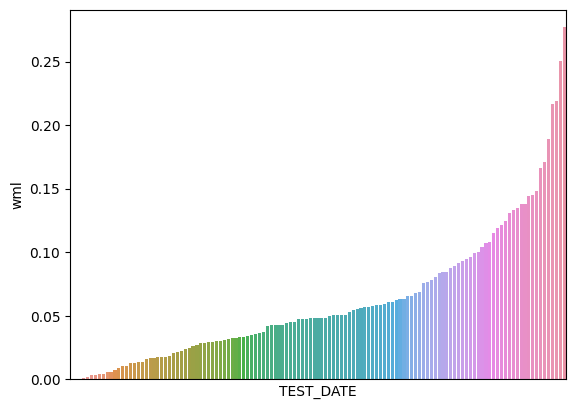

,count,mean,std,min,25%,50%,75%,max
wml,127.0,0.061504,0.052796,0.000577,0.026672,0.048077,0.08423,0.276912


In [30]:
GBC_A0_P1, GBC_A1_P0 = What_Pred(Fixed_GBC_Result, WML, 'GBC')

Sharpe Ratio : 0.76262

최근 누적 수익률

  2022년-12월 -> 2961.10
  2022년-11월 -> 2667.80
  2022년-10월 -> 2537.59
  2022년-09월 -> 2246.89
  2022년-08월 -> 2246.89

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2002년-09월 -> 9857.91
  2등 : 2008년-06월 -> 9460.50
  3등 : 2009년-02월 -> 9043.22
  4등 : 2001년-09월 -> 8955.91
  5등 : 2002년-07월 -> 8584.03
  6등 : 2000년-02월 -> 8502.45
  7등 : 2002년-08월 -> 8335.31
  8등 : 2000년-12월 -> 8277.37
  9등 : 2008년-11월 -> 8247.51
  10등 : 2008년-10월 -> 8247.51



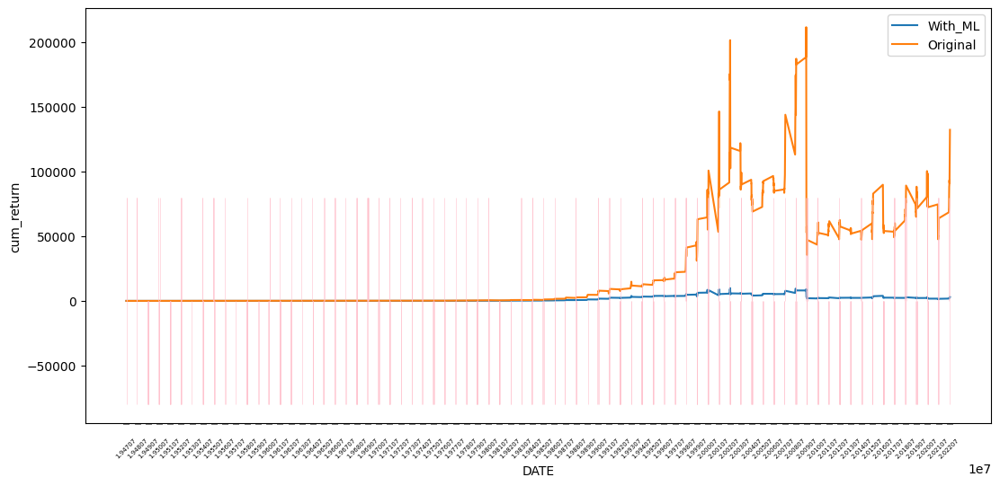

In [31]:
GBC_F_CUM_RETURN_static = cumm_return_by_dynamic(Fixed_GBC_Result,
                                                 WML,
                                                 'GBC_PRED_POS_WML',
                                                 GBC_A0_P1,
                                                 GBC_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.74672

최근 누적 수익률

  2022년-12월 -> 8147.68
  2022년-11월 -> 7391.01
  2022년-10월 -> 7109.64
  2022년-09월 -> 6587.43
  2022년-08월 -> 6441.10

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 9425.87
  2등 : 2008년-06월 -> 9261.75
  3등 : 2008년-11월 -> 8769.21
  4등 : 2009년-01월 -> 8619.95
  5등 : 2008년-12월 -> 8609.94
  6등 : 2008년-10월 -> 8552.19
  7등 : 2002년-09월 -> 8305.51
  8등 : 2008년-05월 -> 8280.83
  9등 : 2007년-12월 -> 8173.82
  10등 : 2022년-12월 -> 8147.68



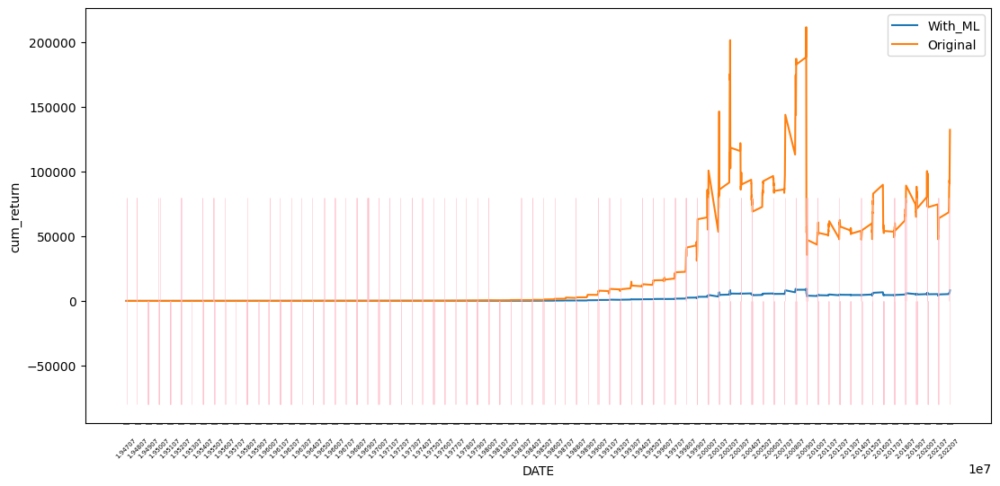

In [32]:
GBC_F_CUM_RETURN_dynamic = cumm_return_by_dynamic(Fixed_GBC_Result,
                                                 WML,
                                                 'GBC_PROB_POS_WML',
                                                 GBC_A0_P1,
                                                 GBC_A1_P0,
                                                 plot=True)

### XGB

In [33]:
XGB_Param = {}
XGB = XGBClassifier(**XGB_Param, random_state=42)

**************************************************

XGB Model의 Rolling Fixed Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   objective : binary:logistic
   use_label_encoder : None
   base_score : None
   booster : None
   callbacks : None
   colsample_bylevel : None
   colsample_bynode : None
   colsample_bytree : None
   early_stopping_rounds : None
   enable_categorical : False
   eval_metric : None
   feature_types : None
   gamma : None
   gpu_id : None
   grow_policy : None
   importance_type : None
   interaction_constraints : None
   learning_rate : None
   max_bin : None
   max_cat_threshold : None
   max_cat_to_onehot : None
   max_delta_step : None
   max_depth : None
   max_leaves : None
   min_child_weight : None
   missing : nan
   monotone_constraints : None
   n_estimators : 100
   n_jobs : None
   num_parallel_tree : None
   predictor : None
   random_state : 42
   reg_alpha : None
   reg_lambda : None
   sampling_method : None
   scale_pos_weight : None
   subsample : None
 

  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.39      0.29      0.34       316
         1.0       0.67      0.76      0.71       590

    accuracy                           0.59       906
   macro avg       0.53      0.53      0.52       906
weighted avg       0.57      0.59      0.58       906


accuracy : 0.5949227373068433

precision : 0.6666666666666666

recall : 0.7559322033898305

F1-Score : 0.7084988085782367



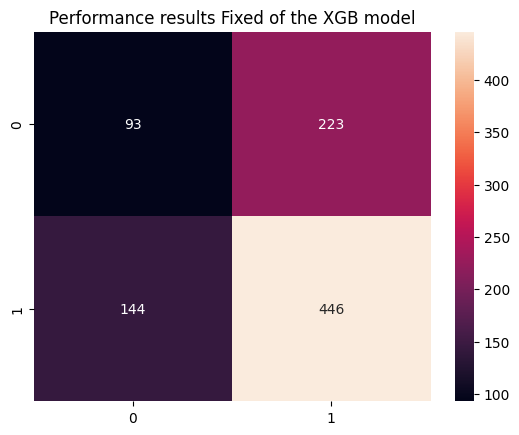


Feature Importance of the model



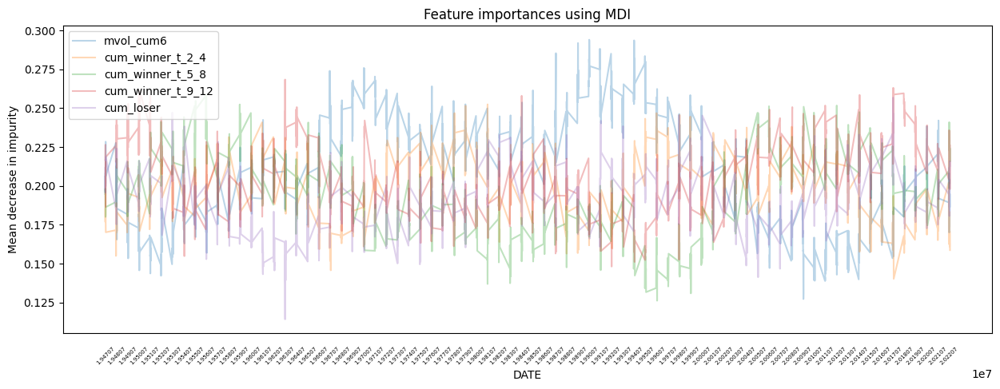

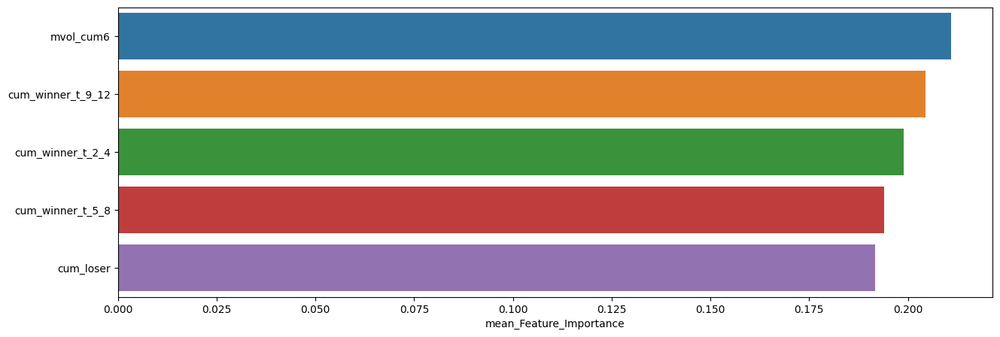

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.210895,0.293965,0.127251
cum_winner_t_9_12,0.204401,0.268369,0.148135
cum_winner_t_2_4,0.198933,0.252403,0.140242
cum_winner_t_5_8,0.193985,0.258524,0.126183
cum_loser,0.191787,0.256718,0.114214


In [34]:
Fixed_XGB_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                  model=XGB, # 사용할 모델
                                  model_name='XGB', # 사용한 모델 명
                                  plot=True, # 모델 성능 지표 시각화 여부
                                  plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.35      0.31      0.33        75
         1.0       0.68      0.72      0.70       151

    accuracy                           0.58       226
   macro avg       0.52      0.51      0.51       226
weighted avg       0.57      0.58      0.58       226


accuracy : 0.584070796460177

precision : 0.6770186335403726

recall : 0.7218543046357616

F1-Score : 0.6987179487179487



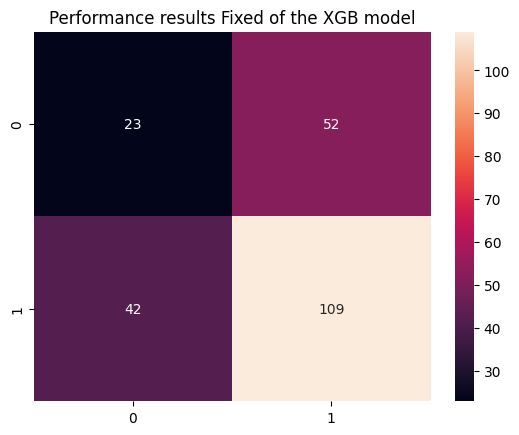


Feature Importance of the model



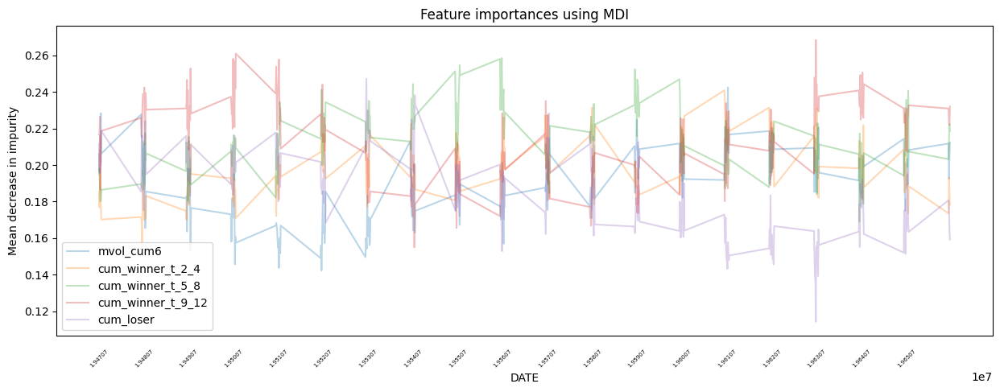

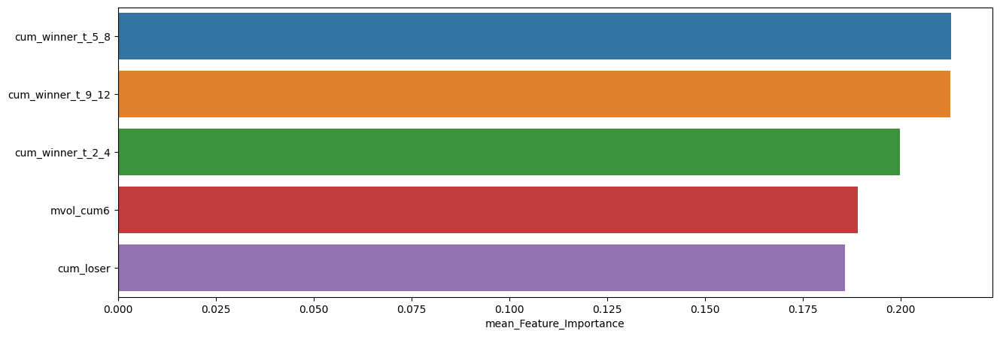

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,0.212792,0.258524,0.169108
cum_winner_t_9_12,0.212590,0.268369,0.154855
cum_winner_t_2_4,0.199857,0.240881,0.155014
mvol_cum6,0.189015,0.242444,0.142203
cum_loser,0.185746,0.247165,0.114214



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.39      0.29      0.33        75
         1.0       0.69      0.77      0.73       151

    accuracy                           0.61       226
   macro avg       0.54      0.53      0.53       226
weighted avg       0.59      0.61      0.60       226


accuracy : 0.6106194690265486

precision : 0.6863905325443787

recall : 0.7682119205298014

F1-Score : 0.7250000000000001



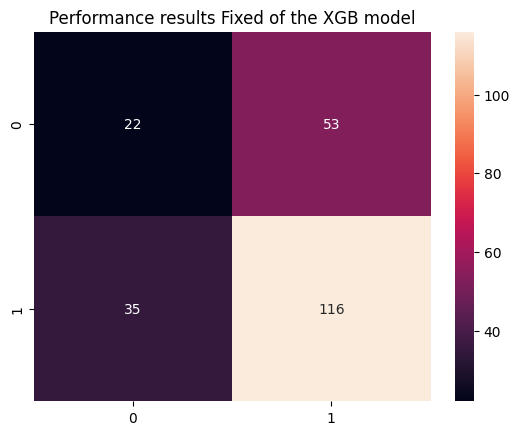


Feature Importance of the model



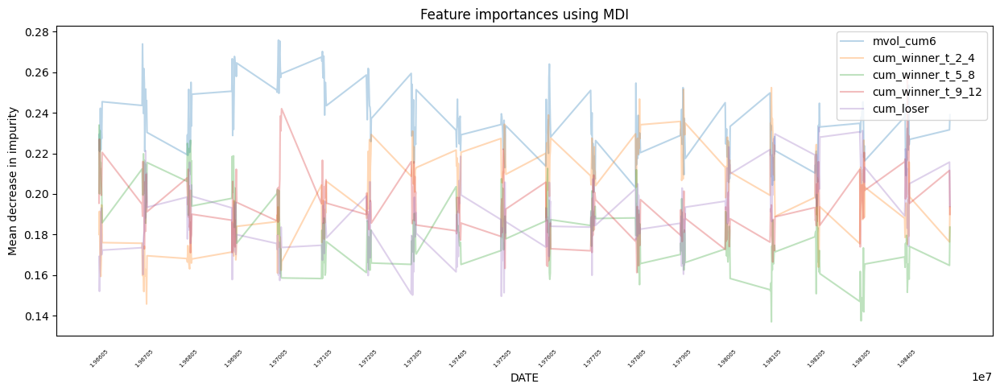

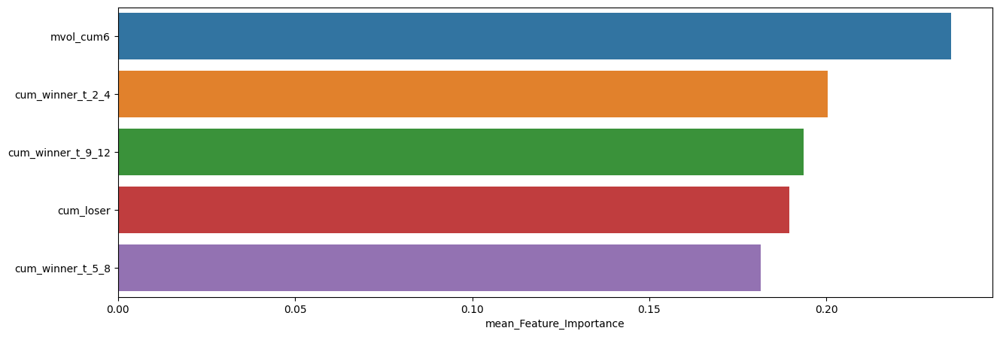

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.235108,0.275848,0.200866
cum_winner_t_2_4,0.200357,0.252403,0.145714
cum_winner_t_9_12,0.193509,0.257908,0.161201
cum_loser,0.189502,0.232870,0.149543
cum_winner_t_5_8,0.181524,0.233831,0.136930



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.33      0.26      0.29        70
         1.0       0.70      0.77      0.73       156

    accuracy                           0.61       226
   macro avg       0.52      0.51      0.51       226
weighted avg       0.58      0.61      0.59       226


accuracy : 0.6106194690265486

precision : 0.6976744186046512

recall : 0.7692307692307693

F1-Score : 0.7317073170731708



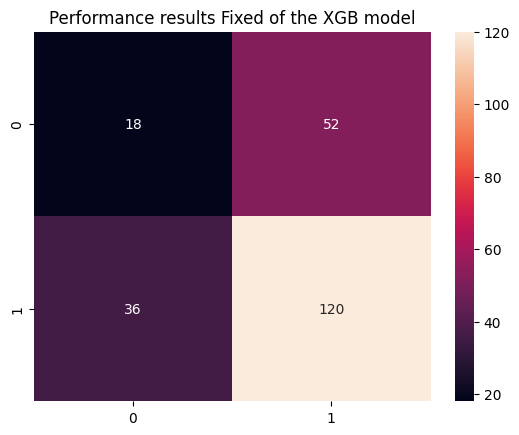


Feature Importance of the model



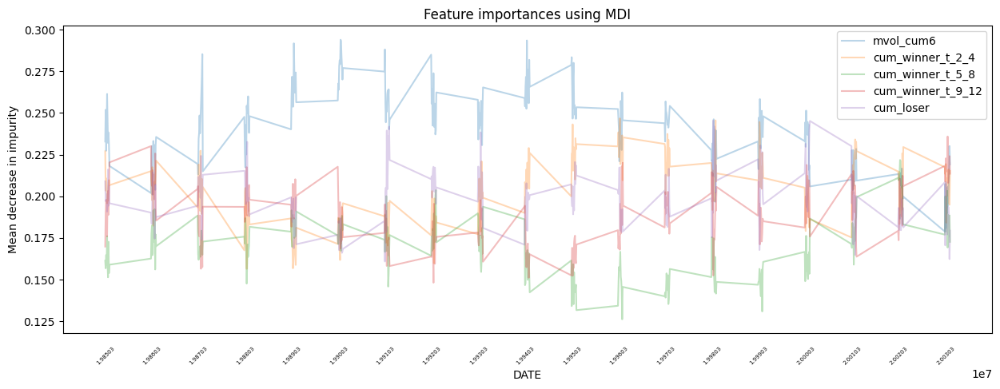

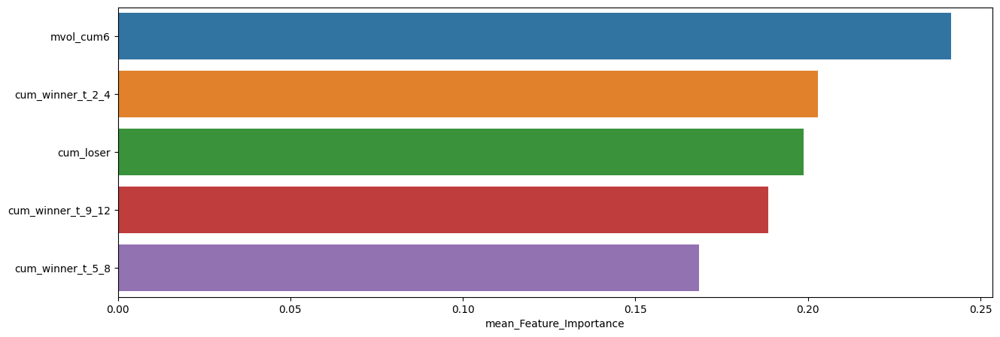

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.241442,0.293965,0.178847
cum_winner_t_2_4,0.202944,0.246774,0.156455
cum_loser,0.198692,0.245454,0.160879
cum_winner_t_9_12,0.188445,0.235906,0.148135
cum_winner_t_5_8,0.168477,0.221799,0.126183



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.49      0.31      0.38        96
         1.0       0.60      0.77      0.68       132

    accuracy                           0.57       228
   macro avg       0.55      0.54      0.53       228
weighted avg       0.56      0.57      0.55       228


accuracy : 0.5745614035087719

precision : 0.6047904191616766

recall : 0.7651515151515151

F1-Score : 0.6755852842809364



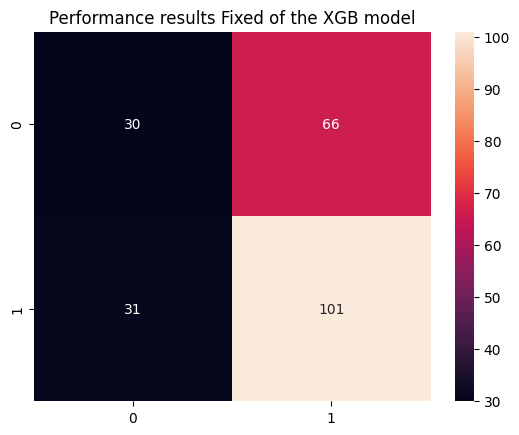


Feature Importance of the model



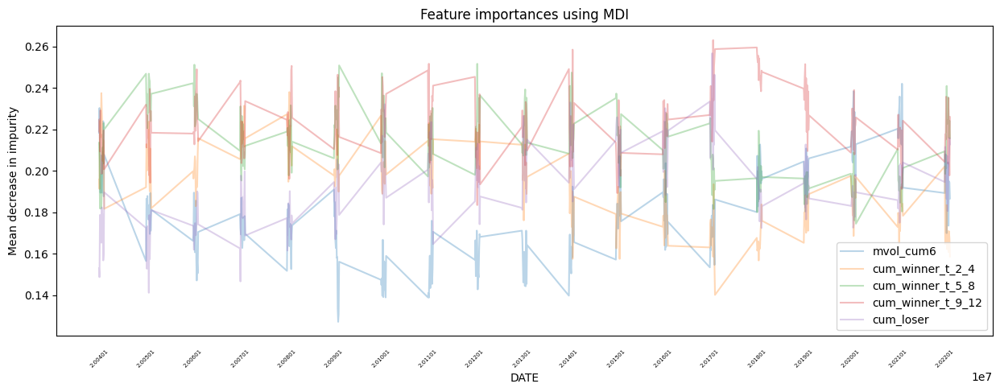

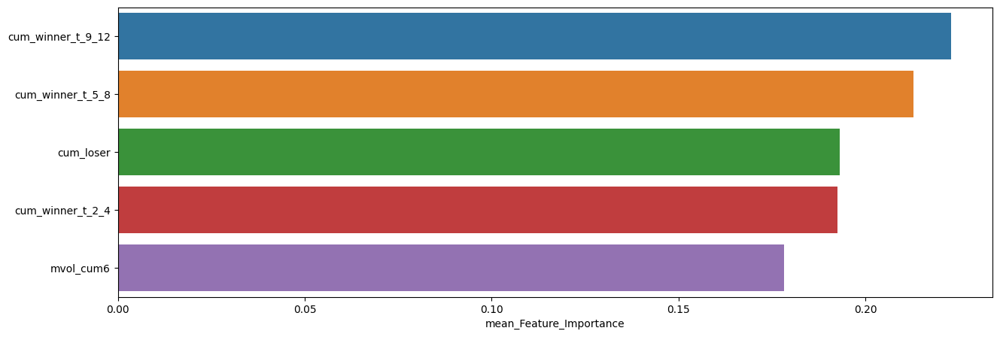

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_9_12,0.222897,0.263061,0.183526
cum_winner_t_5_8,0.212977,0.251650,0.174574
cum_loser,0.193196,0.256718,0.141268
cum_winner_t_2_4,0.192629,0.237999,0.140242
mvol_cum6,0.178302,0.242050,0.127251


In [35]:
slice_feature_importance(Fixed_XGB_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Fixed', # Rolling Windows Method
                         'XGB') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



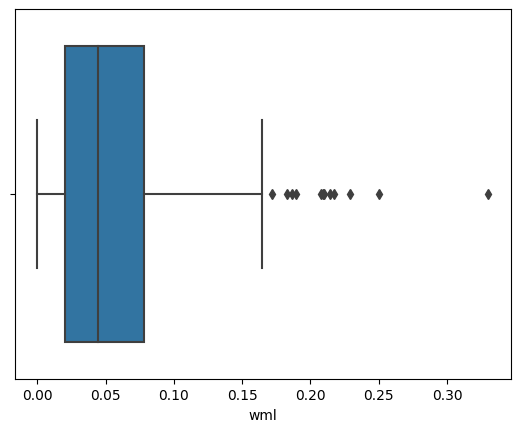

,count,mean,std,min,25%,50%,75%,max
wml,446.0,0.055028,0.046993,0.000128,0.020103,0.044804,0.07798,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



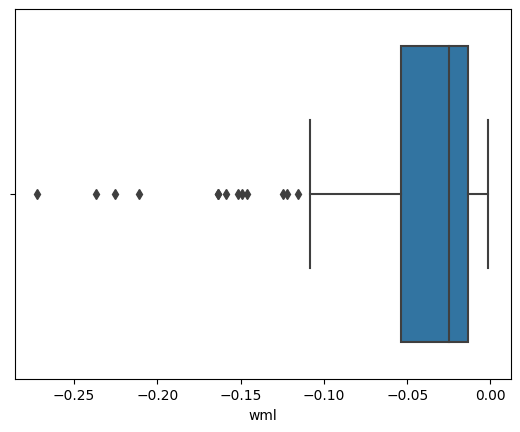

,count,mean,std,min,25%,50%,75%,max
wml,93.0,-0.048545,0.057168,-0.271971,-0.053421,-0.025151,-0.01358,-0.00129



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



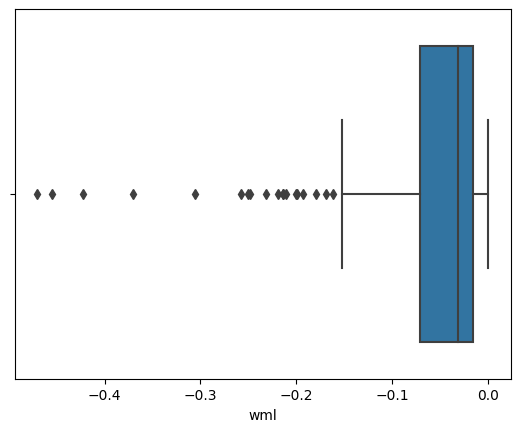

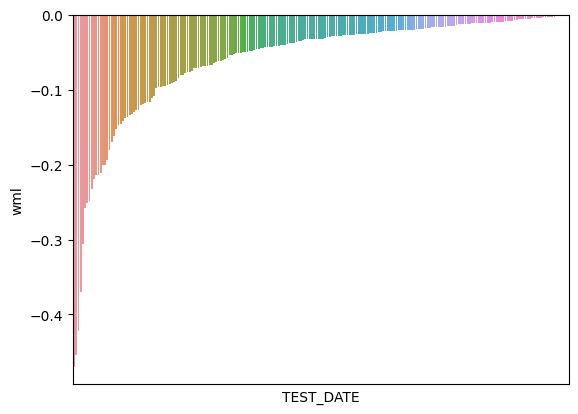

,count,mean,std,min,25%,50%,75%,max
wml,223.0,-0.05955,0.076224,-0.469903,-0.070858,-0.031619,-0.015839,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



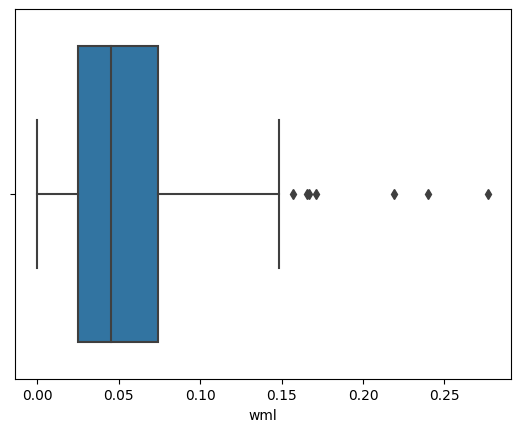

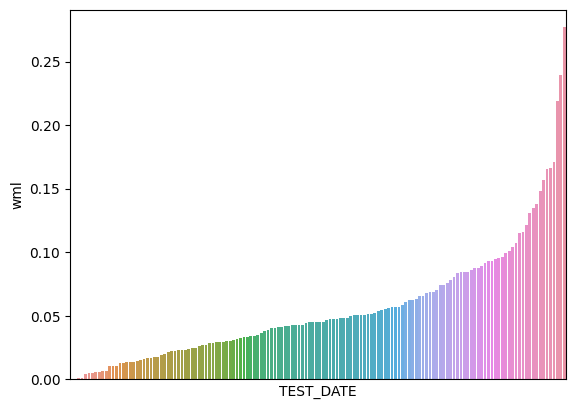

,count,mean,std,min,25%,50%,75%,max
wml,144.0,0.055936,0.0464,0.000007,0.024849,0.04512,0.074209,0.276912


In [36]:
XGB_A0_P1, XGB_A1_P0 = What_Pred(Fixed_XGB_Result, WML, 'XGB')

Sharpe Ratio : 0.76131

최근 누적 수익률

  2022년-12월 -> 7292.60
  2022년-11월 -> 6570.40
  2022년-10월 -> 6570.40
  2022년-09월 -> 5817.89
  2022년-08월 -> 5289.24

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 12293.83
  2등 : 2009년-01월 -> 10946.73
  3등 : 2008년-12월 -> 10946.73
  4등 : 2008년-11월 -> 10946.73
  5등 : 2008년-10월 -> 10946.73
  6등 : 2008년-06월 -> 10500.07
  7등 : 2008년-07월 -> 10500.07
  8등 : 2000년-12월 -> 10450.84
  9등 : 2008년-08월 -> 10334.36
  10등 : 2008년-09월 -> 10334.36



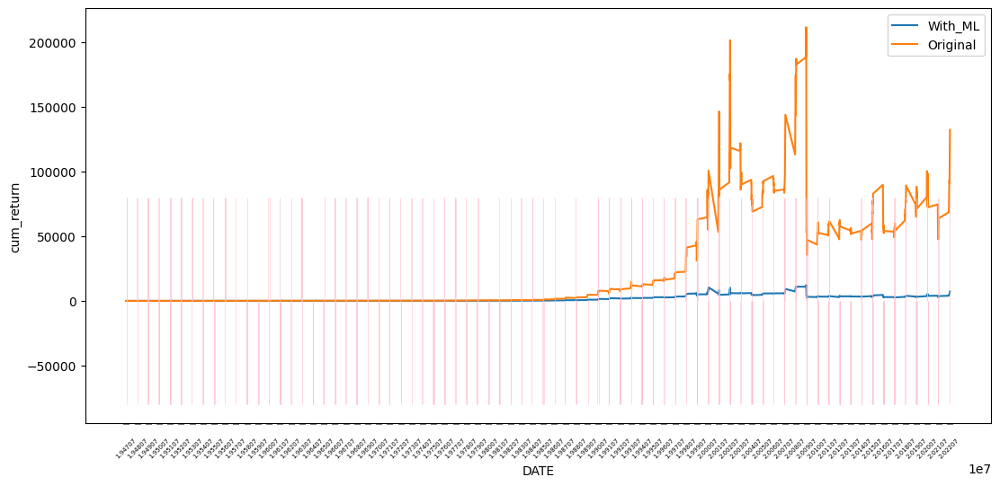

In [37]:
XGB_F_CUM_RETURN_static = cumm_return_by_dynamic(Fixed_XGB_Result,
                                                 WML,
                                                 'XGB_PRED_POS_WML',
                                                 XGB_A0_P1,
                                                 XGB_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.76415

최근 누적 수익률

  2022년-12월 -> 8577.60
  2022년-11월 -> 7732.42
  2022년-10월 -> 7550.79
  2022년-09월 -> 6908.86
  2022년-08월 -> 6441.28

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2022년-12월 -> 8577.60
  2등 : 2009년-02월 -> 8437.88
  3등 : 2008년-11월 -> 7868.17
  4등 : 2008년-10월 -> 7814.04
  5등 : 2009년-01월 -> 7806.98
  6등 : 2008년-12월 -> 7781.86
  7등 : 2022년-11월 -> 7732.42
  8등 : 2022년-10월 -> 7550.79
  9등 : 2008년-06월 -> 7480.70
  10등 : 2008년-07월 -> 7454.72



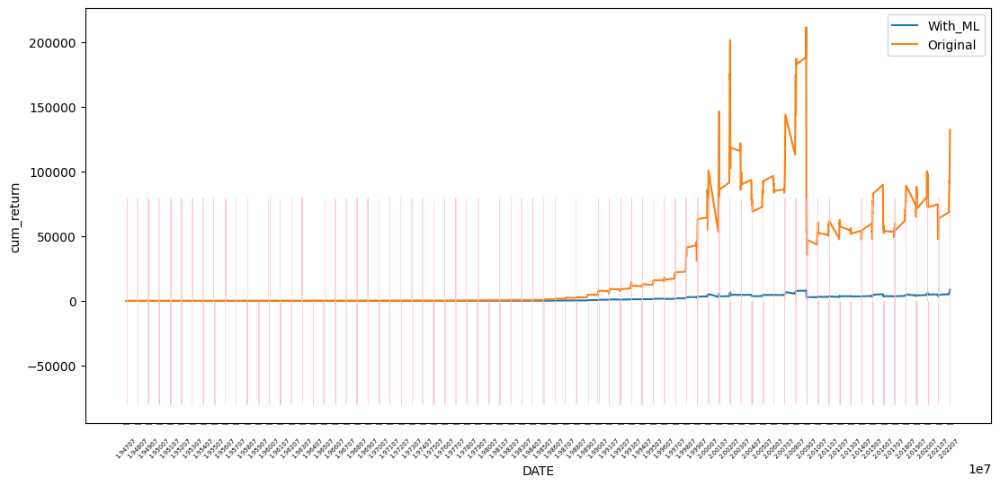

In [38]:
XGB_F_CUM_RETURN_dynamic = cumm_return_by_dynamic(Fixed_XGB_Result,
                                                 WML,
                                                 'XGB_PROB_POS_WML',
                                                 XGB_A0_P1,
                                                 XGB_A1_P0,
                                                 plot=True)

### LGBM

In [39]:
LGBM_param = {}
LGBM = LGBMClassifier(**LGBM_param, random_state=42)

**************************************************

LGBM Model의 Rolling Fixed Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   boosting_type : gbdt
   class_weight : None
   colsample_bytree : 1.0
   importance_type : split
   learning_rate : 0.1
   max_depth : -1
   min_child_samples : 20
   min_child_weight : 0.001
   min_split_gain : 0.0
   n_estimators : 100
   n_jobs : -1
   num_leaves : 31
   objective : None
   random_state : 42
   reg_alpha : 0.0
   reg_lambda : 0.0
   silent : warn
   subsample : 1.0
   subsample_for_bin : 200000
   subsample_freq : 0

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.39      0.30      0.34       316
         1.0       0.67      0.75      0.71       590

    accuracy                           0.59       906
   macro avg       0.53      0.53      0.52       906
weighted avg       0.57      0.59      0.58       906


accuracy : 0.5938189845474614

precision : 0.6676737160120846

recall : 0.7491525423728813

F1-Score : 0.7060702875399362



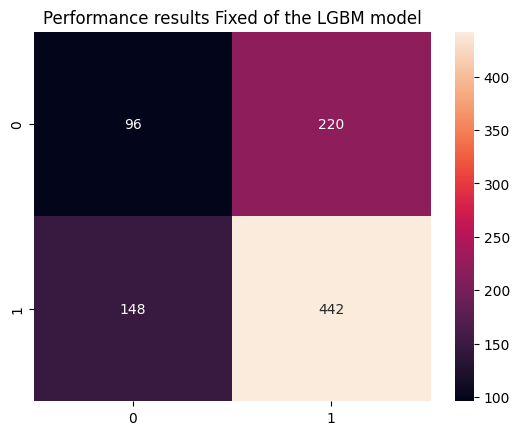


Feature Importance of the model



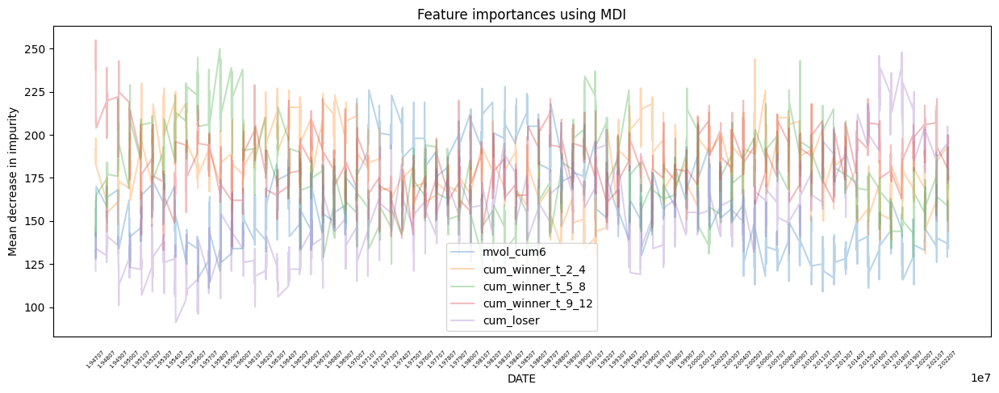

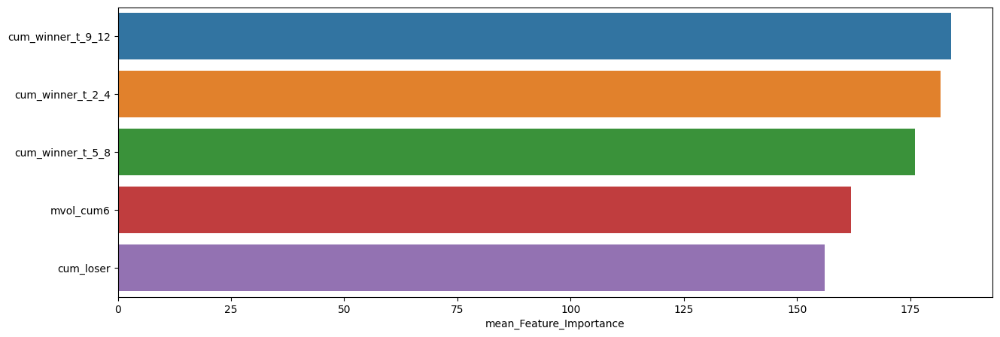

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_9_12,183.970199,255,133
cum_winner_t_2_4,181.622517,244,130
cum_winner_t_5_8,175.982340,250,112
mvol_cum6,161.985651,228,109
cum_loser,156.136865,248,91


In [40]:
Fixed_LGBM_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                    window_size=240, # window size (훈련 데이터 셋 크기)
                                    method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                    model=LGBM, # 사용할 모델
                                    model_name='LGBM', # 사용한 모델 명
                                    plot=True, # 모델 성능 지표 시각화 여부
                                    plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.37      0.32      0.34        75
         1.0       0.68      0.73      0.71       151

    accuracy                           0.59       226
   macro avg       0.53      0.52      0.52       226
weighted avg       0.58      0.59      0.58       226


accuracy : 0.5929203539823009

precision : 0.6832298136645962

recall : 0.7284768211920529

F1-Score : 0.7051282051282051



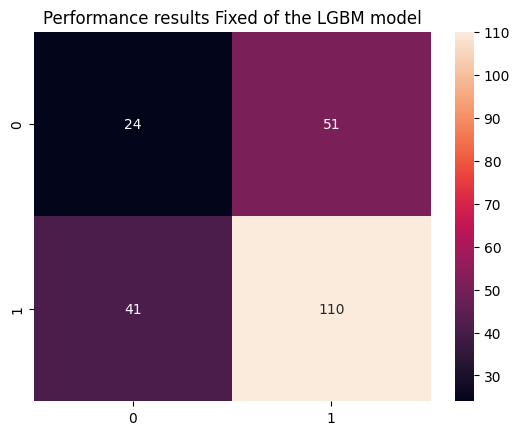


Feature Importance of the model



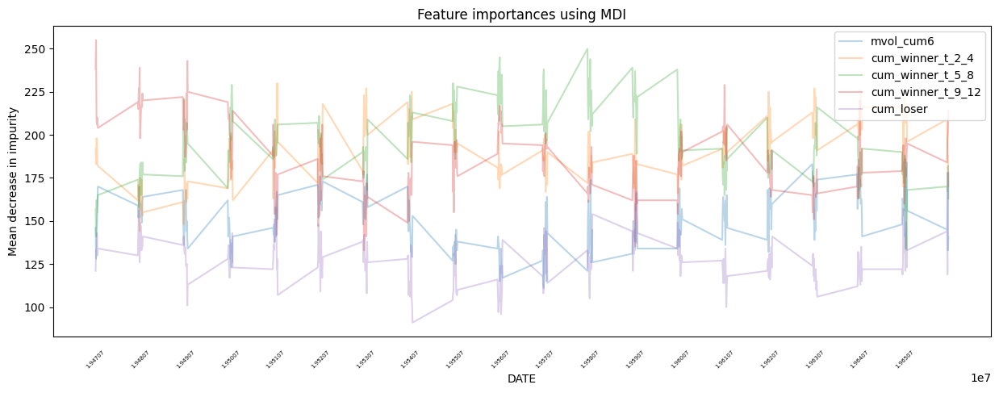

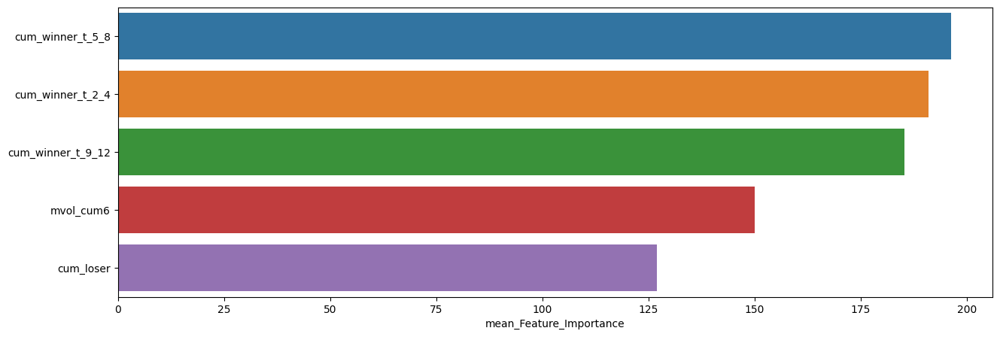

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,196.287611,250,133
cum_winner_t_2_4,190.986726,230,144
cum_winner_t_9_12,185.327434,255,133
mvol_cum6,150.097345,186,111
cum_loser,127.053097,178,91



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.31      0.35        75
         1.0       0.69      0.78      0.74       151

    accuracy                           0.62       226
   macro avg       0.55      0.54      0.54       226
weighted avg       0.60      0.62      0.61       226


accuracy : 0.6238938053097345

precision : 0.6941176470588235

recall : 0.7814569536423841

F1-Score : 0.735202492211838



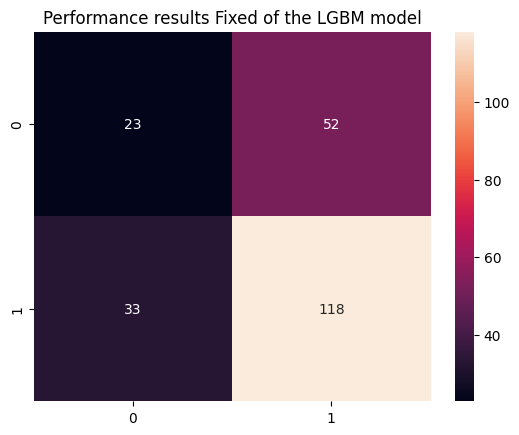


Feature Importance of the model



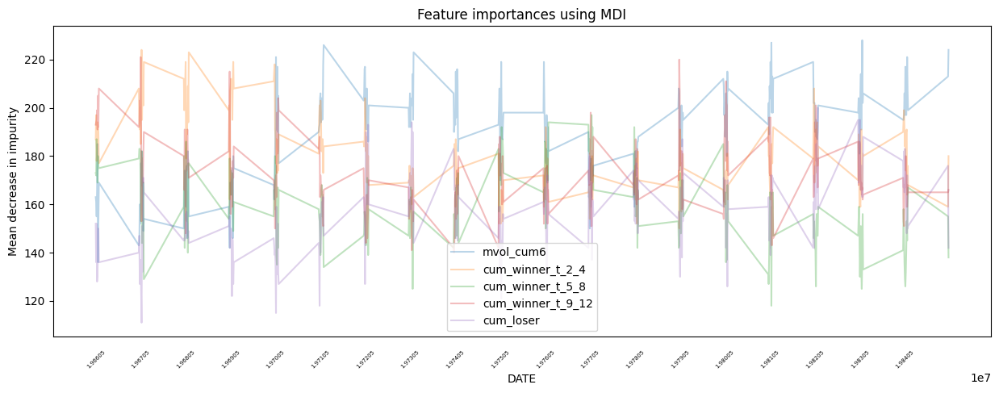

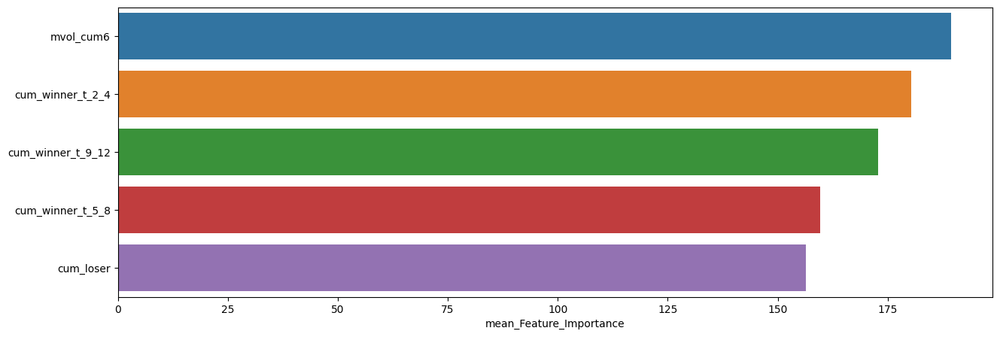

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,189.376106,228,136
cum_winner_t_2_4,180.323009,224,150
cum_winner_t_9_12,172.853982,221,140
cum_winner_t_5_8,159.619469,197,118
cum_loser,156.464602,200,111



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.32      0.20      0.25        70
         1.0       0.69      0.81      0.75       156

    accuracy                           0.62       226
   macro avg       0.51      0.50      0.50       226
weighted avg       0.58      0.62      0.59       226


accuracy : 0.6194690265486725

precision : 0.6923076923076923

recall : 0.8076923076923077

F1-Score : 0.7455621301775147



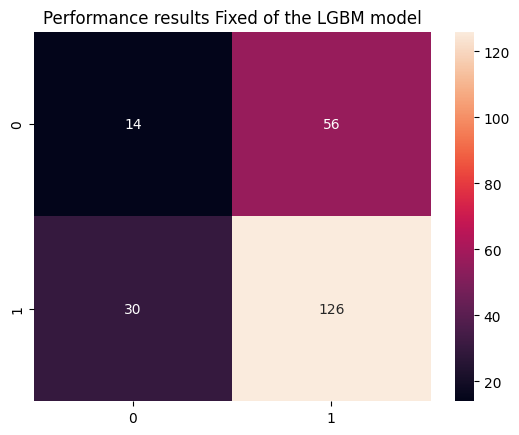


Feature Importance of the model



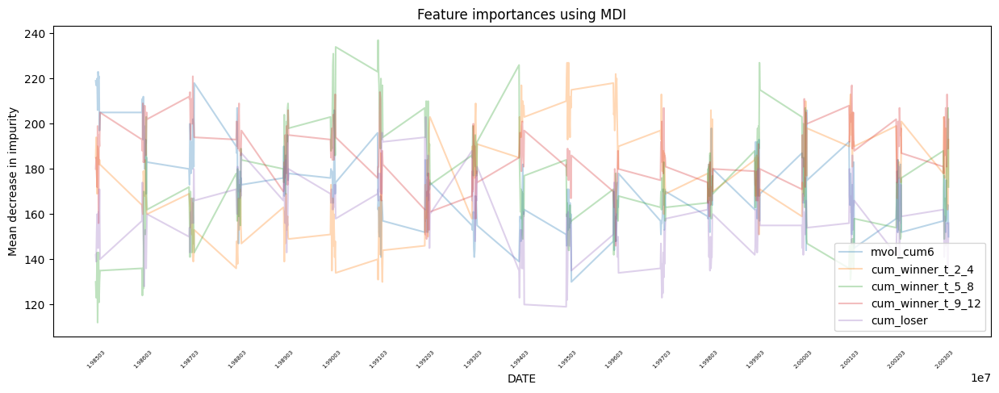

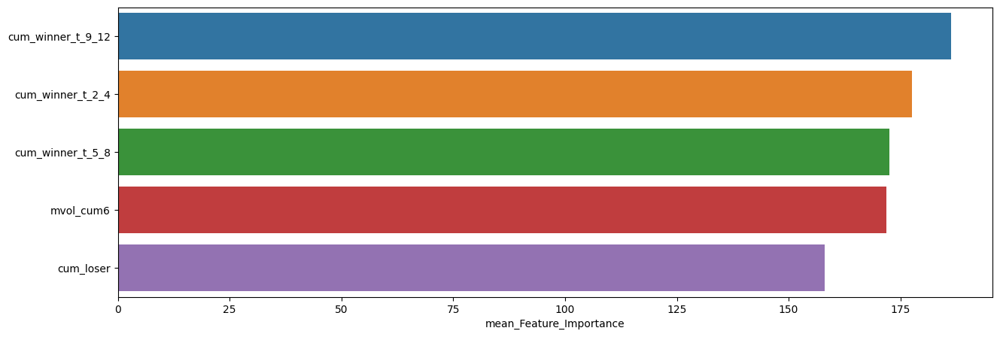

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_9_12,186.278761,221,146
cum_winner_t_2_4,177.553097,227,130
cum_winner_t_5_8,172.446903,237,112
mvol_cum6,171.889381,223,130
cum_loser,158.035398,203,119



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.44      0.36      0.40        96
         1.0       0.59      0.67      0.63       132

    accuracy                           0.54       228
   macro avg       0.52      0.52      0.51       228
weighted avg       0.53      0.54      0.53       228


accuracy : 0.5394736842105263

precision : 0.5906040268456376

recall : 0.6666666666666666

F1-Score : 0.6263345195729538



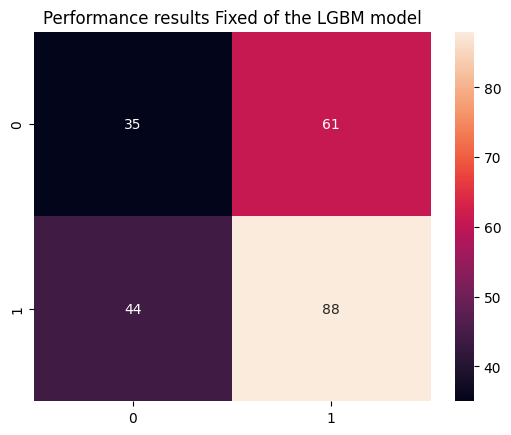


Feature Importance of the model



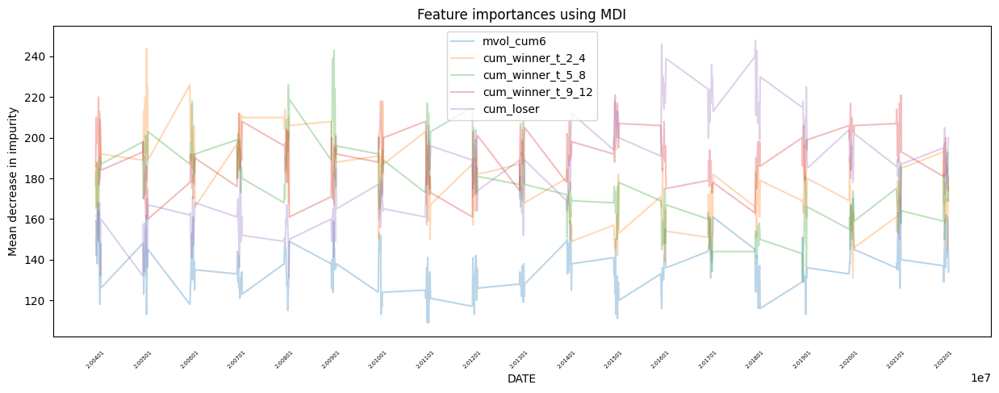

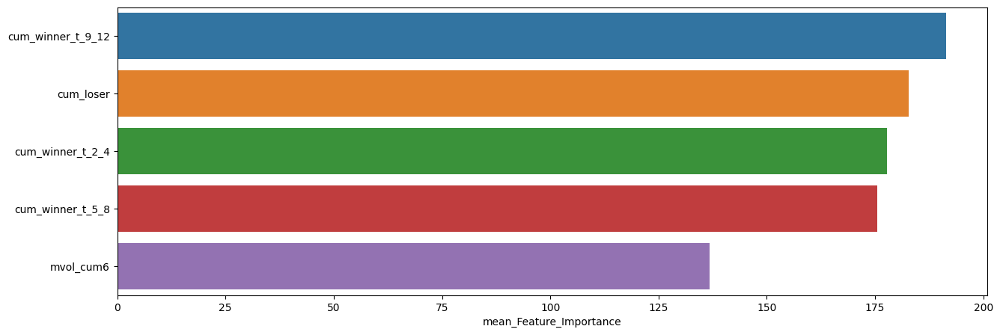

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_9_12,191.355263,221,160
cum_loser,182.758772,248,131
cum_winner_t_2_4,177.662281,244,131
cum_winner_t_5_8,175.578947,243,129
mvol_cum6,136.802632,171,109


In [41]:
slice_feature_importance(Fixed_LGBM_Result, # 모델 추론 결과 데이터
                        4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                        'Fixed', # Rolling Windows Method
                        'LGBM') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



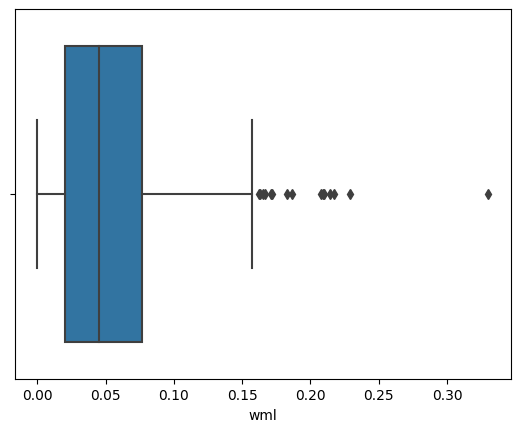

,count,mean,std,min,25%,50%,75%,max
wml,442.0,0.054732,0.045751,0.000128,0.020572,0.045416,0.076584,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



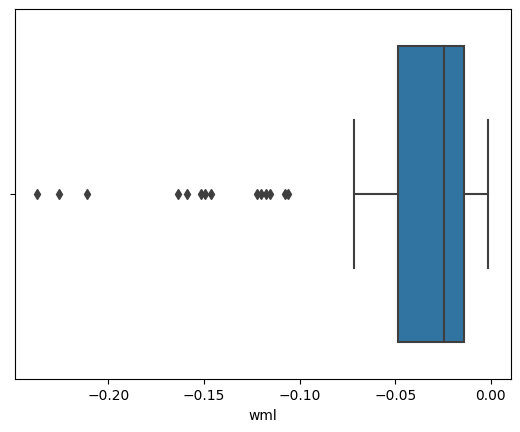

,count,mean,std,min,25%,50%,75%,max
wml,96.0,-0.043915,0.050597,-0.237095,-0.048544,-0.024243,-0.013792,-0.00129



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



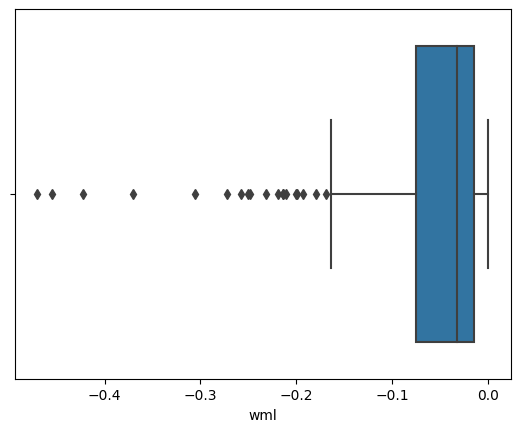

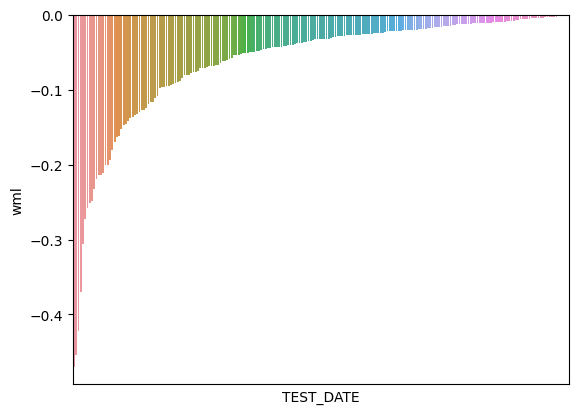

,count,mean,std,min,25%,50%,75%,max
wml,220.0,-0.06172,0.078049,-0.469903,-0.075377,-0.032352,-0.015304,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



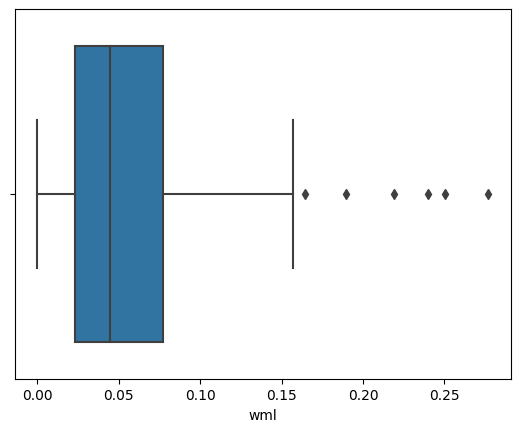

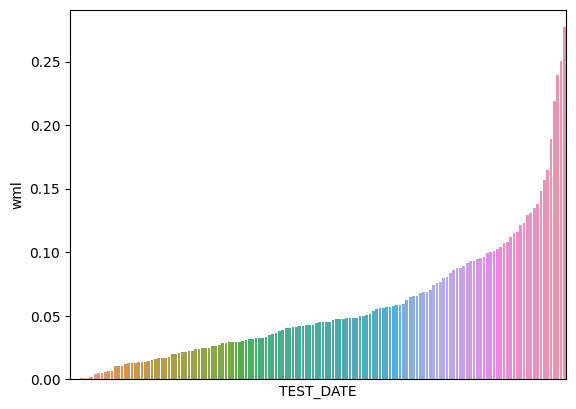

,count,mean,std,min,25%,50%,75%,max
wml,148.0,0.056796,0.049974,0.000007,0.023263,0.044599,0.07738,0.276912


In [42]:
LGBM_A0_P1, LGBM_A1_P0 = What_Pred(Fixed_LGBM_Result,
                                   WML,
                                   'LGBM')

Sharpe Ratio : 0.72615

최근 누적 수익률

  2022년-12월 -> 3739.51
  2022년-11월 -> 3369.14
  2022년-10월 -> 3369.14
  2022년-09월 -> 3369.14
  2022년-08월 -> 3369.14

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2000년-12월 -> 14420.14
  2등 : 2002년-09월 -> 12808.95
  3등 : 2008년-10월 -> 12802.31
  4등 : 2008년-11월 -> 12802.31
  5등 : 2008년-12월 -> 12499.27
  6등 : 2009년-01월 -> 12499.27
  7등 : 2009년-02월 -> 12499.27
  8등 : 2007년-12월 -> 12407.75
  9등 : 2008년-05월 -> 12086.15
  10등 : 2008년-06월 -> 12086.15



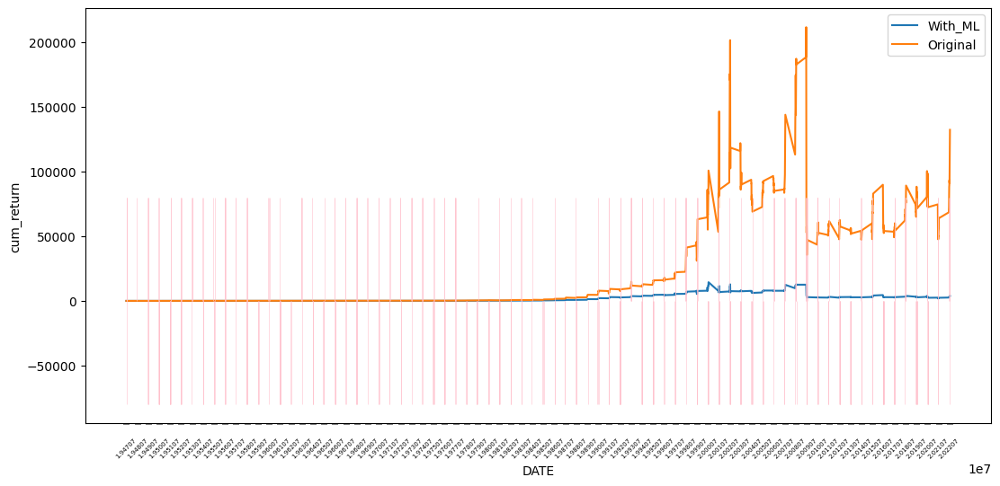

In [43]:
LGBM_F_CUM_RETURN_static = cumm_return_by_dynamic(Fixed_LGBM_Result, # 모델 추론 결과 데이터
                                                   WML, # 원본 데이터의 'wml' 데이터
                                                   'LGBM_PRED_POS_WML', # 모델 추론 결과 칼럼
                                                   LGBM_A0_P1,
                                                   LGBM_A1_P0,
                                                   plot=True) # 시각화 여부

Sharpe Ratio : 0.77536

최근 누적 수익률

  2022년-12월 -> 5347.33
  2022년-11월 -> 4900.03
  2022년-10월 -> 4818.32
  2022년-09월 -> 4539.21
  2022년-08월 -> 4338.75

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 6864.57
  2등 : 2008년-11월 -> 6657.92
  3등 : 2009년-01월 -> 6652.40
  4등 : 2008년-12월 -> 6576.18
  5등 : 2002년-09월 -> 6484.99
  6등 : 2008년-10월 -> 6468.93
  7등 : 2008년-06월 -> 6262.78
  8등 : 2008년-09월 -> 6203.76
  9등 : 2008년-07월 -> 6129.64
  10등 : 2008년-08월 -> 6112.81



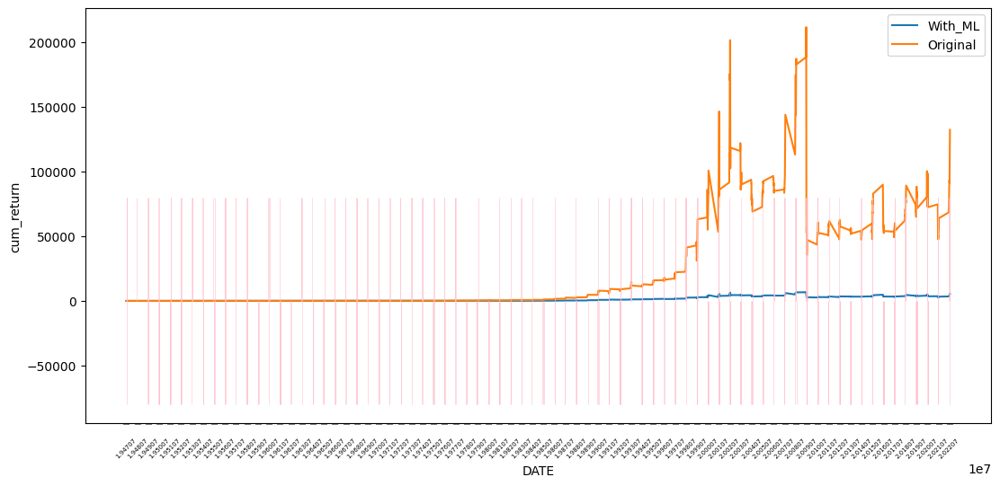

In [44]:
LGBM_F_CUM_RETURN_dynamic = cumm_return_by_dynamic(Fixed_LGBM_Result, # 모델 추론 결과 데이터
                                                   WML, # 원본 데이터의 'wml' 데이터
                                                   'LGBM_PROB_POS_WML', # 모델 추론 결과 칼럼
                                                   LGBM_A0_P1,
                                                   LGBM_A1_P0,
                                                   plot=True) # 시각화 여부

## Rolling Expanding Windows

### Random Forest

In [45]:
RDF_Param={} 
RDF = RandomForestClassifier(**RDF_Param, random_state=42)

**************************************************

RDF Model의 Rolling Expanding Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   bootstrap : True
   ccp_alpha : 0.0
   class_weight : None
   criterion : gini
   max_depth : None
   max_features : sqrt
   max_leaf_nodes : None
   max_samples : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_jobs : None
   oob_score : False
   random_state : 42
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.40      0.23      0.29       316
         1.0       0.66      0.82      0.73       590

    accuracy                           0.61       906
   macro avg       0.53      0.52      0.51       906
weighted avg       0.57      0.61      0.58       906


accuracy : 0.6114790286975718

precision : 0.6639118457300276

recall : 0.8169491525423729

F1-Score : 0.7325227963525835



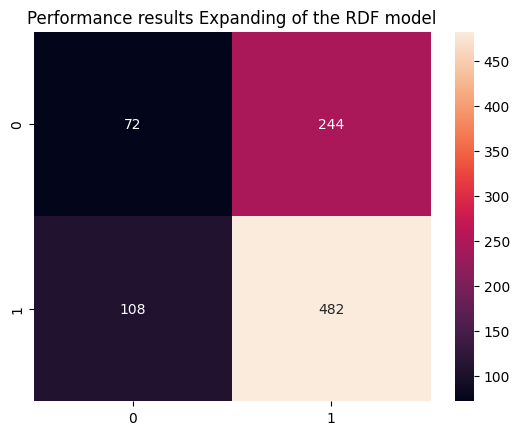


Feature Importance of the model



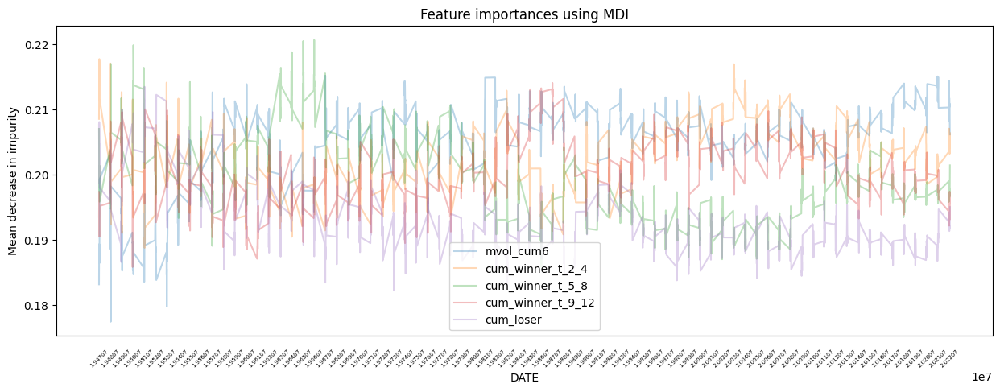

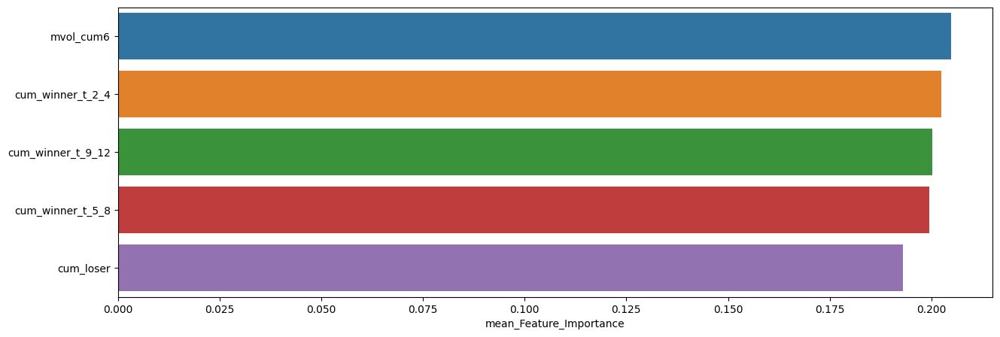

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.204795,0.215194,0.177457
cum_winner_t_2_4,0.202464,0.217734,0.188786
cum_winner_t_9_12,0.200161,0.214080,0.185843
cum_winner_t_5_8,0.199505,0.220648,0.185844
cum_loser,0.193075,0.213488,0.182251


In [46]:
Expanding_RDF_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                      window_size=240, # window size (훈련 데이터 셋 크기)
                                      method='Expanding', # Rolling Winodw Method (Fixed or Expanding)
                                      model=RDF, # 사용할 모델
                                      model_name='RDF', # 사용한 모델 명
                                      plot=True, # 모델 성능 지표 시각화 여부
                                      plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.38      0.28      0.32        75
         1.0       0.68      0.77      0.73       151

    accuracy                           0.61       226
   macro avg       0.53      0.53      0.52       226
weighted avg       0.58      0.61      0.59       226


accuracy : 0.6106194690265486

precision : 0.6842105263157895

recall : 0.7748344370860927

F1-Score : 0.7267080745341615



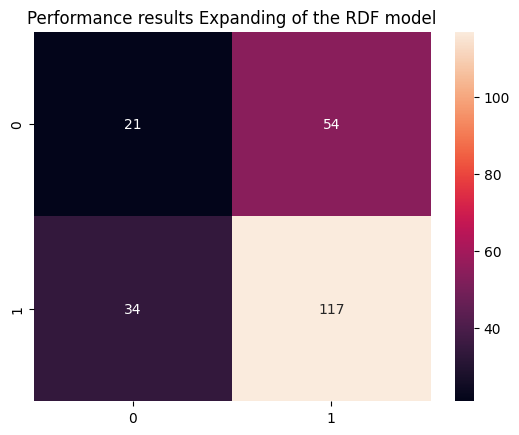


Feature Importance of the model



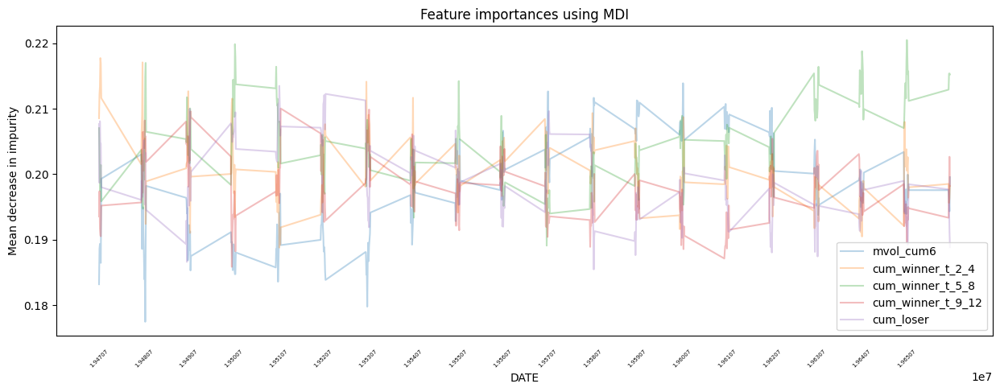

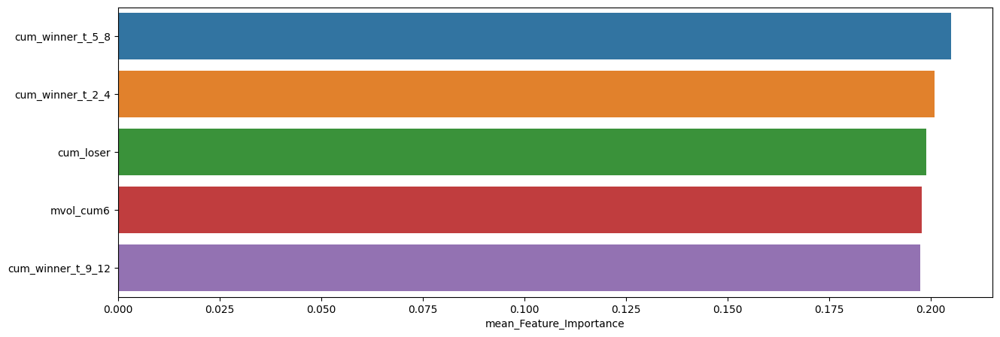

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,0.204948,0.220490,0.189093
cum_winner_t_2_4,0.200837,0.217734,0.188786
cum_loser,0.198880,0.213488,0.185454
mvol_cum6,0.197846,0.213890,0.177457
cum_winner_t_9_12,0.197489,0.210035,0.185843



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.37      0.20      0.26        75
         1.0       0.68      0.83      0.74       151

    accuracy                           0.62       226
   macro avg       0.52      0.51      0.50       226
weighted avg       0.57      0.62      0.58       226


accuracy : 0.6194690265486725

precision : 0.6756756756756757

recall : 0.8278145695364238

F1-Score : 0.744047619047619



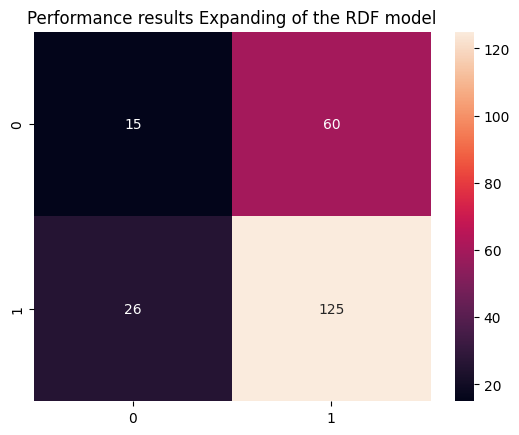


Feature Importance of the model



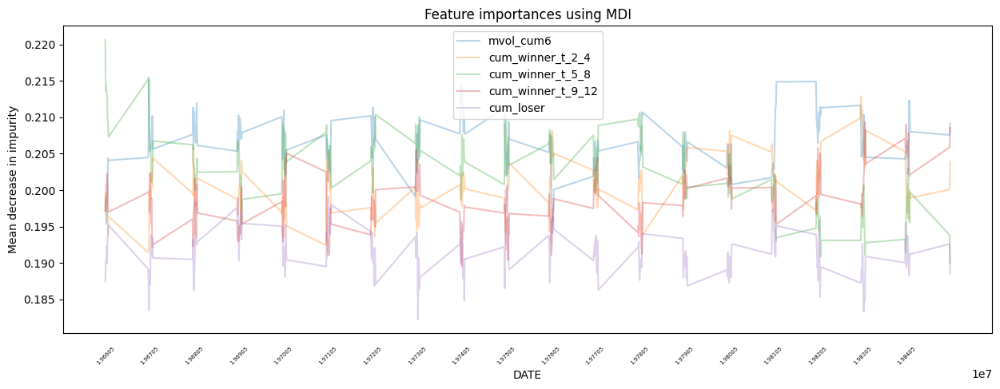

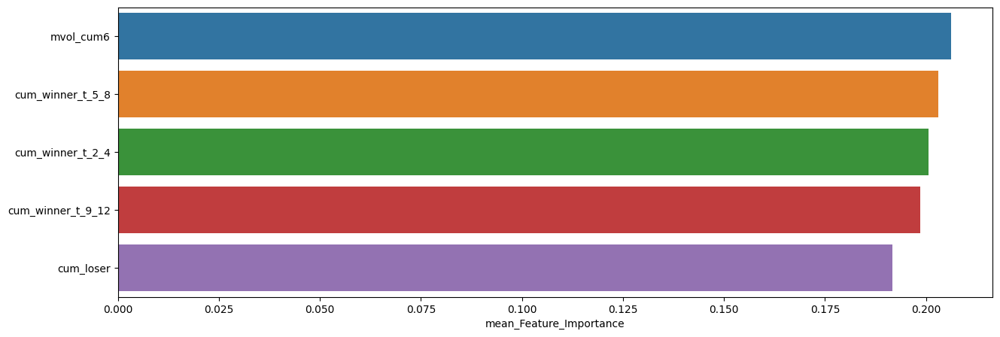

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.206143,0.215194,0.194083
cum_winner_t_5_8,0.203011,0.220648,0.189942
cum_winner_t_2_4,0.200650,0.212901,0.191460
cum_winner_t_9_12,0.198524,0.209332,0.189513
cum_loser,0.191673,0.200670,0.182251



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.39      0.19      0.25        70
         1.0       0.70      0.87      0.78       156

    accuracy                           0.66       226
   macro avg       0.55      0.53      0.52       226
weighted avg       0.61      0.66      0.62       226


accuracy : 0.6592920353982301

precision : 0.7046632124352331

recall : 0.8717948717948718

F1-Score : 0.7793696275071633



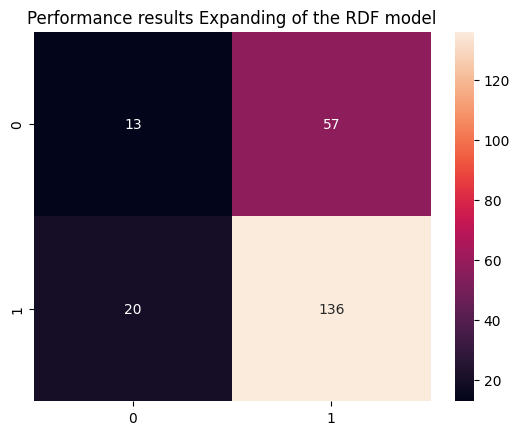


Feature Importance of the model



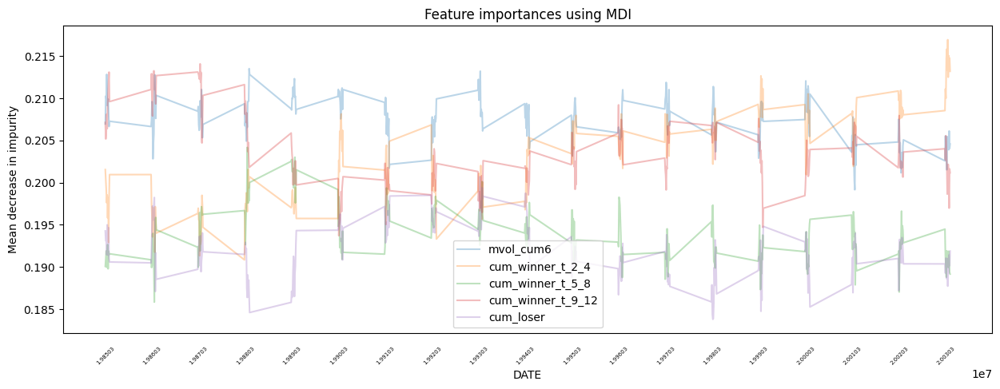

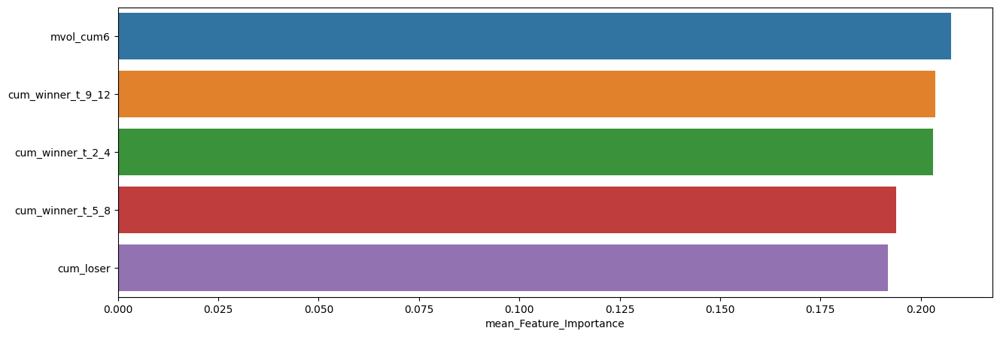

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.207509,0.213516,0.199161
cum_winner_t_9_12,0.203552,0.214080,0.193716
cum_winner_t_2_4,0.203105,0.216941,0.190842
cum_winner_t_5_8,0.193947,0.204175,0.185844
cum_loser,0.191887,0.200703,0.183802



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.45      0.24      0.31        96
         1.0       0.59      0.79      0.67       132

    accuracy                           0.56       228
   macro avg       0.52      0.51      0.49       228
weighted avg       0.53      0.56      0.52       228


accuracy : 0.5570175438596491

precision : 0.5875706214689266

recall : 0.7878787878787878

F1-Score : 0.6731391585760518



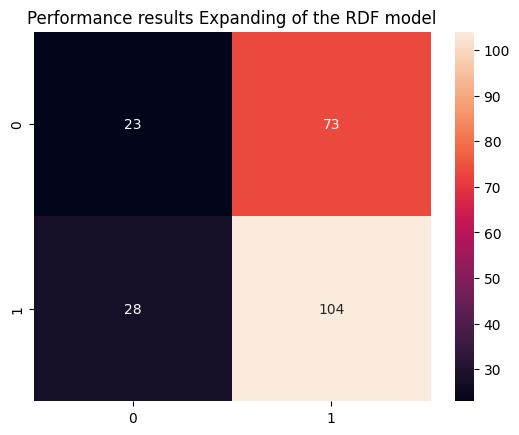


Feature Importance of the model



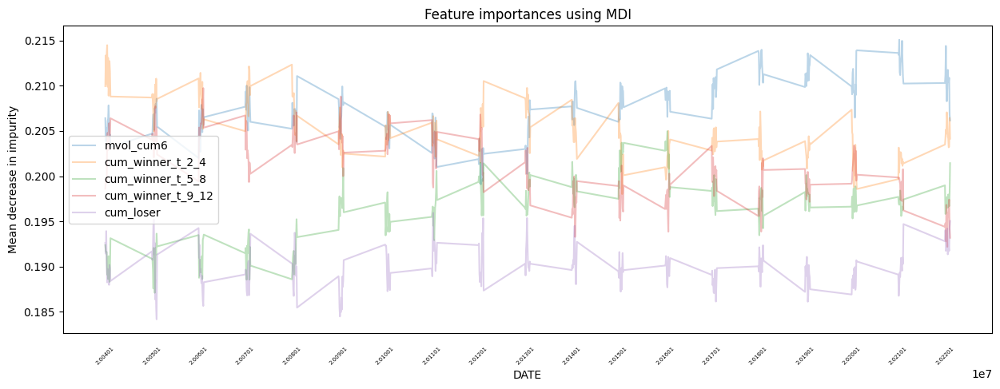

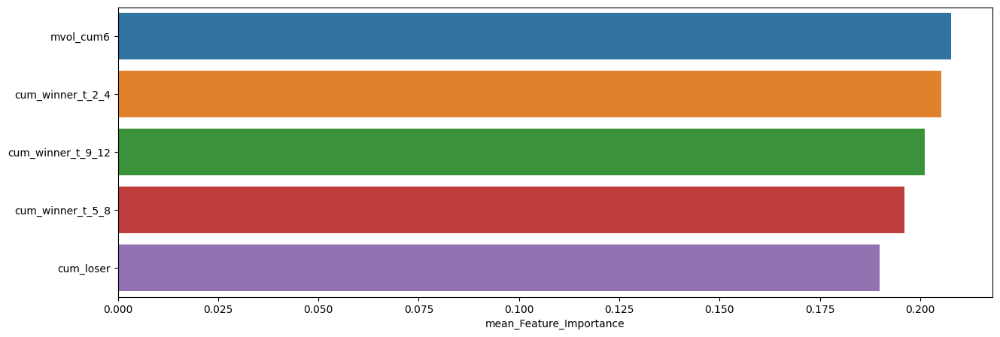

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.207658,0.215084,0.199101
cum_winner_t_2_4,0.205242,0.214492,0.198026
cum_winner_t_9_12,0.201070,0.209740,0.192189
cum_winner_t_5_8,0.196143,0.204982,0.187103
cum_loser,0.189888,0.195943,0.184167


In [47]:
slice_feature_importance(Expanding_RDF_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Expanding', # Rolling Windows Method
                         'RDF') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



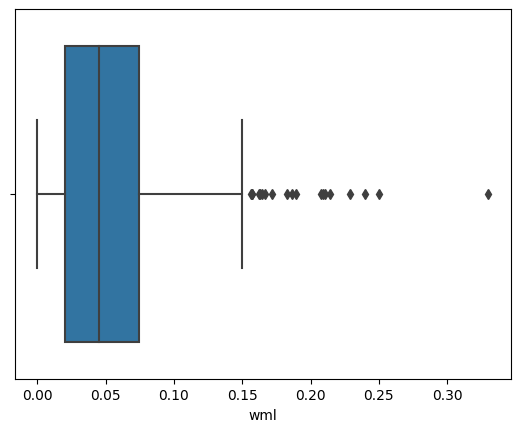

,count,mean,std,min,25%,50%,75%,max
wml,482.0,0.054342,0.045811,0.000007,0.020499,0.04509,0.074395,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



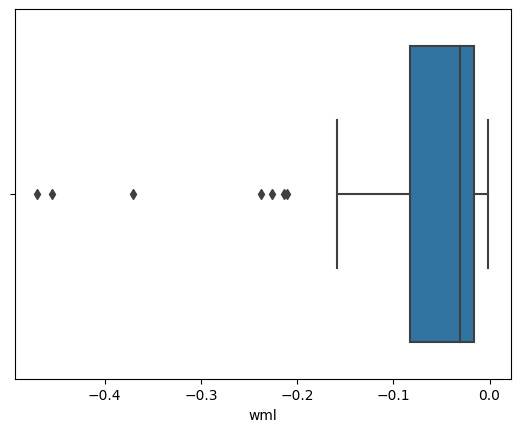

,count,mean,std,min,25%,50%,75%,max
wml,72.0,-0.068925,0.095536,-0.469903,-0.082182,-0.030873,-0.015868,-0.00129



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



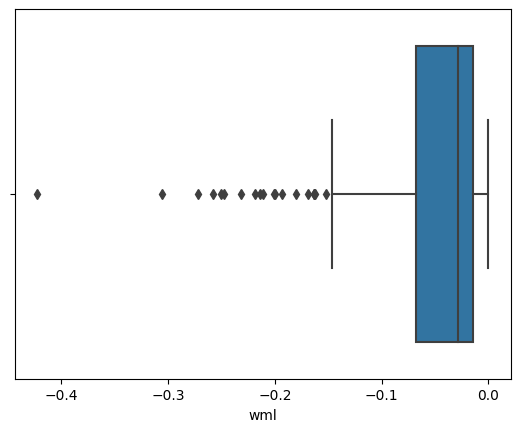

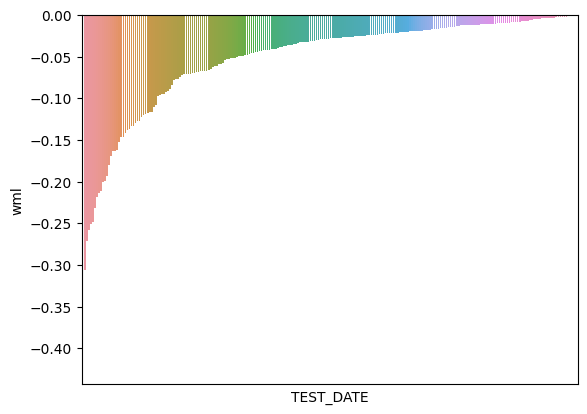

,count,mean,std,min,25%,50%,75%,max
wml,244.0,-0.052589,0.062049,-0.4224,-0.067487,-0.028293,-0.014437,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



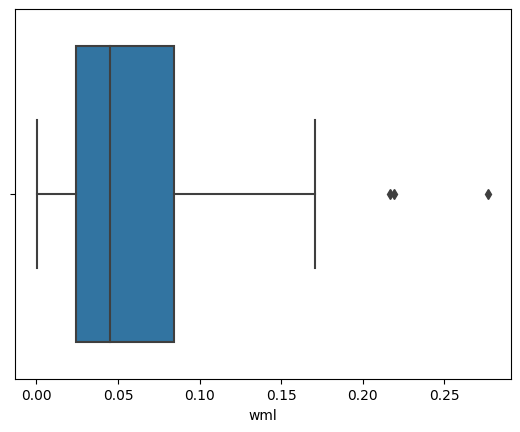

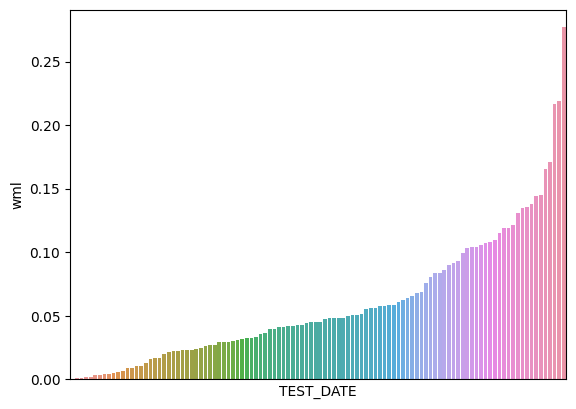

,count,mean,std,min,25%,50%,75%,max
wml,108.0,0.0593,0.051067,0.000577,0.023956,0.045172,0.084563,0.276912


In [48]:
RDF_A0_P1, RDF_A1_P0 = What_Pred(Expanding_RDF_Result, WML, 'RDF')

Sharpe Ratio : 0.66529

최근 누적 수익률

  2022년-12월 -> 80776.24
  2022년-11월 -> 80776.24
  2022년-10월 -> 80776.24
  2022년-09월 -> 71526.22
  2022년-08월 -> 65027.89

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2022년-12월 -> 80776.24
  2등 : 2022년-11월 -> 80776.24
  3등 : 2022년-10월 -> 80776.24
  4등 : 2009년-02월 -> 77704.61
  5등 : 2020년-03월 -> 77293.30
  6등 : 2016년-01월 -> 73055.31
  7등 : 2008년-06월 -> 72959.67
  8등 : 2022년-09월 -> 71526.22
  9등 : 2008년-11월 -> 70868.08
  10등 : 2008년-12월 -> 69190.68



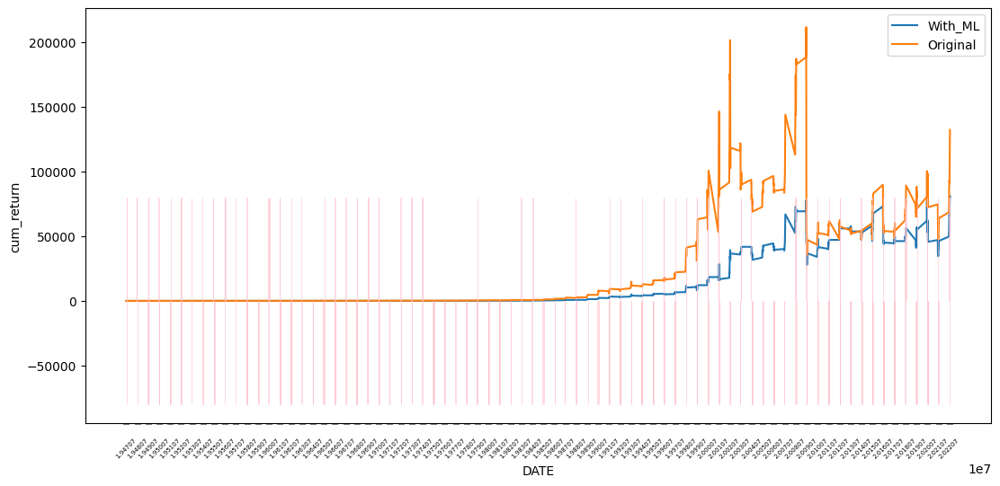

In [49]:
RDF_E_CUM_RETURN_static = cumm_return_by_dynamic(Expanding_RDF_Result,
                                                 WML,
                                                 'RDF_PRED_POS_WML',
                                                 RDF_A0_P1,
                                                 RDF_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.74352

최근 누적 수익률

  2022년-12월 -> 6999.66
  2022년-11월 -> 6635.01
  2022년-10월 -> 6482.05
  2022년-09월 -> 5986.49
  2022년-08월 -> 5674.55

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2022년-12월 -> 6999.66
  2등 : 2022년-11월 -> 6635.01
  3등 : 2022년-10월 -> 6482.05
  4등 : 2009년-02월 -> 6230.44
  5등 : 2022년-09월 -> 5986.49
  6등 : 2008년-11월 -> 5880.60
  7등 : 2009년-01월 -> 5855.70
  8등 : 2008년-12월 -> 5792.90
  9등 : 2008년-06월 -> 5785.19
  10등 : 2022년-07월 -> 5747.42



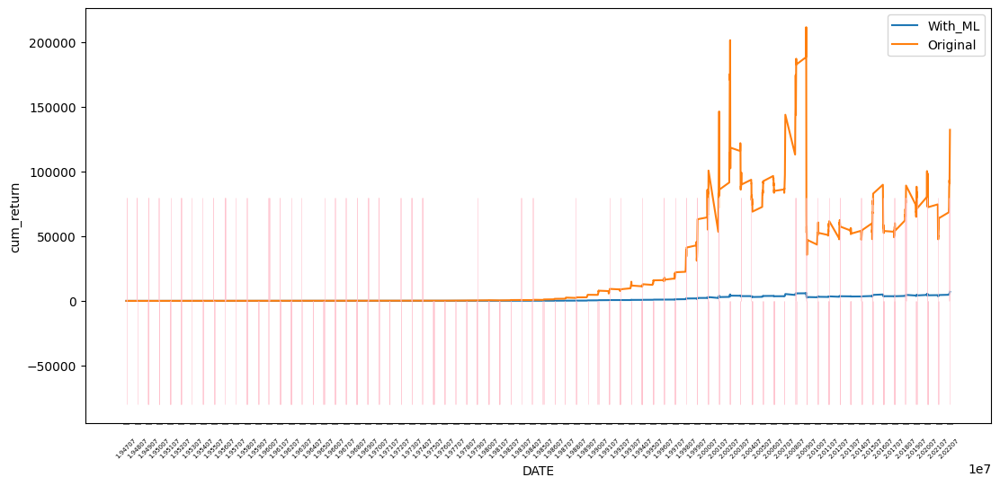

In [50]:
RDF_E_CUM_RETURN_dynamic = cumm_return_by_dynamic(Expanding_RDF_Result,
                                                 WML,
                                                 'RDF_PROB_POS_WML',
                                                 RDF_A0_P1,
                                                 RDF_A1_P0,
                                                 plot=True)

### Grdient Boosting

In [51]:
GBC_Param = {}
GBC = GradientBoostingClassifier(*GBC_Param, random_state=42)

**************************************************

GBC Model의 Rolling Expanding Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   ccp_alpha : 0.0
   criterion : friedman_mse
   init : None
   learning_rate : 0.1
   loss : log_loss
   max_depth : 3
   max_features : None
   max_leaf_nodes : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_iter_no_change : None
   random_state : 42
   subsample : 1.0
   tol : 0.0001
   validation_fraction : 0.1
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.37      0.14      0.21       316
         1.0       0.65      0.87      0.75       590

    accuracy                           0.62       906
   macro avg       0.51      0.51      0.48       906
weighted avg       0.56      0.62      0.56       906


accuracy : 0.6169977924944813

precision : 0.6547770700636942

recall : 0.8711864406779661

F1-Score : 0.7476363636363635



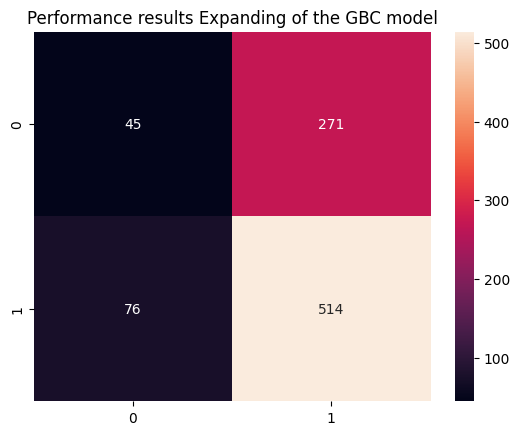


Feature Importance of the model



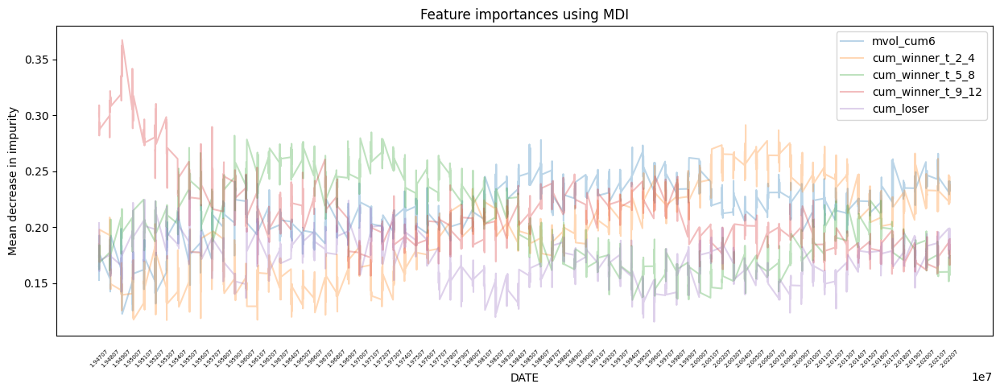

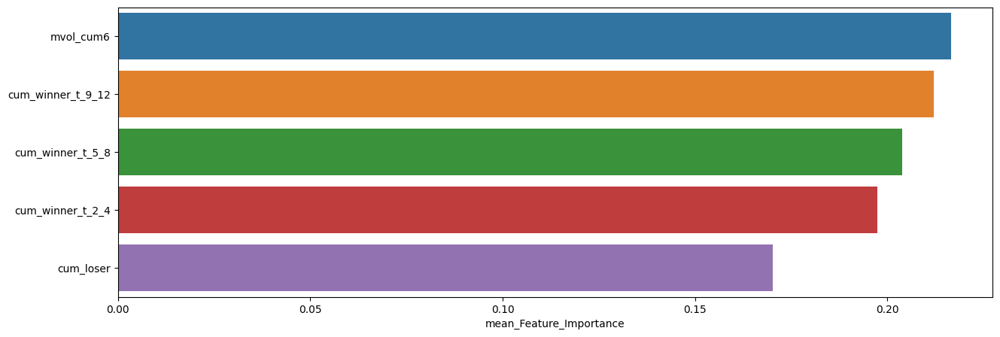

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.216478,0.277988,0.122513
cum_winner_t_9_12,0.212080,0.367358,0.156561
cum_winner_t_5_8,0.203905,0.284860,0.134941
cum_winner_t_2_4,0.197408,0.291394,0.116917
cum_loser,0.170129,0.232892,0.115468


In [52]:
Expanding_GBC_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                      window_size=240, # window size (훈련 데이터 셋 크기)
                                      method='Expanding', # Rolling Winodw Method (Fixed or Expanding)
                                      model=GBC, # 사용할 모델
                                      model_name='GBC', # 사용한 모델 명
                                      plot=True, # 모델 성능 지표 시각화 여부
                                      plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.20      0.27        75
         1.0       0.68      0.86      0.76       151

    accuracy                           0.64       226
   macro avg       0.55      0.53      0.52       226
weighted avg       0.60      0.64      0.60       226


accuracy : 0.6415929203539823

precision : 0.6842105263157895

recall : 0.8609271523178808

F1-Score : 0.7624633431085045



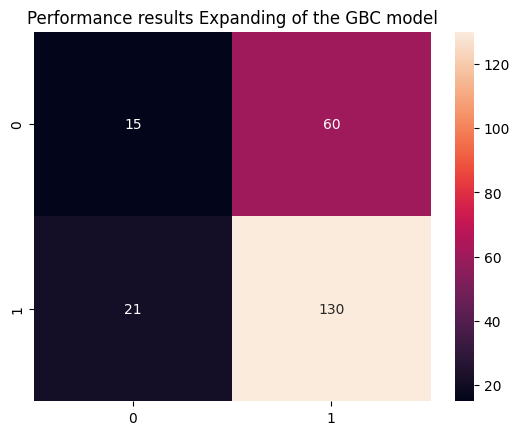


Feature Importance of the model



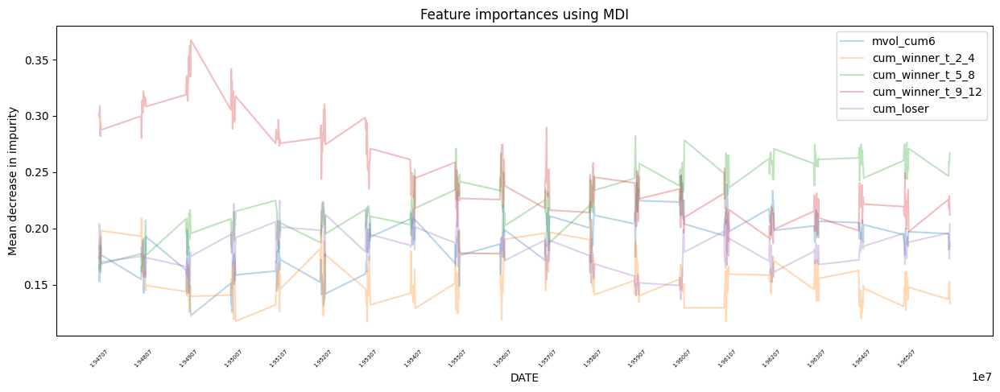

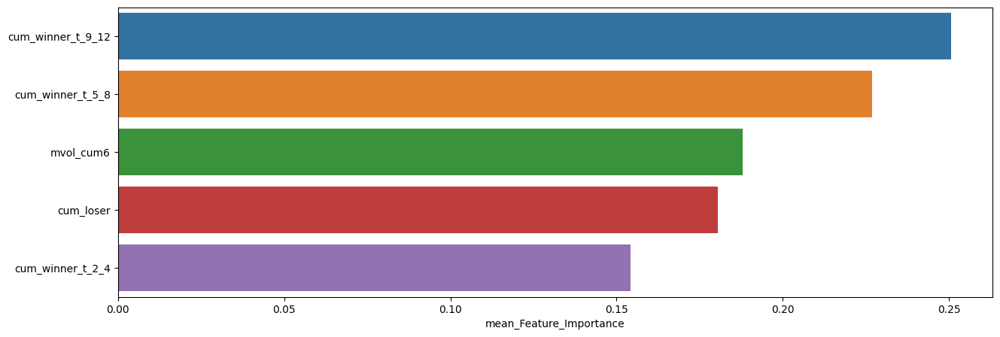

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_9_12,0.250524,0.367358,0.167312
cum_winner_t_5_8,0.226762,0.281892,0.161270
mvol_cum6,0.187972,0.246693,0.122513
cum_loser,0.180476,0.232892,0.136689
cum_winner_t_2_4,0.154266,0.208805,0.116917



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.34      0.19      0.24        75
         1.0       0.67      0.82      0.74       151

    accuracy                           0.61       226
   macro avg       0.51      0.50      0.49       226
weighted avg       0.56      0.61      0.57       226


accuracy : 0.6106194690265486

precision : 0.6702702702702703

recall : 0.8211920529801324

F1-Score : 0.738095238095238



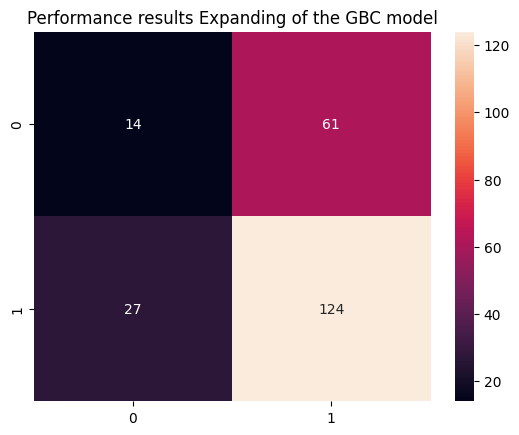


Feature Importance of the model



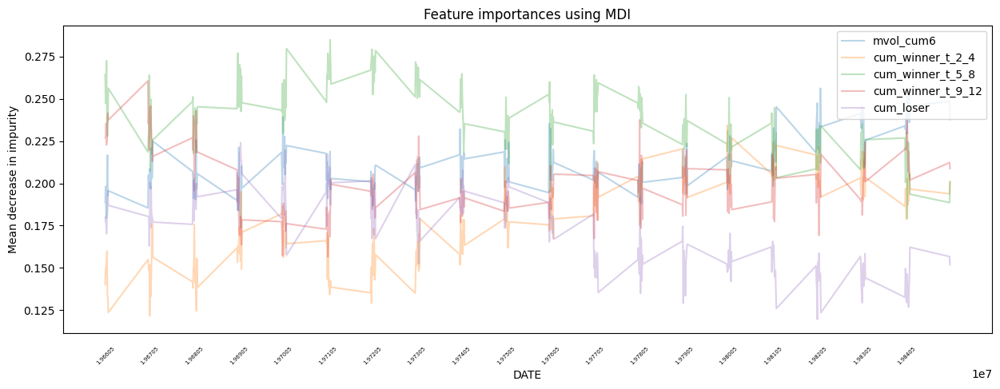

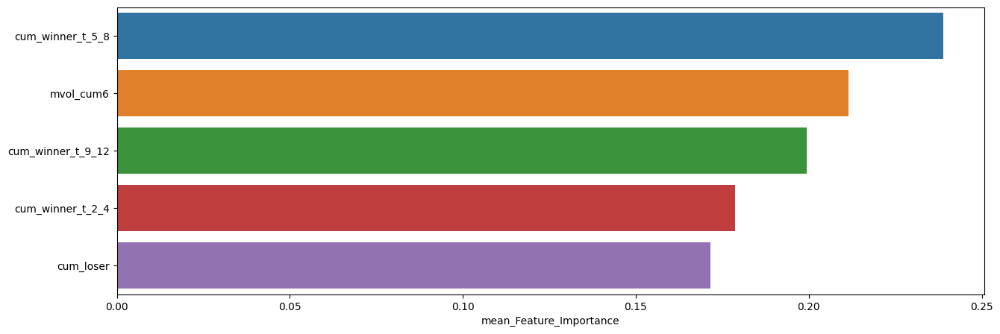

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,0.238822,0.284860,0.179422
mvol_cum6,0.211457,0.256214,0.173768
cum_winner_t_9_12,0.199463,0.260610,0.156561
cum_winner_t_2_4,0.178756,0.234274,0.121667
cum_loser,0.171502,0.223924,0.119596



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.35      0.10      0.16        70
         1.0       0.69      0.92      0.79       156

    accuracy                           0.66       226
   macro avg       0.52      0.51      0.47       226
weighted avg       0.59      0.66      0.59       226


accuracy : 0.6637168141592921

precision : 0.6941747572815534

recall : 0.9166666666666666

F1-Score : 0.7900552486187846



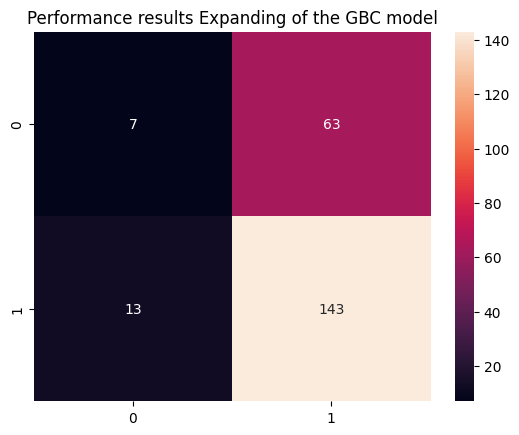


Feature Importance of the model



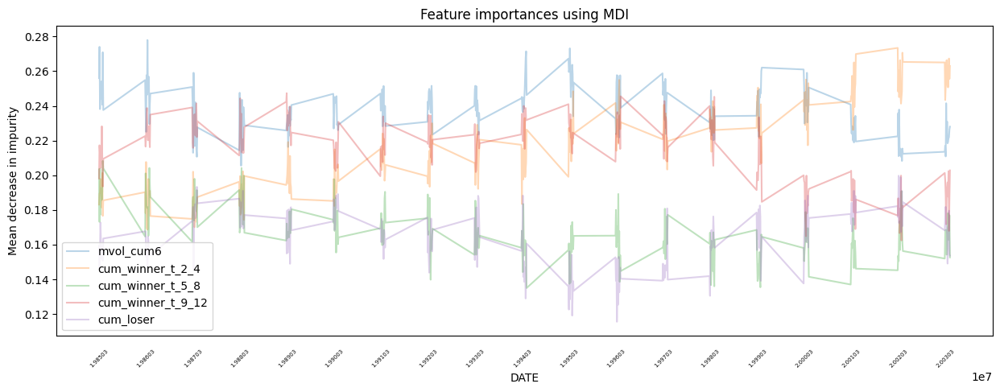

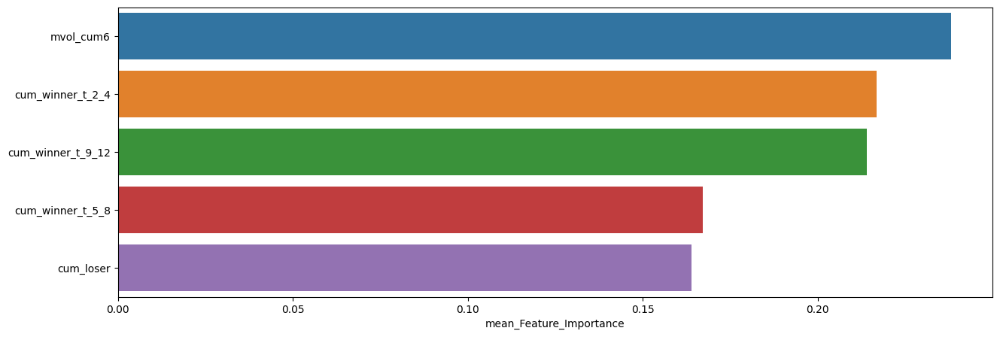

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.238045,0.277988,0.205532
cum_winner_t_2_4,0.216710,0.273451,0.168615
cum_winner_t_9_12,0.214017,0.247313,0.162398
cum_winner_t_5_8,0.167240,0.208274,0.134941
cum_loser,0.163987,0.199705,0.115468



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.38      0.09      0.15        96
         1.0       0.57      0.89      0.70       132

    accuracy                           0.55       228
   macro avg       0.47      0.49      0.42       228
weighted avg       0.49      0.55      0.47       228


accuracy : 0.5526315789473685

precision : 0.5735294117647058

recall : 0.8863636363636364

F1-Score : 0.6964285714285713



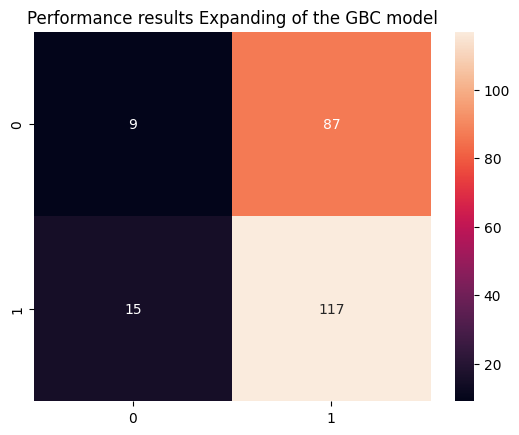


Feature Importance of the model



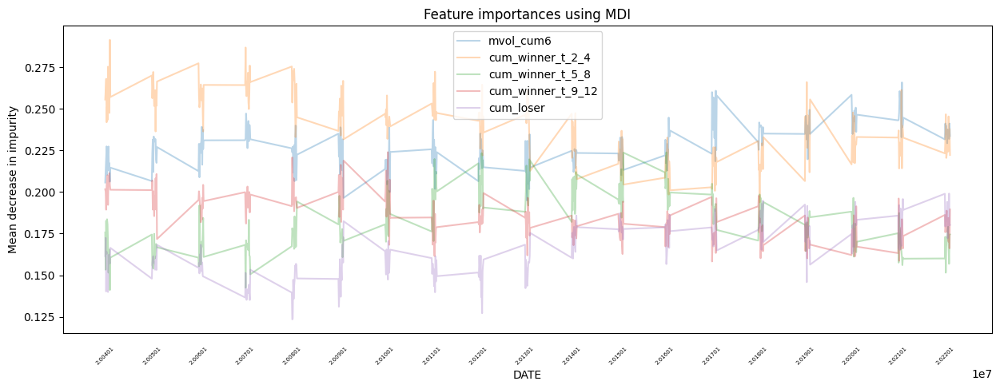

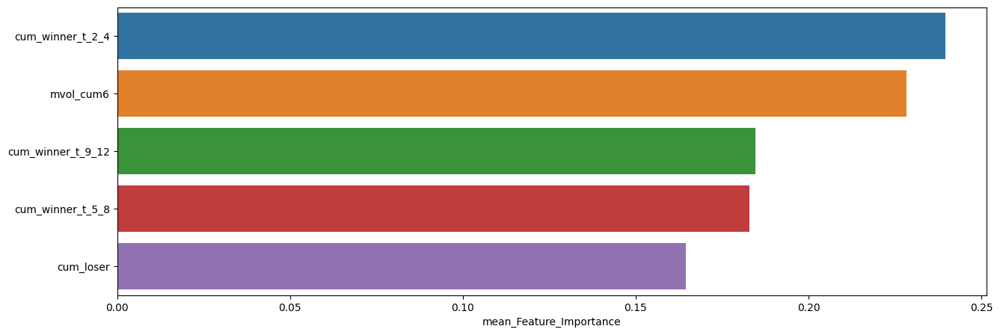

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_2_4,0.239528,0.291394,0.193786
mvol_cum6,0.228334,0.265812,0.194884
cum_winner_t_9_12,0.184560,0.223919,0.158260
cum_winner_t_5_8,0.182978,0.223795,0.141086
cum_loser,0.164599,0.199040,0.123485


In [53]:
slice_feature_importance(Expanding_GBC_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Expanding', # Rolling Windows Method
                         'GBC') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



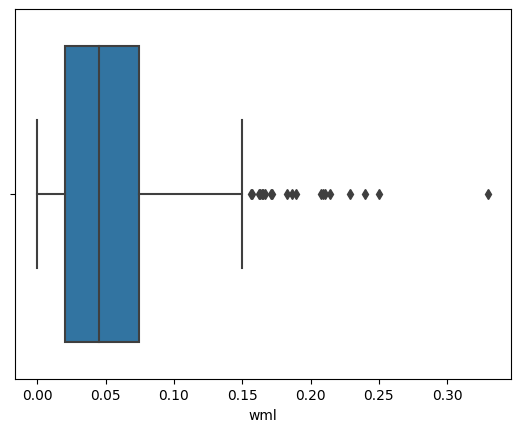

,count,mean,std,min,25%,50%,75%,max
wml,514.0,0.05423,0.045564,0.000007,0.020572,0.04509,0.074132,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



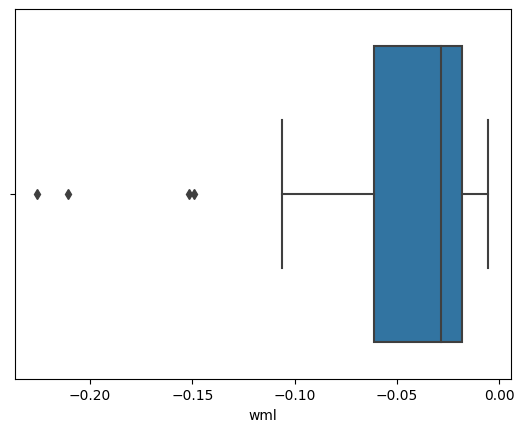

,count,mean,std,min,25%,50%,75%,max
wml,45.0,-0.048291,0.050511,-0.225682,-0.061222,-0.028629,-0.018056,-0.00527



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



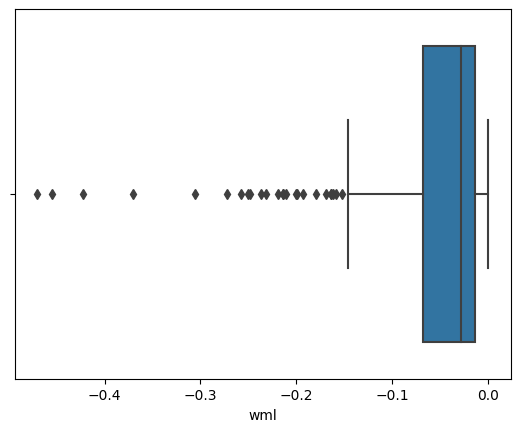

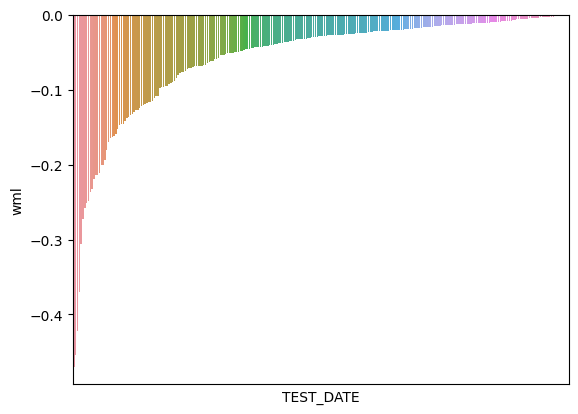

,count,mean,std,min,25%,50%,75%,max
wml,271.0,-0.057643,0.074107,-0.469903,-0.068087,-0.028532,-0.013887,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



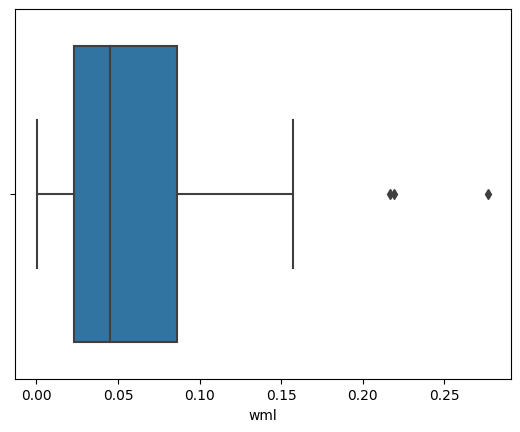

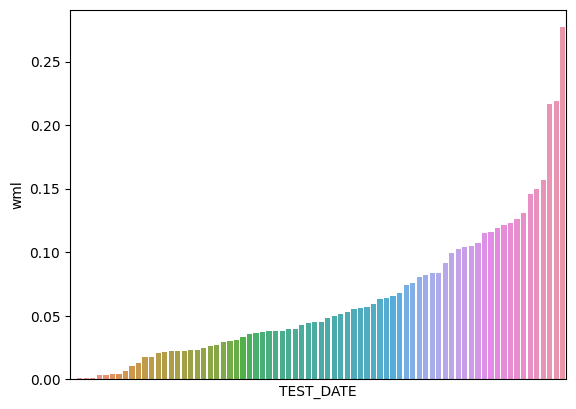

,count,mean,std,min,25%,50%,75%,max
wml,76.0,0.062145,0.054342,0.000627,0.023063,0.045254,0.085899,0.276912


In [54]:
GBC_A0_P1, GBC_A1_P0 = What_Pred(Expanding_GBC_Result, WML, 'GBC')

Sharpe Ratio : 0.73426

최근 누적 수익률

  2022년-12월 -> 14726.02
  2022년-11월 -> 13267.79
  2022년-10월 -> 13267.79
  2022년-09월 -> 11748.34
  2022년-08월 -> 10680.90

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2000년-12월 -> 30924.40
  2등 : 2000년-02월 -> 30459.84
  3등 : 2002년-09월 -> 28849.82
  4등 : 2000년-03월 -> 25813.71
  5등 : 2000년-10월 -> 25789.33
  6등 : 2000년-11월 -> 25472.60
  7등 : 2002년-07월 -> 25121.96
  8등 : 2000년-09월 -> 24729.50
  9등 : 2008년-06월 -> 24641.40
  10등 : 2002년-08월 -> 24394.13



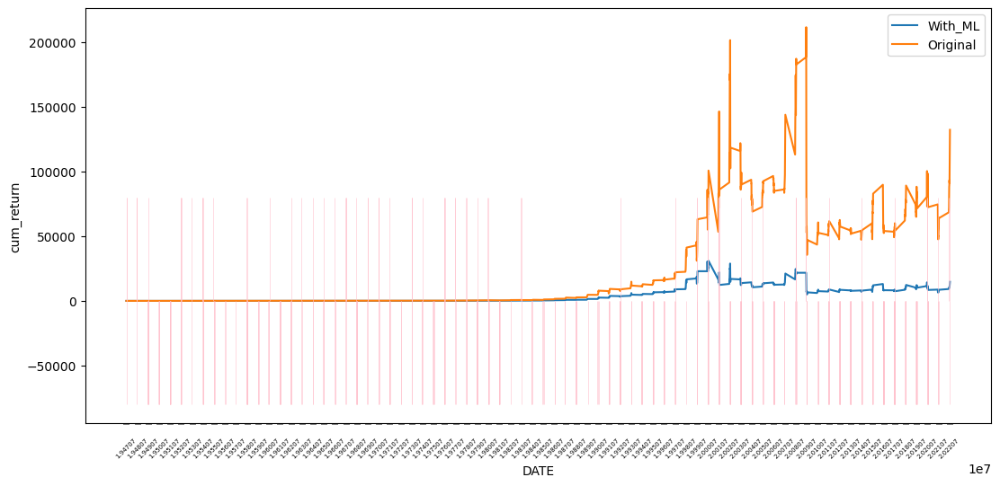

In [55]:
GBC_E_CUM_RETURN_static = cumm_return_by_dynamic(Expanding_GBC_Result,
                                                 WML,
                                                 'GBC_PRED_POS_WML',
                                                 GBC_A0_P1,
                                                 GBC_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.76251

최근 누적 수익률

  2022년-12월 -> 5666.40
  2022년-11월 -> 5264.56
  2022년-10월 -> 5175.22
  2022년-09월 -> 4749.16
  2022년-08월 -> 4497.33

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 5958.99
  2등 : 2002년-09월 -> 5884.54
  3등 : 2008년-11월 -> 5721.68
  4등 : 2009년-01월 -> 5688.38
  5등 : 2022년-12월 -> 5666.40
  6등 : 2008년-06월 -> 5636.52
  7등 : 2008년-12월 -> 5634.71
  8등 : 2008년-10월 -> 5380.21
  9등 : 2002년-07월 -> 5318.89
  10등 : 2022년-11월 -> 5264.56



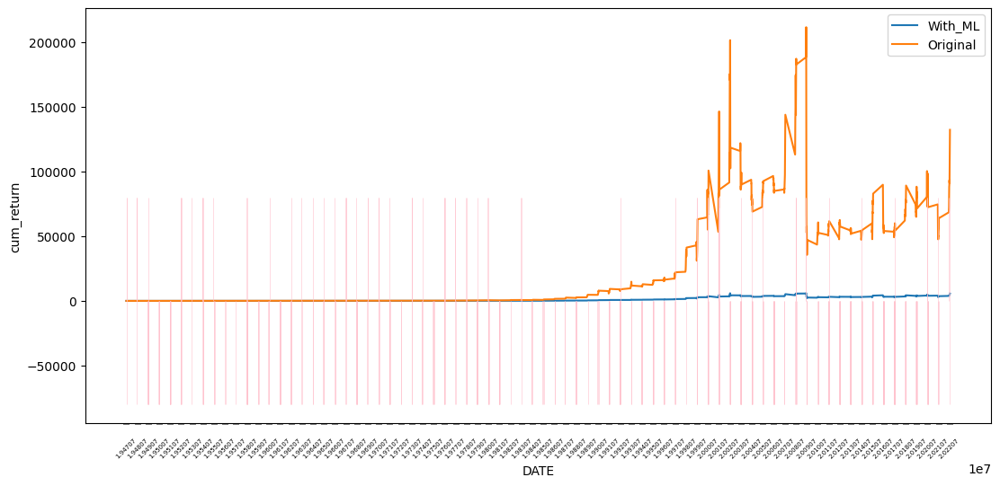

In [56]:
GBC_E_CUM_RETURN_dynamic = cumm_return_by_dynamic(Expanding_GBC_Result,
                                                  WML,
                                                  'GBC_PROB_POS_WML',
                                                  GBC_A0_P1,
                                                  GBC_A1_P0,
                                                  plot=True)

### XGB

In [57]:
XGB_Param = {}
XGB = XGBClassifier(**XGB_Param, random_state=42)

**************************************************

XGB Model의 Rolling Expanding Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   objective : binary:logistic
   use_label_encoder : None
   base_score : None
   booster : None
   callbacks : None
   colsample_bylevel : None
   colsample_bynode : None
   colsample_bytree : None
   early_stopping_rounds : None
   enable_categorical : False
   eval_metric : None
   feature_types : None
   gamma : None
   gpu_id : None
   grow_policy : None
   importance_type : None
   interaction_constraints : None
   learning_rate : None
   max_bin : None
   max_cat_threshold : None
   max_cat_to_onehot : None
   max_delta_step : None
   max_depth : None
   max_leaves : None
   min_child_weight : None
   missing : nan
   monotone_constraints : None
   n_estimators : 100
   n_jobs : None
   num_parallel_tree : None
   predictor : None
   random_state : 42
   reg_alpha : None
   reg_lambda : None
   sampling_method : None
   scale_pos_weight : None
   subsample : No

  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.35      0.27      0.30       316
         1.0       0.65      0.74      0.69       590

    accuracy                           0.57       906
   macro avg       0.50      0.50      0.50       906
weighted avg       0.55      0.57      0.56       906


accuracy : 0.5739514348785872

precision : 0.6526946107784432

recall : 0.7389830508474576

F1-Score : 0.6931637519872814



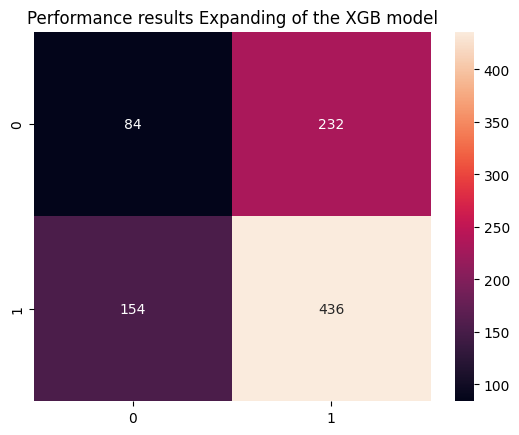


Feature Importance of the model



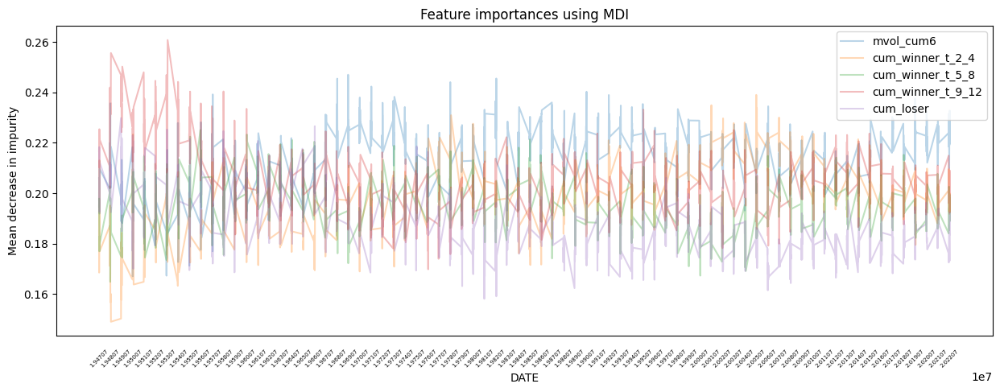

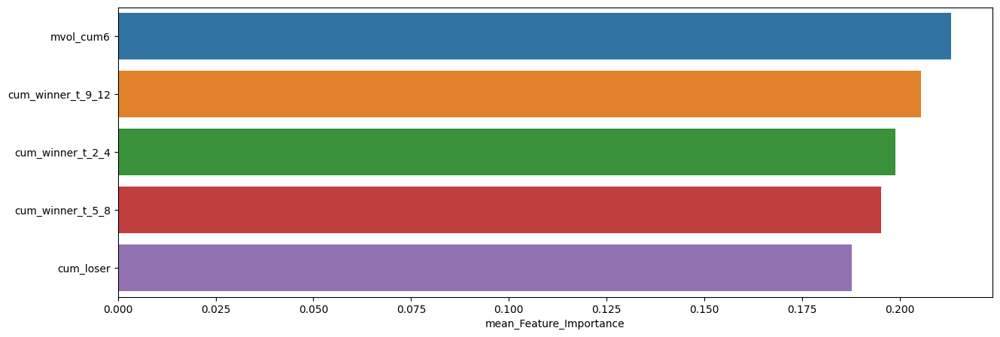

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.213018,0.246991,0.167048
cum_winner_t_9_12,0.205353,0.260746,0.169820
cum_winner_t_2_4,0.198756,0.238994,0.149006
cum_winner_t_5_8,0.195223,0.225065,0.164862
cum_loser,0.187650,0.229834,0.158104


In [58]:
Expanding_XGB_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Expanding', # Rolling Winodw Method (Fixed or Expanding)
                                  model=XGB, # 사용할 모델
                                  model_name='XGB', # 사용한 모델 명
                                  plot=True, # 모델 성능 지표 시각화 여부
                                  plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.34      0.28      0.31        75
         1.0       0.67      0.74      0.70       151

    accuracy                           0.58       226
   macro avg       0.51      0.51      0.51       226
weighted avg       0.56      0.58      0.57       226


accuracy : 0.584070796460177

precision : 0.6727272727272727

recall : 0.7350993377483444

F1-Score : 0.7025316455696202



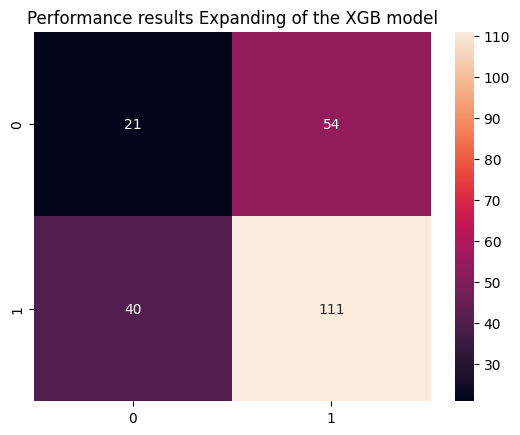


Feature Importance of the model



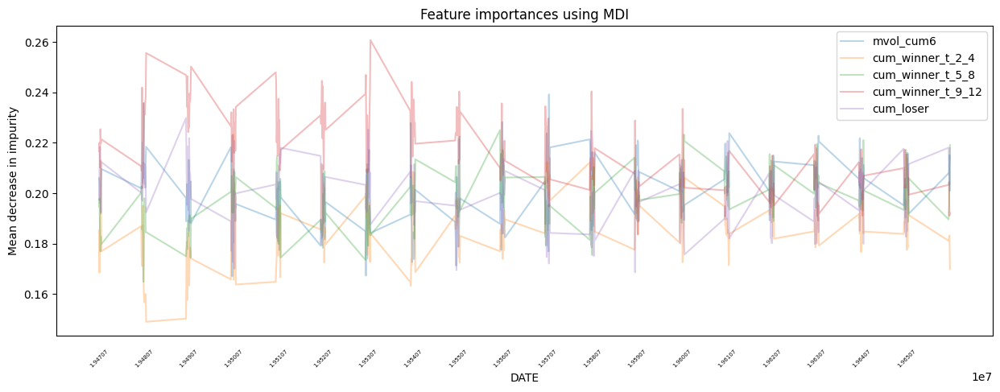

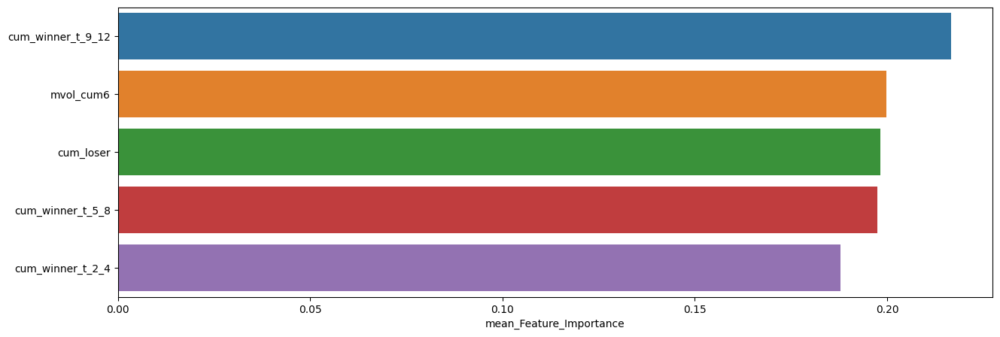

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_9_12,0.216585,0.260746,0.183591
mvol_cum6,0.199770,0.239188,0.167048
cum_loser,0.198236,0.229834,0.168614
cum_winner_t_5_8,0.197493,0.225065,0.164862
cum_winner_t_2_4,0.187916,0.223331,0.149006



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.28      0.23      0.25        75
         1.0       0.65      0.72      0.68       151

    accuracy                           0.55       226
   macro avg       0.47      0.47      0.47       226
weighted avg       0.53      0.55      0.54       226


accuracy : 0.5530973451327433

precision : 0.6506024096385542

recall : 0.7152317880794702

F1-Score : 0.6813880126182965



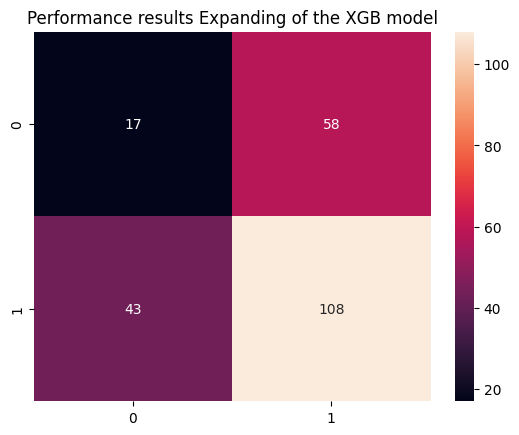


Feature Importance of the model



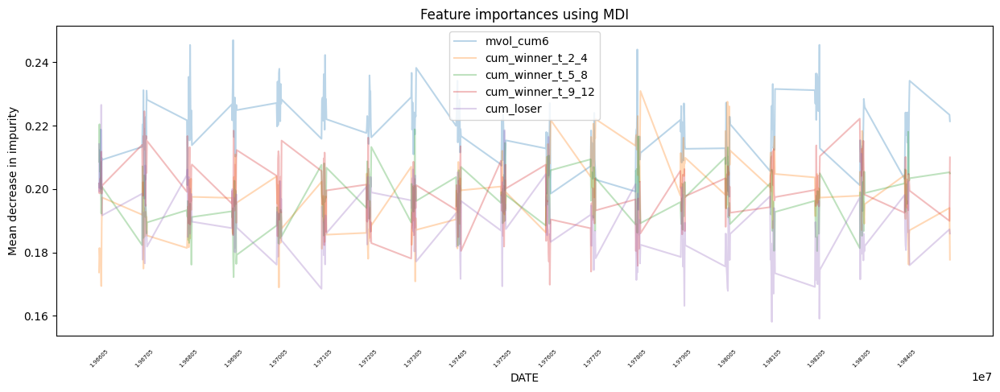

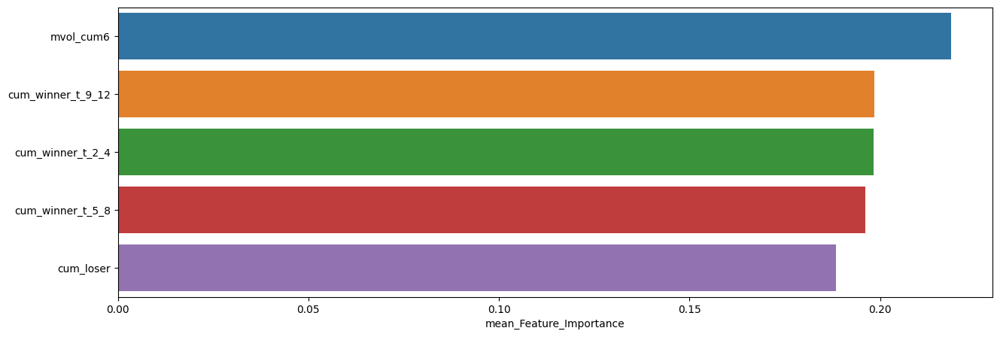

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.218589,0.246991,0.193076
cum_winner_t_9_12,0.198485,0.224539,0.169820
cum_winner_t_2_4,0.198243,0.230937,0.168958
cum_winner_t_5_8,0.196199,0.220436,0.172210
cum_loser,0.188484,0.226559,0.158104



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.34      0.26      0.29        70
         1.0       0.70      0.78      0.74       156

    accuracy                           0.62       226
   macro avg       0.52      0.52      0.51       226
weighted avg       0.59      0.62      0.60       226


accuracy : 0.6150442477876106

precision : 0.6994219653179191

recall : 0.7756410256410257

F1-Score : 0.7355623100303951



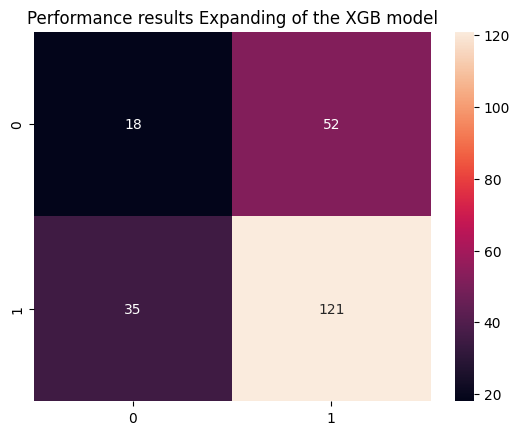


Feature Importance of the model



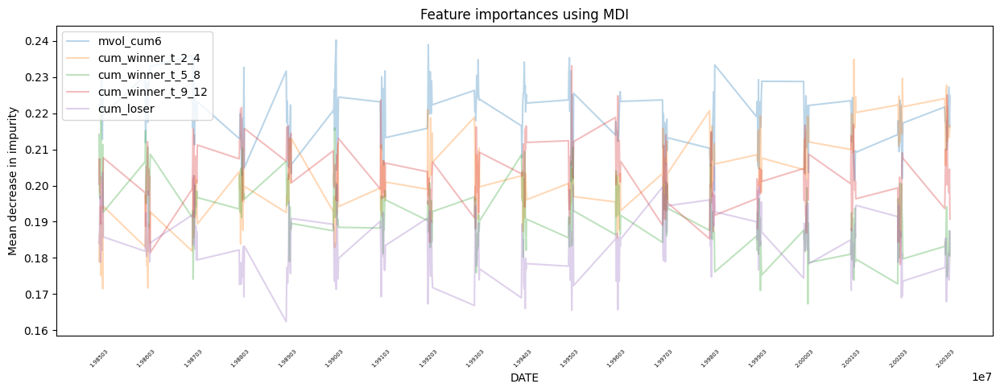

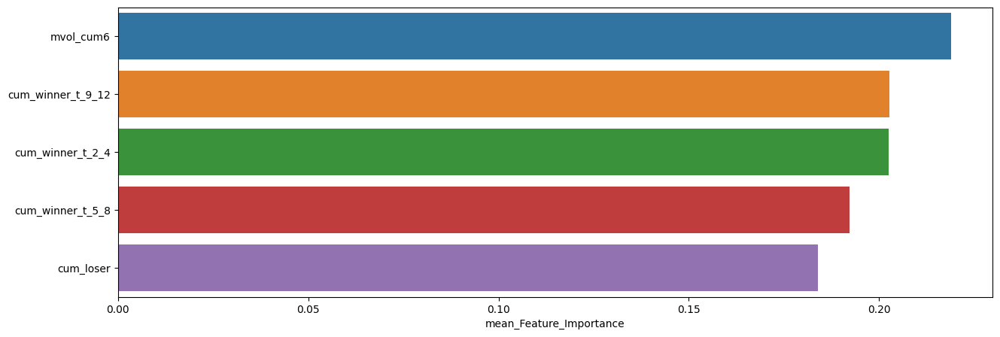

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.218835,0.240259,0.198635
cum_winner_t_9_12,0.202687,0.233166,0.178184
cum_winner_t_2_4,0.202461,0.234910,0.171519
cum_winner_t_5_8,0.192167,0.221322,0.167292
cum_loser,0.183851,0.206144,0.162338



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.44      0.29      0.35        96
         1.0       0.59      0.73      0.65       132

    accuracy                           0.54       228
   macro avg       0.51      0.51      0.50       228
weighted avg       0.52      0.54      0.52       228


accuracy : 0.543859649122807

precision : 0.5853658536585366

recall : 0.7272727272727273

F1-Score : 0.6486486486486487



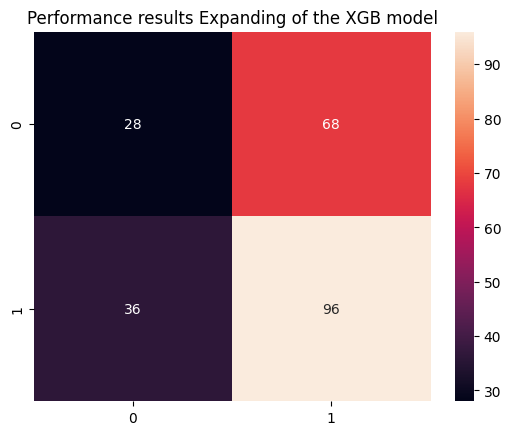


Feature Importance of the model



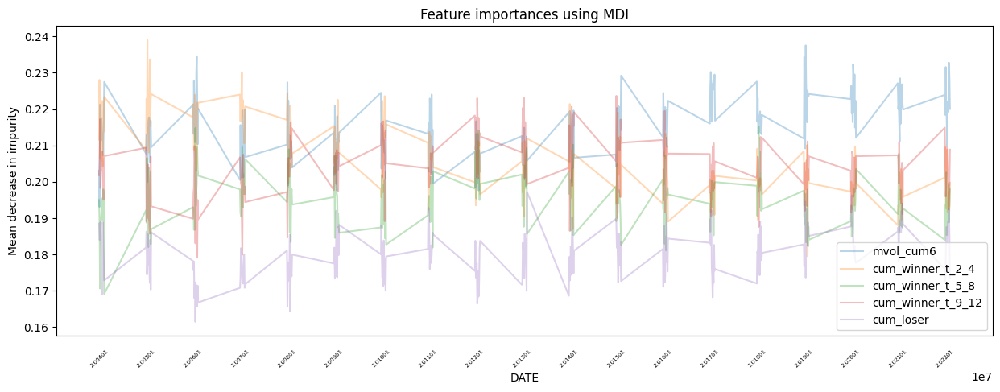

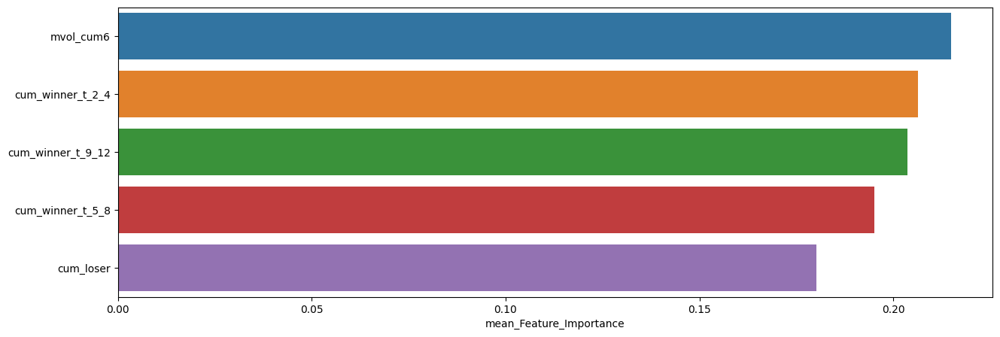

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.214861,0.237535,0.193096
cum_winner_t_2_4,0.206339,0.238994,0.179511
cum_winner_t_9_12,0.203671,0.223660,0.179193
cum_winner_t_5_8,0.195034,0.215227,0.169163
cum_loser,0.180094,0.197210,0.161475


In [59]:
slice_feature_importance(Expanding_XGB_Result, # 모델 추론 결과 데이터
                         4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                         'Expanding', # Rolling Windows Method
                         'XGB') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



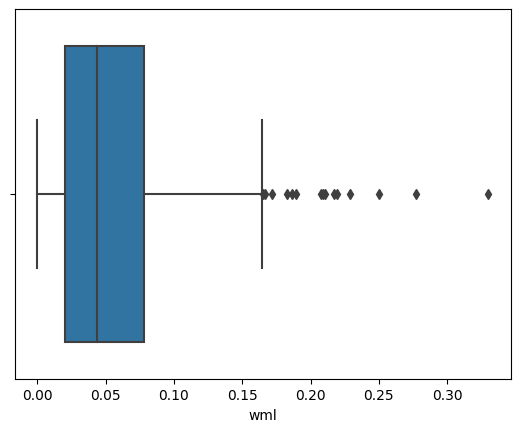

,count,mean,std,min,25%,50%,75%,max
wml,436.0,0.05548,0.048489,0.000007,0.019987,0.043612,0.078052,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



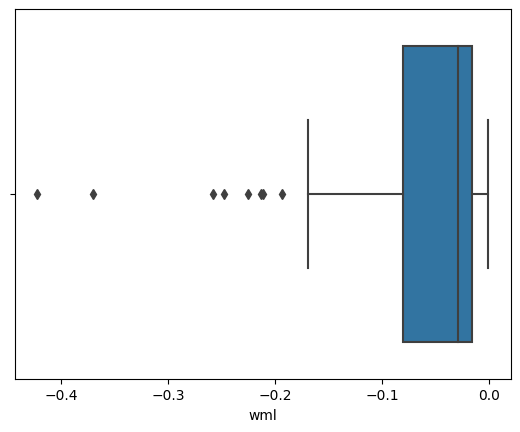

,count,mean,std,min,25%,50%,75%,max
wml,84.0,-0.065901,0.082183,-0.4224,-0.080073,-0.029223,-0.01599,-0.000506



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



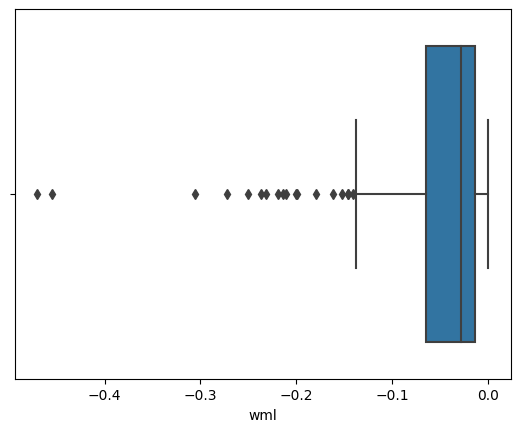

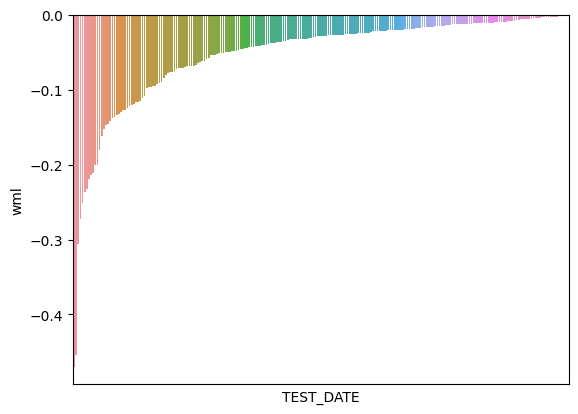

,count,mean,std,min,25%,50%,75%,max
wml,232.0,-0.052839,0.066689,-0.469903,-0.065239,-0.028501,-0.014437,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



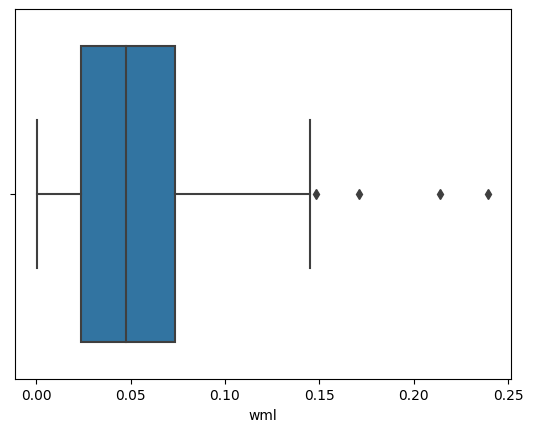

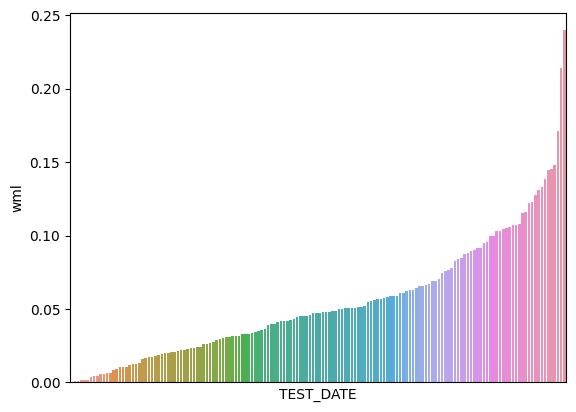

,count,mean,std,min,25%,50%,75%,max
wml,154.0,0.054597,0.041837,0.000577,0.023642,0.047487,0.073368,0.239571


In [60]:
XGB_A0_P1, XGB_A1_P0 = What_Pred(Expanding_XGB_Result, WML, 'XGB')

Sharpe Ratio : 0.66076

최근 누적 수익률

  2022년-12월 -> 18452.10
  2022년-11월 -> 16624.92
  2022년-10월 -> 16624.92
  2022년-09월 -> 14721.04
  2022년-08월 -> 13383.53

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2022년-12월 -> 18452.10
  2등 : 2022년-11월 -> 16624.92
  3등 : 2022년-10월 -> 16624.92
  4등 : 2016년-01월 -> 15879.50
  5등 : 2022년-09월 -> 14721.04
  6등 : 2015년-12월 -> 14661.59
  7등 : 2015년-11월 -> 14273.13
  8등 : 2016년-02월 -> 14028.67
  9등 : 2008년-11월 -> 13791.48
  10등 : 2022년-07월 -> 13682.59



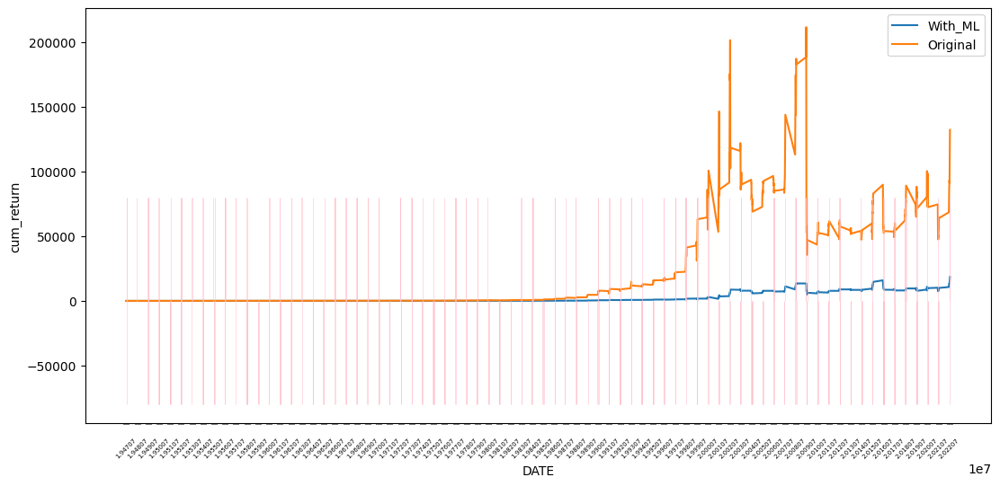

In [61]:
XGB_E_CUM_RETURN_static = cumm_return_by_dynamic(Expanding_XGB_Result,
                                                 WML,
                                                 'XGB_PRED_POS_WML',
                                                 XGB_A0_P1,
                                                 XGB_A1_P0,
                                                 plot=True)

Sharpe Ratio : 0.70428

최근 누적 수익률

  2022년-12월 -> 12116.68
  2022년-11월 -> 11069.67
  2022년-10월 -> 10982.61
  2022년-09월 -> 9893.20
  2022년-08월 -> 9282.58

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 12494.12
  2등 : 2008년-11월 -> 12376.53
  3등 : 2009년-01월 -> 12249.99
  4등 : 2008년-12월 -> 12157.31
  5등 : 2022년-12월 -> 12116.68
  6등 : 2008년-10월 -> 11518.18
  7등 : 2008년-06월 -> 11420.03
  8등 : 2008년-07월 -> 11191.86
  9등 : 2008년-09월 -> 11134.25
  10등 : 2008년-08월 -> 11077.81



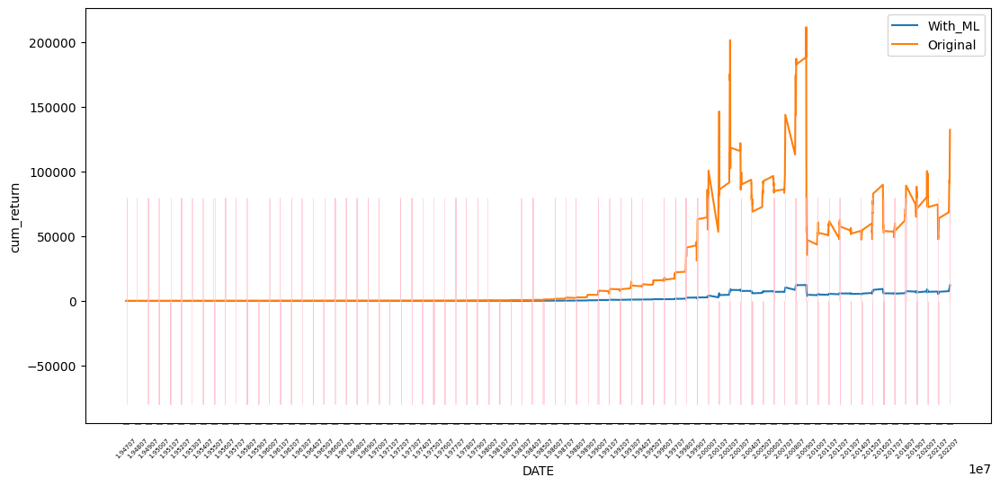

In [62]:
XGB_E_CUM_RETURN_dynamic = cumm_return_by_dynamic(Expanding_XGB_Result,
                                                 WML,
                                                 'XGB_PROB_POS_WML',
                                                 XGB_A0_P1,
                                                 XGB_A1_P0,
                                                 plot=True)

### LGBM

In [63]:
LGBM_param = {}
LGBM = LGBMClassifier(**LGBM_param, random_state=42)

**************************************************

LGBM Model의 Rolling Expanding Window를 실행합니다

설정된 Model의 하이퍼파리미터 : 

   boosting_type : gbdt
   class_weight : None
   colsample_bytree : 1.0
   importance_type : split
   learning_rate : 0.1
   max_depth : -1
   min_child_samples : 20
   min_child_weight : 0.001
   min_split_gain : 0.0
   n_estimators : 100
   n_jobs : -1
   num_leaves : 31
   objective : None
   random_state : 42
   reg_alpha : 0.0
   reg_lambda : 0.0
   silent : warn
   subsample : 1.0
   subsample_for_bin : 200000
   subsample_freq : 0

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.38      0.28      0.32       316
         1.0       0.66      0.75      0.70       590

    accuracy                           0.59       906
   macro avg       0.52      0.52      0.51       906
weighted avg       0.56      0.59      0.57       906


accuracy : 0.5883002207505519

precision : 0.6616989567809239

recall : 0.752542372881356

F1-Score : 0.704203013481364



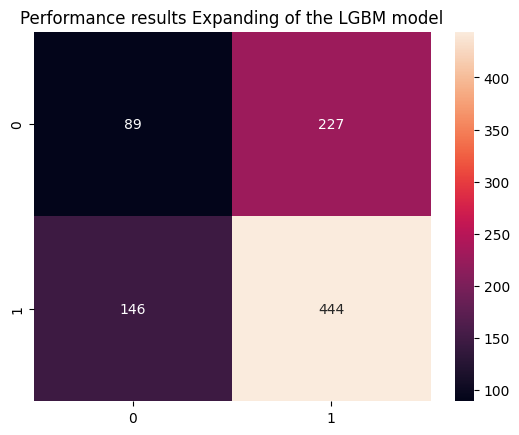


Feature Importance of the model



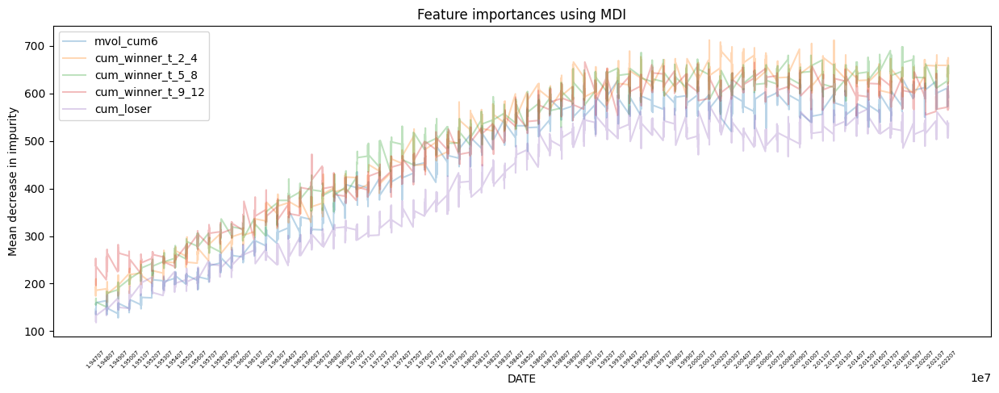

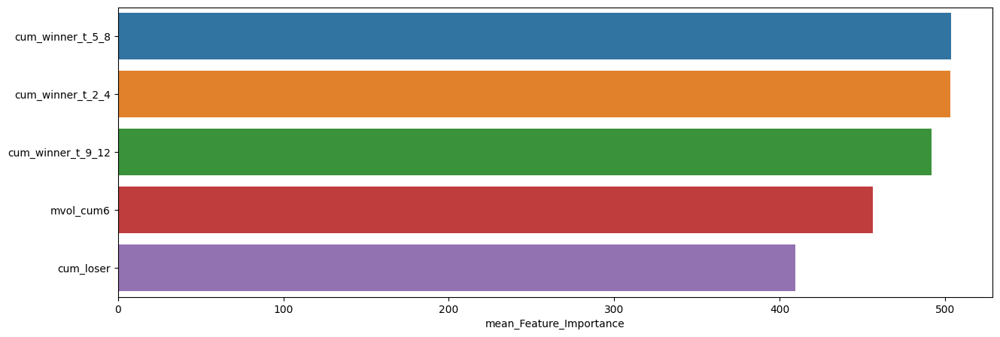

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,503.409492,698,151
cum_winner_t_2_4,503.104857,712,161
cum_winner_t_9_12,491.601545,666,196
mvol_cum6,456.043046,636,128
cum_loser,409.232892,593,118


In [64]:
Expanding_LGBM_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                    window_size=240, # window size (훈련 데이터 셋 크기)
                                    method='Expanding', # Rolling Winodw Method (Fixed or Expanding)
                                    model=LGBM, # 사용할 모델
                                    model_name='LGBM', # 사용한 모델 명
                                    plot=True, # 모델 성능 지표 시각화 여부
                                    plot_feature=True) # 모델의 변수 중요도 시각화 여부


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.35      0.37        75
         1.0       0.70      0.75      0.72       151

    accuracy                           0.62       226
   macro avg       0.55      0.55      0.55       226
weighted avg       0.60      0.62      0.61       226


accuracy : 0.6150442477876106

precision : 0.6975308641975309

recall : 0.7483443708609272

F1-Score : 0.7220447284345048



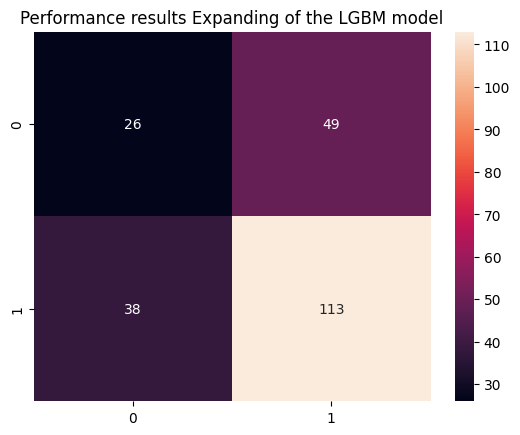


Feature Importance of the model



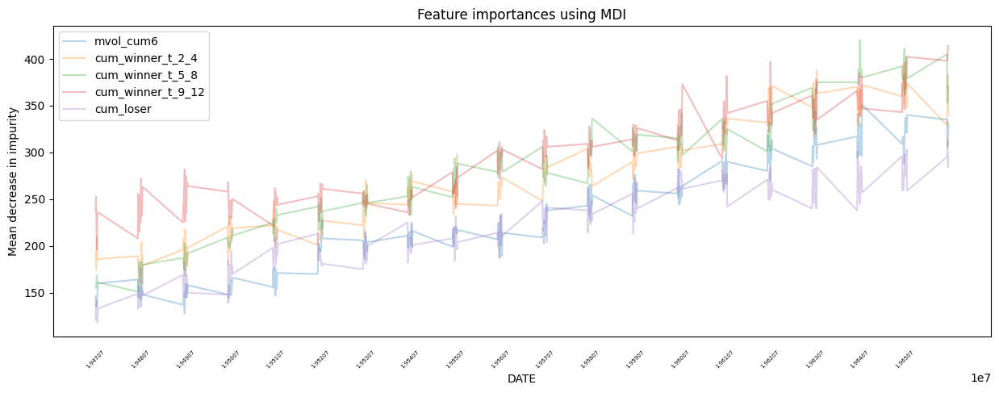

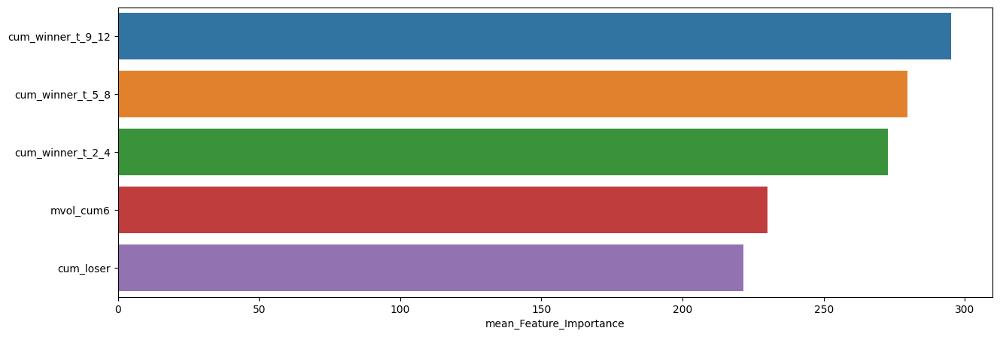

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_9_12,295.039823,414,196
cum_winner_t_5_8,279.730088,420,151
cum_winner_t_2_4,272.676991,394,161
mvol_cum6,230.199115,351,128
cum_loser,221.451327,313,118



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.34      0.28      0.31        75
         1.0       0.67      0.73      0.70       151

    accuracy                           0.58       226
   macro avg       0.50      0.50      0.50       226
weighted avg       0.56      0.58      0.57       226


accuracy : 0.5796460176991151

precision : 0.6707317073170732

recall : 0.7284768211920529

F1-Score : 0.6984126984126985



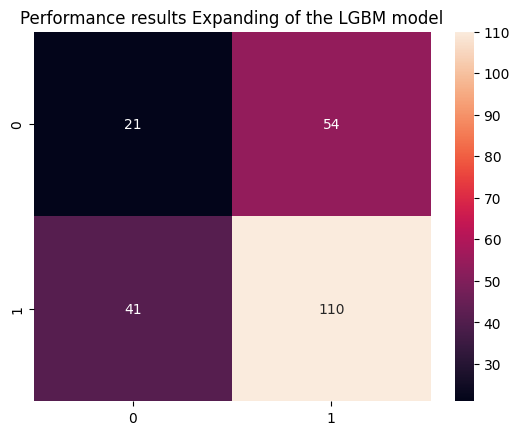


Feature Importance of the model



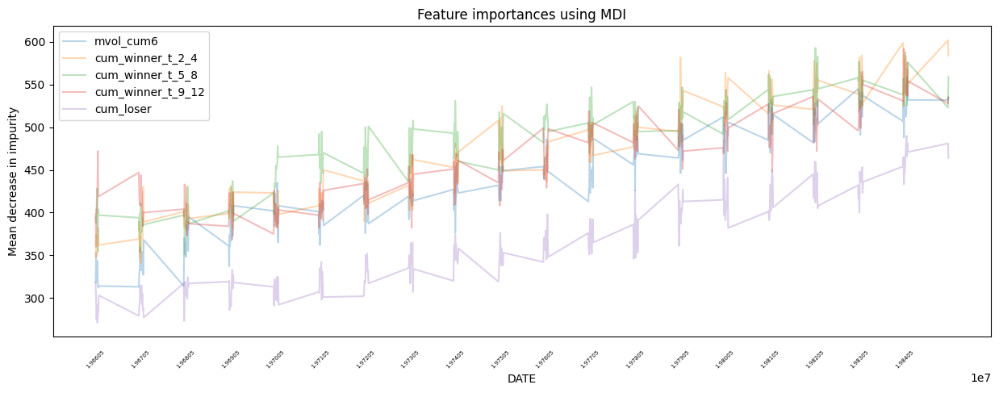

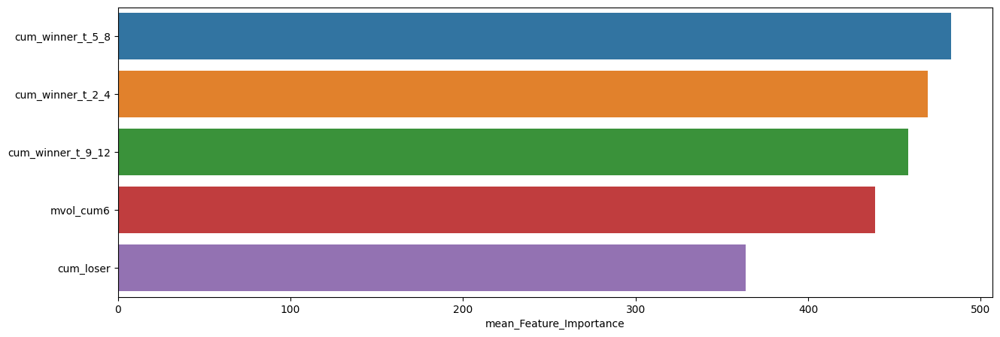

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,482.738938,593,351
cum_winner_t_2_4,469.274336,602,341
cum_winner_t_9_12,458.079646,592,360
mvol_cum6,438.610619,559,312
cum_loser,363.619469,490,271



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.30      0.19      0.23        70
         1.0       0.69      0.80      0.74       156

    accuracy                           0.61       226
   macro avg       0.49      0.49      0.48       226
weighted avg       0.57      0.61      0.58       226


accuracy : 0.6106194690265486

precision : 0.6868131868131868

recall : 0.8012820512820513

F1-Score : 0.7396449704142012



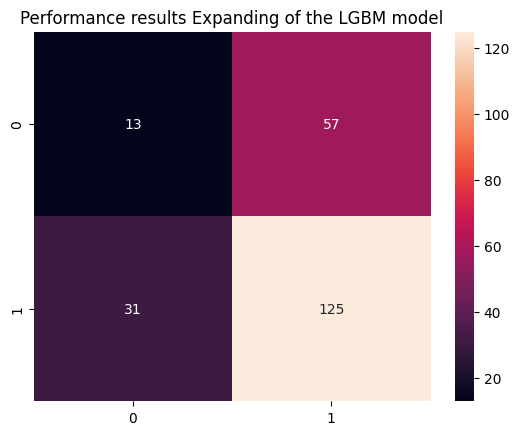


Feature Importance of the model



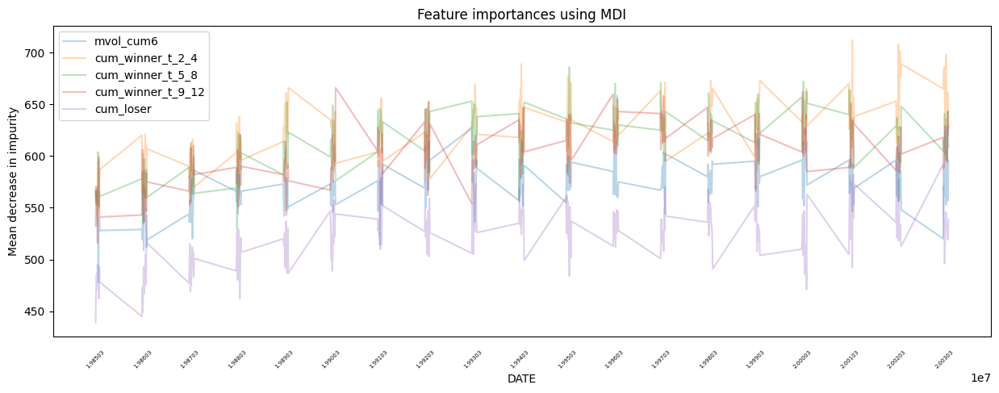

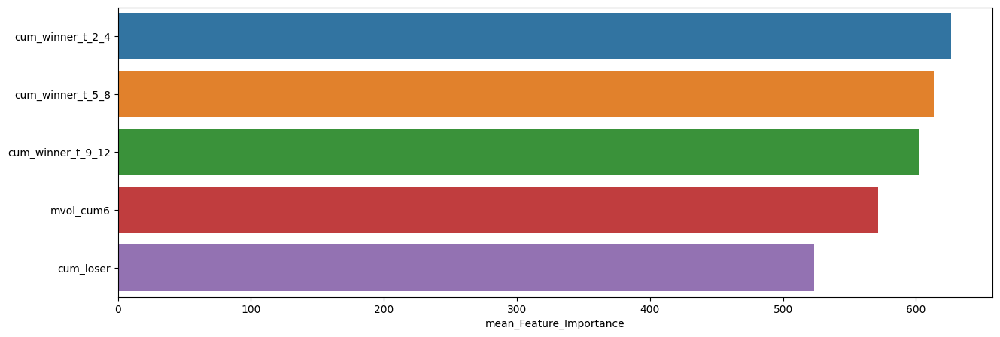

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_2_4,626.225664,712,533
cum_winner_t_5_8,613.265487,686,529
cum_winner_t_9_12,601.814159,666,516
mvol_cum6,571.530973,628,478
cum_loser,523.676991,593,439



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.45      0.30      0.36        96
         1.0       0.59      0.73      0.65       132

    accuracy                           0.55       228
   macro avg       0.52      0.51      0.51       228
weighted avg       0.53      0.55      0.53       228


accuracy : 0.5482456140350878

precision : 0.588957055214724

recall : 0.7272727272727273

F1-Score : 0.6508474576271187



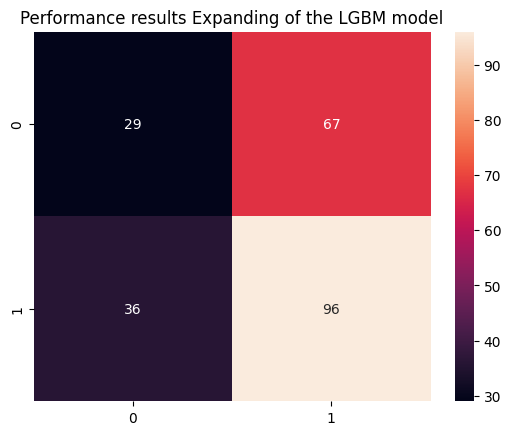


Feature Importance of the model



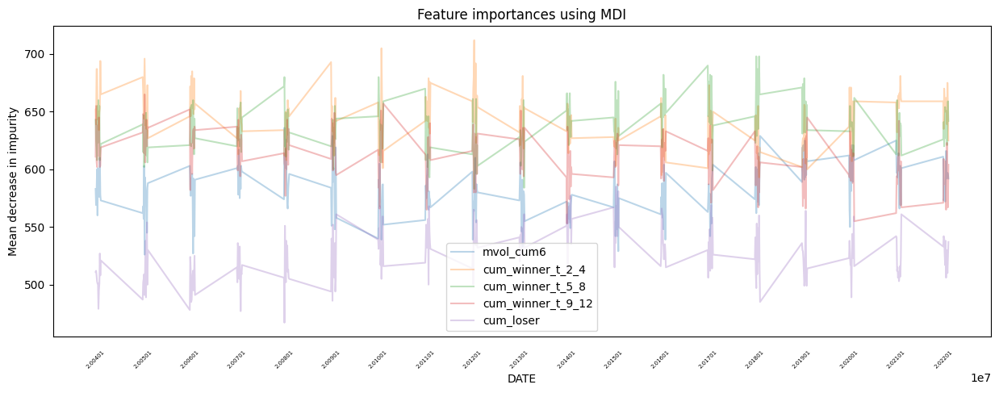

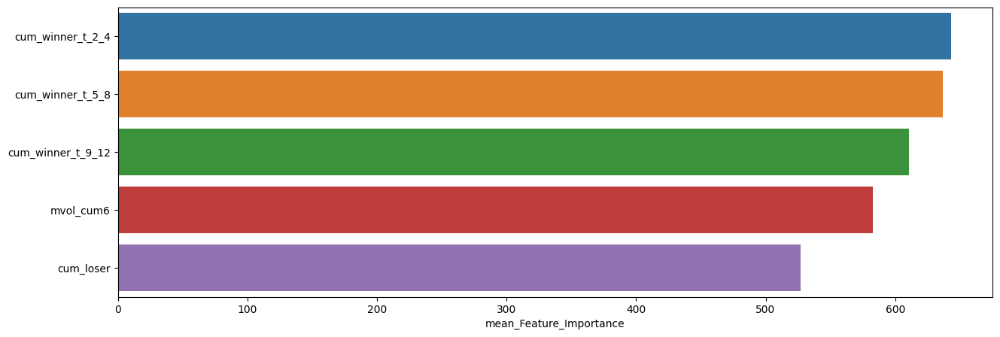

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_2_4,643.004386,712,593
cum_winner_t_5_8,636.723684,698,583
cum_winner_t_9_12,610.421053,665,553
mvol_cum6,582.710526,636,526
cum_loser,527.140351,585,467


In [65]:
slice_feature_importance(Expanding_LGBM_Result, # 모델 추론 결과 데이터
                        4, # 나눌 구간 수 (If None : 특정 구간 입력) 
                        'Expanding', # Rolling Windows Method
                        'LGBM') # 모델 명


IQR 기준 WML 이상치 (Maximum 미만) 개수

Number of Outlier by IQR (Maximum) : 16
Maximum by IQR : 0.1670798809375
Max Outlier : 0.3301628157
Min Outlier : 0.1709176029

ACTUAL = PRED = 1



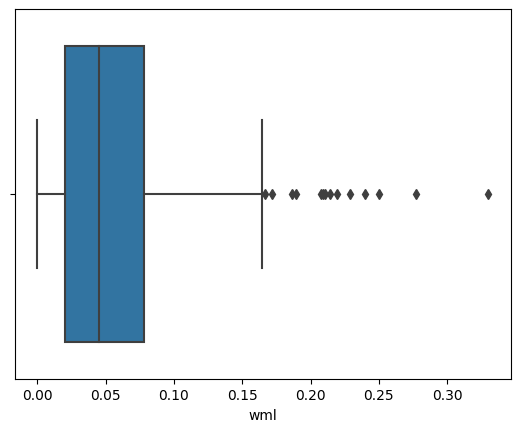

,count,mean,std,min,25%,50%,75%,max
wml,444.0,0.055718,0.048631,0.000007,0.020054,0.045171,0.077935,0.330163



--------------------------------------------------------------------------------


IQR 기준 WML 이상치 (Minimum 미만) 개수

Number of Outlier by IQR (Minimum) : 40
Minimun by IQR : -0.1267517369625
Max Outlier : -0.127277386
Min Outlier : -0.469903035

ACTUAL = PRED = 0



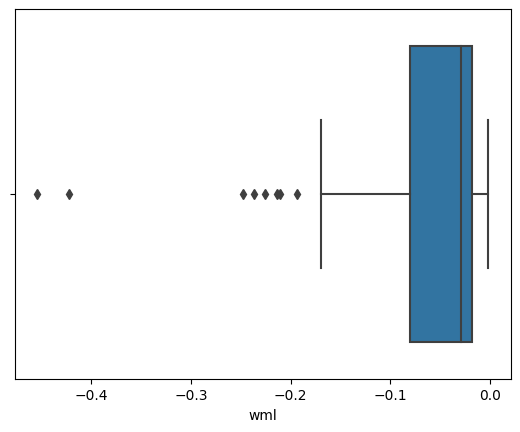

,count,mean,std,min,25%,50%,75%,max
wml,89.0,-0.064539,0.082765,-0.454349,-0.080118,-0.028629,-0.017886,-0.00129



--------------------------------------------------------------------------------


ACTUAL = 0 &  PRED = 1



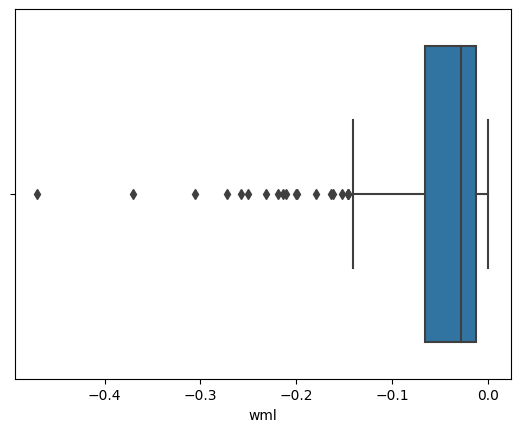

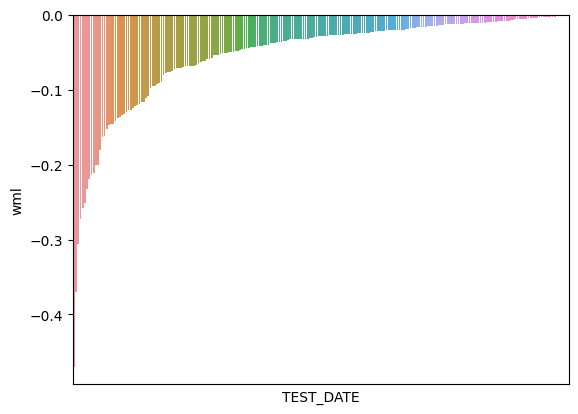

,count,mean,std,min,25%,50%,75%,max
wml,227.0,-0.053085,0.066094,-0.469903,-0.065645,-0.028532,-0.012953,-0.000132



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



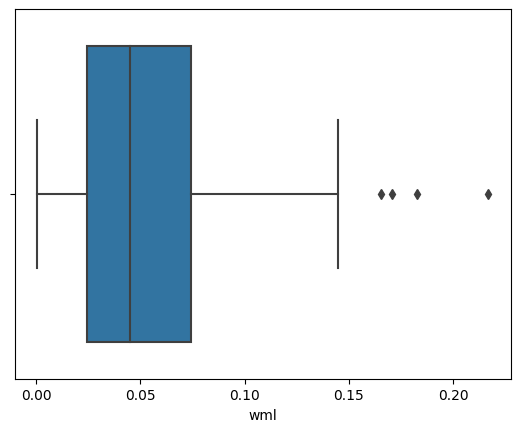

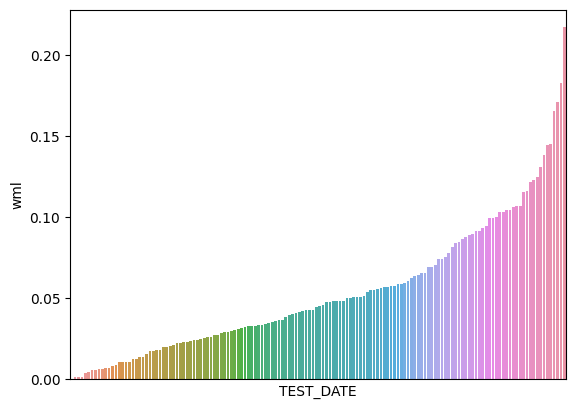

,count,mean,std,min,25%,50%,75%,max
wml,146.0,0.053824,0.040901,0.000577,0.024233,0.044955,0.074314,0.216883


In [66]:
LGBM_A0_P1, LGBM_A1_P0 = What_Pred(Expanding_LGBM_Result,
                                   WML,
                                   'LGBM')

Sharpe Ratio : 0.62347

최근 누적 수익률

  2022년-12월 -> 40078.56
  2022년-11월 -> 36109.98
  2022년-10월 -> 36109.98
  2022년-09월 -> 31974.82
  2022년-08월 -> 31974.82

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2022년-12월 -> 40078.56
  2등 : 2022년-11월 -> 36109.98
  3등 : 2022년-10월 -> 36109.98
  4등 : 2022년-09월 -> 31974.82
  5등 : 2022년-08월 -> 31974.82
  6등 : 2022년-07월 -> 31974.82
  7등 : 2022년-06월 -> 30635.60
  8등 : 2022년-05월 -> 30247.73
  9등 : 2016년-01월 -> 28385.65
  10등 : 2022년-04월 -> 28371.72



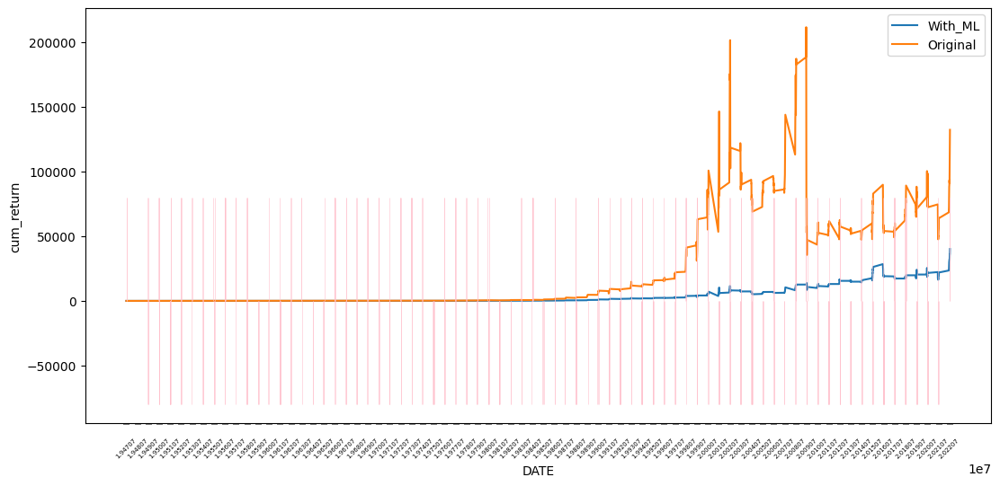

In [67]:
LGBM_E_CUM_RETURN_static = cumm_return_by_dynamic(Expanding_LGBM_Result, # 모델 추론 결과 데이터
                                                   WML, # 원본 데이터의 'wml' 데이터
                                                   'LGBM_PRED_POS_WML', # 모델 추론 결과 칼럼
                                                   LGBM_A0_P1,
                                                   LGBM_A1_P0,
                                                   plot=True) # 시각화 여부

Sharpe Ratio : 0.70899

최근 누적 수익률

  2022년-12월 -> 15790.98
  2022년-11월 -> 14493.15
  2022년-10월 -> 14167.97
  2022년-09월 -> 12933.98
  2022년-08월 -> 12344.41

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2022년-12월 -> 15790.98
  2등 : 2022년-11월 -> 14493.15
  3등 : 2022년-10월 -> 14167.97
  4등 : 2016년-01월 -> 13056.19
  5등 : 2022년-09월 -> 12933.98
  6등 : 2022년-07월 -> 12458.92
  7등 : 2022년-08월 -> 12344.41
  8등 : 2015년-12월 -> 12100.45
  9등 : 2022년-06월 -> 12046.83
  10등 : 2022년-05월 -> 11903.34



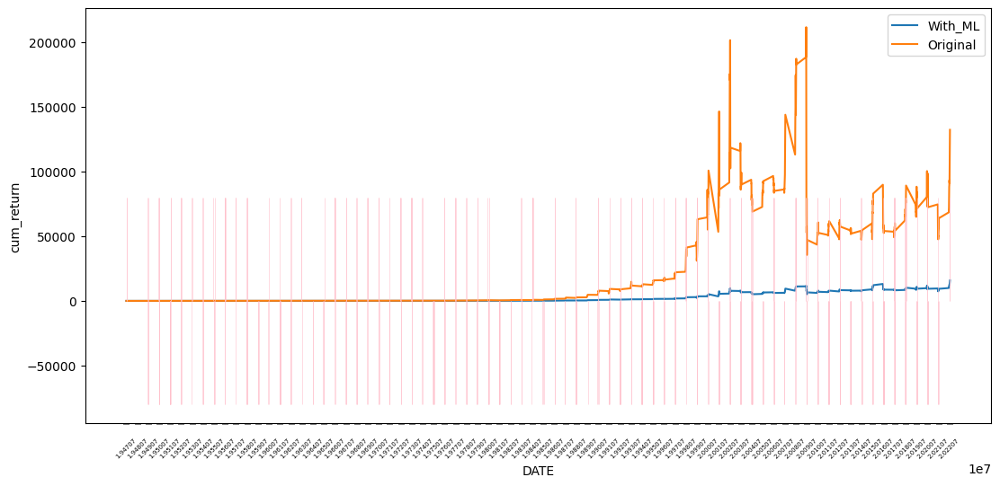

In [68]:
LGBM_E_CUM_RETURN_dynamic = cumm_return_by_dynamic(Expanding_LGBM_Result, # 모델 추론 결과 데이터
                                                   WML, # 원본 데이터의 'wml' 데이터
                                                   'LGBM_PROB_POS_WML', # 모델 추론 결과 칼럼
                                                   LGBM_A0_P1,
                                                   LGBM_A1_P0,
                                                   plot=True) # 시각화 여부

# Performance

## F1 - Score

RDF의 F1-Score : 0.7197549770290964
GBC의 F1-Score : 0.7134052388289676
XGB의 F1-Score : 0.7084988085782367
LGBM의 F1-Score : 0.7060702875399362



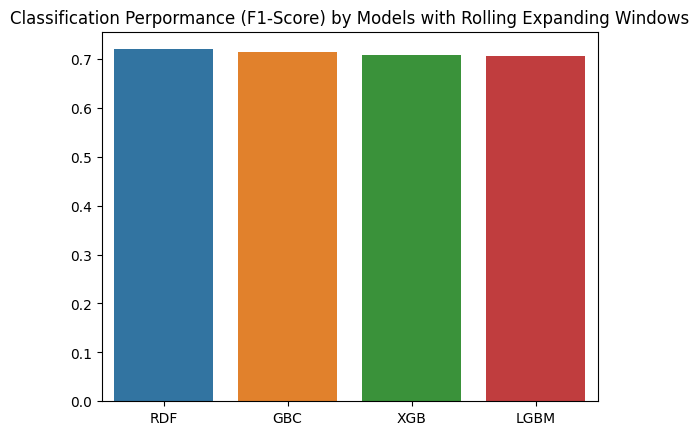

In [69]:
list_model = ['RDF', 'GBC', 'XGB', 'LGBM']
list_result = [Fixed_RDF_Result, Fixed_GBC_Result, Fixed_XGB_Result, Fixed_LGBM_Result]

list_f1 = []

for model, data in zip(list_model, list_result):
  F1 = f1_score(data['Actual_POS_WML'], data[f'{model}_PRED_POS_WML'])
  print(f'{model}의 F1-Score : {F1}')
  list_f1.append(F1)
print()

sns.barplot(x=list_model, y=list_f1)
plt.title('Classification Perpormance (F1-Score) by Models with Rolling Expanding Windows')
plt.show()

RDF의 F1-Score : 0.7325227963525835
GBC의 F1-Score : 0.7476363636363635
XGB의 F1-Score : 0.6931637519872814
LGBM의 F1-Score : 0.704203013481364



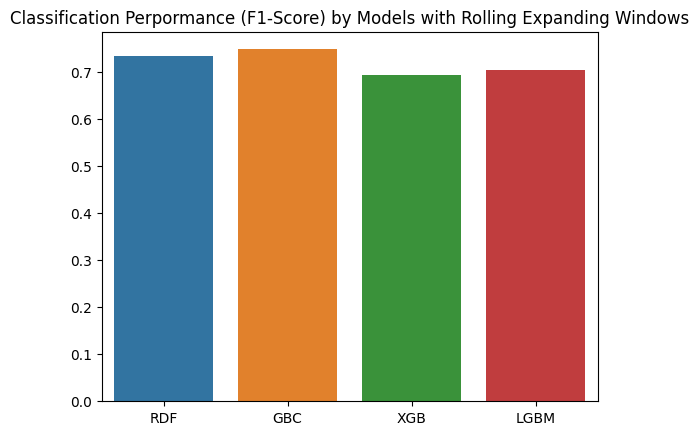

In [70]:
list_model = ['RDF', 'GBC', 'XGB', 'LGBM']
list_result = [Expanding_RDF_Result, Expanding_GBC_Result, Expanding_XGB_Result, Expanding_LGBM_Result]

list_f1 = []

for model, data in zip(list_model, list_result):
  F1 = f1_score(data['Actual_POS_WML'], data[f'{model}_PRED_POS_WML'])
  print(f'{model}의 F1-Score : {F1}')
  list_f1.append(F1)
print()

sns.barplot(x=list_model, y=list_f1)
plt.title('Classification Perpormance (F1-Score) by Models with Rolling Expanding Windows')
plt.show()

## Cum Return & Sharpe Ratio

In [71]:
R_WML = WML.loc[19470731:].copy()
CUM_WML = WML.loc[19470731:].copy()

CUM_WML['wml'] = (1 + CUM_WML.wml).cumprod() - 1
CUM_WML.columns = ['cum_return'] 

last_r = CUM_WML['cum_return'].values[-1]
w_S = (R_WML['wml'].mean()/R_WML['wml'].std()) * math.sqrt(12)

In [72]:
def compare_sharpe_ratio(list_model, list_result, list_cum, dynamic=True):

  print('{} Sharpe Ratio : {:0.4f}  최종 누적 수익률 : {}'.format('ORG', w_S, last_r))

  for model, data, cum in zip(list_model, list_result, list_cum):
    data['wml'] = WML.loc[19470731:]['wml']

    if dynamic == True:

      data[f'{model}_PROB_WML'] = data['wml'] * data[f'{model}_PROB_POS_WML']
      S = (data[f'{model}_PROB_WML'].mean()/data[f'{model}_PROB_WML'].std())*math.sqrt(12)

      C = list(cum['cum_return'])[-1]
      print('{} Sharpe Ratio : {:0.4f}  최종 누적 수익률 : {}'.format(model, S, C))

      sns.lineplot(data=cum, x=data.index, y='cum_return', alpha=0.7, label=model)

    else:

      data[f'{model}_PRED_WML'] = data['wml'] * data[f'{model}_PRED_POS_WML']
      S = (data[f'{model}_PRED_WML'].mean()/data[f'{model}_PRED_WML'].std())*math.sqrt(12)

      C = list(cum['cum_return'])[-1]
      print('{} Sharpe Ratio : {:0.4f}  최종 누적 수익률 : {}'.format(model, S, C))
      
      sns.lineplot(data=cum, x=data.index, y='cum_return', alpha=0.7, label=model)

  sns.lineplot(data=CUM_WML, x=CUM_WML.index, y='cum_return', alpha=0.7, label='ORG')
  plt.title('Sharpe Ratio & Cum Return by Model')
  plt.xticks([CUM_WML.index[i] for i in range(0,len(CUM_WML.index), 12)])
  plt.tick_params(axis='x',
                    direction='out',
                    labelrotation=45,
                    length=1,
                    pad=10,
                    labelsize=1,
                    width=0.1)
  plt.show()

### Rolling Fixed Windows

#### Static

ORG Sharpe Ratio : 0.7293  최종 누적 수익률 : 132103.15024526353
RDF Sharpe Ratio : 0.6259  최종 누적 수익률 : 7538.376101649626
GBC Sharpe Ratio : 0.5731  최종 누적 수익률 : 2961.098198210006
XGB Sharpe Ratio : 0.6267  최종 누적 수익률 : 7292.595686863801
LGBM Sharpe Ratio : 0.5890  최종 누적 수익률 : 3739.5141228700586


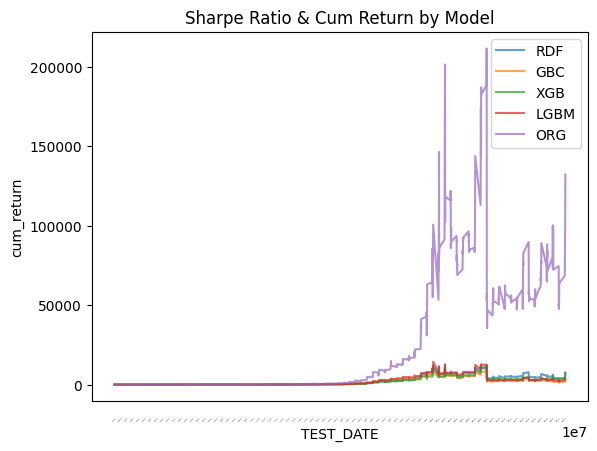

In [73]:
compare_sharpe_ratio(['RDF', 'GBC', 'XGB', 'LGBM'],
                     [Fixed_RDF_Result, Fixed_GBC_Result, Fixed_XGB_Result, Fixed_LGBM_Result],
                     [RDF_F_CUM_RETURN_static, GBC_F_CUM_RETURN_static, XGB_F_CUM_RETURN_static, LGBM_F_CUM_RETURN_static],
                     dynamic=False)

#### Dynamic

ORG Sharpe Ratio : 0.7293  최종 누적 수익률 : 132103.15024526353
RDF Sharpe Ratio : 0.7457  최종 누적 수익률 : 5279.815756822656
GBC Sharpe Ratio : 0.7415  최종 누적 수익률 : 8147.678339593288
XGB Sharpe Ratio : 0.6971  최종 누적 수익률 : 8577.599046589497
LGBM Sharpe Ratio : 0.6988  최종 누적 수익률 : 5347.32938595278


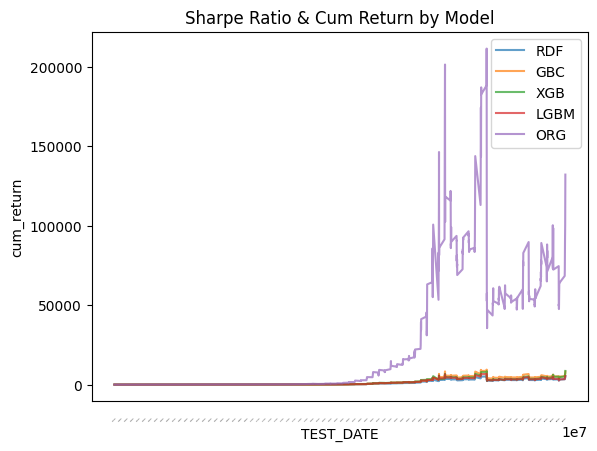

In [74]:
compare_sharpe_ratio(['RDF', 'GBC', 'XGB', 'LGBM'],
                     [Fixed_RDF_Result, Fixed_GBC_Result, Fixed_XGB_Result, Fixed_LGBM_Result],
                     [RDF_F_CUM_RETURN_dynamic, GBC_F_CUM_RETURN_dynamic, XGB_F_CUM_RETURN_dynamic, LGBM_F_CUM_RETURN_dynamic],
                     dynamic=True)

### Rolling Expanding Windows

#### Static

ORG Sharpe Ratio : 0.7293  최종 누적 수익률 : 132103.15024526353
RDF Sharpe Ratio : 0.7836  최종 누적 수익률 : 80776.24487602842
GBC Sharpe Ratio : 0.6437  최종 누적 수익률 : 14726.02215681786
XGB Sharpe Ratio : 0.6964  최종 누적 수익률 : 18452.099868808888
LGBM Sharpe Ratio : 0.7414  최종 누적 수익률 : 40078.56075710636


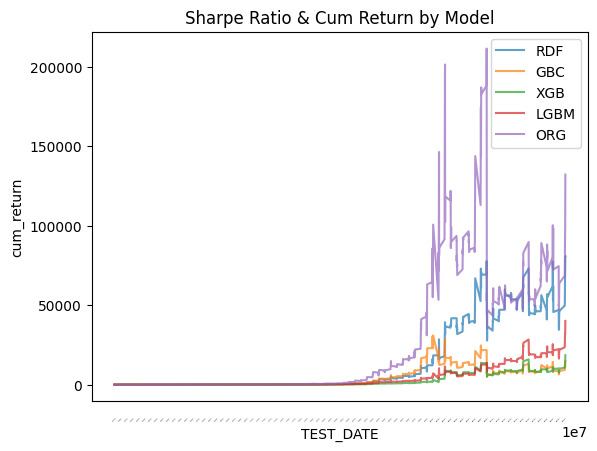

In [75]:
compare_sharpe_ratio(['RDF', 'GBC', 'XGB', 'LGBM'],
                     [Expanding_RDF_Result, Expanding_GBC_Result, Expanding_XGB_Result, Expanding_LGBM_Result],
                     [RDF_E_CUM_RETURN_static, GBC_E_CUM_RETURN_static, XGB_E_CUM_RETURN_static, LGBM_E_CUM_RETURN_static],
                     dynamic=False)

#### Dynamic

ORG Sharpe Ratio : 0.7293  최종 누적 수익률 : 132103.15024526353
RDF Sharpe Ratio : 0.7942  최종 누적 수익률 : 6999.657225551939
GBC Sharpe Ratio : 0.7581  최종 누적 수익률 : 5666.399924027943
XGB Sharpe Ratio : 0.7347  최종 누적 수익률 : 12116.67520923116
LGBM Sharpe Ratio : 0.7892  최종 누적 수익률 : 15790.98475419524


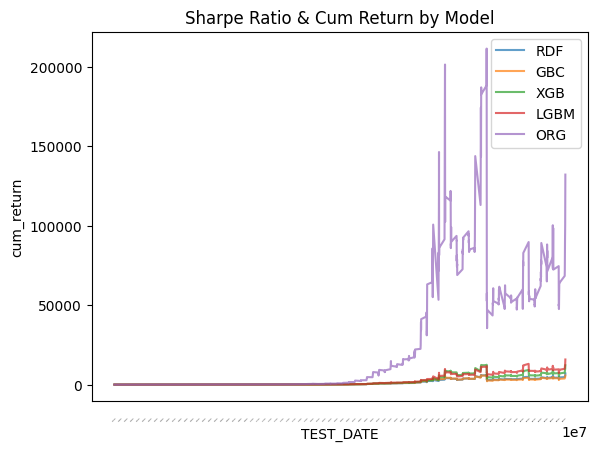

In [76]:
compare_sharpe_ratio(['RDF', 'GBC', 'XGB', 'LGBM'],
                     [Expanding_RDF_Result, Expanding_GBC_Result, Expanding_XGB_Result, Expanding_LGBM_Result],
                     [RDF_E_CUM_RETURN_dynamic, GBC_E_CUM_RETURN_dynamic, XGB_E_CUM_RETURN_dynamic, LGBM_E_CUM_RETURN_dynamic],
                     dynamic=True)